# MIT Liscence

Copyright (c) 2023 Shruti Milind Randive

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# Dataset Description
The notebook which I have selected gives data about the COVID-19 United States vaccination progress based on different locations in United States

**location**- this is the country for which the vaccination information is provided;

**iso_code** - ISO code for the country;

**date**- date for the data entry; for some of the dates we have only the daily vaccinations, for others, only the (cumulative) total;

**total_vaccinations** - this is the absolute number of total immunizations in the country;

**people_vaccinated** - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;

**total_boosters** - number of people taken booster does in the country

**people_fully_vaccinated** - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;

**daily_vaccinations (raw)** - for a certain data entry, the number of vaccination for that date/country;

**daily_vaccinations** - for a certain data entry, the number of vaccination for that date/country;

**total_vaccinations_per_hundred** - ratio (in percent) between vaccination number and total population up to the date in the country;

**people_vaccinated_per_hundred** - ratio (in percent) between population immunized and total population up to the date in the country

**people_fully_vaccinated_per_hundred**	- ratio (in percent) between population fully immunized and total population up to the date in the country

**total_boosters_per_hundred** - ration between population taken booster does and total population

**daily_vaccinations**	 - number of daily vaccination for that day and country

**daily_vaccinations_per_million**- ratio (in ppm) between vaccination number and total population for the current date in the country;


# Import libraries

In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install sklearn
!pip install -U scikit-learn --user
!pip install pdpbox
!pip install numpy Cython
!pip install fitter

#!pip install matplotlib
!pip install --upgrade matplotlib
import matplotlib.pylab as plt
!pip install matplotlib==3.1.1


import pandas as pd
import numpy as np
import seaborn as sns
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
#from sklearn.ensemble import partial_dependence
#from sklearn.ensemble import plot_partial_dependence
#from sklearn.inspection import plot_partial_dependence
#from sklearn.inspection import plot_partial_dependence, partial_dependence
#sklearn.ensemble.partial_dependence.plot_partial_dependence
from sklearn.inspection import PartialDependenceDisplay
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from plotly.subplots import make_subplots
from fitter import Fitter, get_common_distributions, get_distributions

#for outliers
!pip install datasist
from datasist.structdata import detect_outliers

from sklearn.metrics import mean_squared_error,r2_score
import plotly.graph_objects as go
import datetime
from statsmodels.tsa.arima_model import ARIMA
from fitter import Fitter, get_common_distributions, get_distributions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

# Import Kaggle Dataset

In [170]:
vaccine_data = pd.read_csv("https://raw.githubusercontent.com/shrutirandive/Covid_Vaccine/main/vaccinations.csv")
vaccine_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161981 entries, 0 to 161980
Data columns (total 16 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   location                             161981 non-null  object 
 1   iso_code                             161981 non-null  object 
 2   date                                 161981 non-null  object 
 3   total_vaccinations                   73425 non-null   float64
 4   people_vaccinated                    70318 non-null   float64
 5   people_fully_vaccinated              68000 non-null   float64
 6   total_boosters                       42225 non-null   float64
 7   daily_vaccinations_raw               60666 non-null   float64
 8   daily_vaccinations                   160761 non-null  float64
 9   total_vaccinations_per_hundred       73425 non-null   float64
 10  people_vaccinated_per_hundred        70318 non-null   float64
 11  people_fully_

# **What is the question?**

The COVID-19 pandemic has affected countries worldwide, and vaccination has been a key strategy to control the spread of the virus. In this machine learning project, the focus is on analyzing COVID-19 vaccination data from different countries to predict the total number of vaccinations given based on the available features.

The dataset used for this regression model includes various features related to the number of vaccinations given, the population, and the country. Some of the features included in the dataset may include the total number of people vaccinated, the total number of people fully vaccinated, the daily vaccinations, the daily vaccinations per million people, the percentage of the population vaccinated, and the GDP per capita of the country.

The goal of the analysis is to develop a predictive model that can accurately predict the total number of vaccinations based on the available features. This can be achieved by training machine learning models on the dataset, such as linear regression, random forest regressor, SVM model, and MLP regressor. The models can be evaluated based on their accuracy in predicting the total number of vaccinations.

The results of the analysis can provide insights into the factors that influence the total number of vaccinations given in different countries. This can help policymakers and healthcare professionals in making informed decisions on how to allocate resources and develop strategies for controlling the spread of the COVID-19 virus.


**Independent Variables** - country, iso-code, date,  people_vaccinated, daily_vaccinations, total boosters

**Dependent Variables** - total_vaccinations,people_fully_vaccinated, total_vaccinations_per_hundred,	people_vaccinated_per_hundred,	people_fully_vaccinated_per_hundred,daily_vaccinations_per_million	  


In [171]:
vaccine_data.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
0,Afghanistan,AFG,2021-02-22,0,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367,NaN,NaN,NaN,NaN,33,1367,0
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367,NaN,NaN,NaN,NaN,33,1367,0
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367,NaN,NaN,NaN,NaN,33,1367,0
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367,NaN,NaN,NaN,NaN,33,1367,0


# Exploratory Data Analysis (EDA)

# Data Cleaning

In [172]:
selected_data = vaccine_data.loc[vaccine_data['location'] == 'United States', vaccine_data.columns != 'id']

# Create a new dataframe from the selected data
data = pd.DataFrame(selected_data)
print(data.shape)
data.tail()

(829, 16)


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
153375,United States,USA,2023-03-17,673393992.0,269819267.0,230274516.0,NaN,56567.0,47550.0,202.82,81.27,69.36,NaN,143.0,10042.0,0.003
153376,United States,USA,2023-03-18,673415307.0,269824345.0,230276885.0,NaN,21315.0,46467.0,202.83,81.27,69.36,NaN,140.0,9816.0,0.003
153377,United States,USA,2023-03-19,673425564.0,269827472.0,230277963.0,NaN,10257.0,45751.0,202.83,81.27,69.36,NaN,138.0,9678.0,0.003
153378,United States,USA,2023-03-20,673458097.0,269834492.0,230281943.0,NaN,32533.0,41973.0,202.84,81.27,69.36,NaN,126.0,8932.0,0.003
153379,United States,USA,2023-03-21,673465377.0,269835963.0,230283056.0,NaN,7280.0,34871.0,202.85,81.27,69.36,NaN,105.0,7444.0,0.002


(829, 16)


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
153375,United States,USA,2023-03-17,673393992,269819267,230274516,NaN,56567,47550,203,81,69,NaN,143,10042,0
153376,United States,USA,2023-03-18,673415307,269824345,230276885,NaN,21315,46467,203,81,69,NaN,140,9816,0
153377,United States,USA,2023-03-19,673425564,269827472,230277963,NaN,10257,45751,203,81,69,NaN,138,9678,0
153378,United States,USA,2023-03-20,673458097,269834492,230281943,NaN,32533,41973,203,81,69,NaN,126,8932,0
153379,United States,USA,2023-03-21,673465377,269835963,230283056,NaN,7280,34871,203,81,69,NaN,105,7444,0


In [173]:
data.isnull().sum()

location                                 0
iso_code                                 0
date                                     0
total_vaccinations                       0
people_vaccinated                        0
people_fully_vaccinated                  0
total_boosters                         254
daily_vaccinations_raw                   1
daily_vaccinations                       1
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred            0
people_fully_vaccinated_per_hundred      0
total_boosters_per_hundred             254
daily_vaccinations_per_million           1
daily_people_vaccinated                  1
daily_people_vaccinated_per_hundred      1
dtype: int64

location                                 0
iso_code                                 0
date                                     0
total_vaccinations                       0
people_vaccinated                        0
people_fully_vaccinated                  0
total_boosters                         254
daily_vaccinations_raw                   1
daily_vaccinations                       1
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred            0
people_fully_vaccinated_per_hundred      0
total_boosters_per_hundred             254
daily_vaccinations_per_million           1
daily_people_vaccinated                  1
daily_people_vaccinated_per_hundred      1
dtype: int64

## Dropping unncessary columns

In [174]:
# also we have two columns for daily_vaccinations out of which one has raw data hence drop 'daily_vaccination_raw' from dataframe
data.drop(columns=['daily_vaccinations_raw'], axis=0, inplace=True)
data.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
152551,United States,USA,2020-12-13,44488.0,35964.0,9419.0,NaN,NaN,0.01,0.01,0.0,NaN,NaN,NaN,NaN
152552,United States,USA,2020-12-14,49320.0,40602.0,9580.0,NaN,4832.0,0.01,0.01,0.0,NaN,15.0,4638.0,0.001
152553,United States,USA,2020-12-15,97132.0,86966.0,9904.0,NaN,26322.0,0.03,0.03,0.0,NaN,79.0,25501.0,0.008
152554,United States,USA,2020-12-16,257142.0,242380.0,10418.0,NaN,70885.0,0.08,0.07,0.0,NaN,214.0,68805.0,0.021
152555,United States,USA,2020-12-17,532154.0,510520.0,11238.0,NaN,121916.0,0.16,0.15,0.0,NaN,367.0,118639.0,0.036


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
152551,United States,USA,2020-12-13,44488,35964,9419,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN
152552,United States,USA,2020-12-14,49320,40602,9580,NaN,4832,0,0,0,NaN,15,4638,0
152553,United States,USA,2020-12-15,97132,86966,9904,NaN,26322,0,0,0,NaN,79,25501,0
152554,United States,USA,2020-12-16,257142,242380,10418,NaN,70885,0,0,0,NaN,214,68805,0
152555,United States,USA,2020-12-17,532154,510520,11238,NaN,121916,0,0,0,NaN,367,118639,0


In [175]:
data['day'] = pd.DatetimeIndex(data['date']).day
data['month'] = pd.DatetimeIndex(data['date']).month
data['year'] = pd.DatetimeIndex(data['date']).year

In [176]:
#Checking the percenatge of NULL values in a column
data.isna().sum()/data.shape[0]*100

location                                0.000000
iso_code                                0.000000
date                                    0.000000
total_vaccinations                      0.000000
people_vaccinated                       0.000000
people_fully_vaccinated                 0.000000
total_boosters                         30.639324
daily_vaccinations                      0.120627
total_vaccinations_per_hundred          0.000000
people_vaccinated_per_hundred           0.000000
people_fully_vaccinated_per_hundred     0.000000
total_boosters_per_hundred             30.639324
daily_vaccinations_per_million          0.120627
daily_people_vaccinated                 0.120627
daily_people_vaccinated_per_hundred     0.120627
day                                     0.000000
month                                   0.000000
year                                    0.000000
dtype: float64

location                               0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
total_boosters                        31
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
total_boosters_per_hundred            31
daily_vaccinations_per_million         0
daily_people_vaccinated                0
daily_people_vaccinated_per_hundred    0
day                                    0
month                                  0
year                                   0
dtype: float64

we will work on each column country wise for imputing missing values

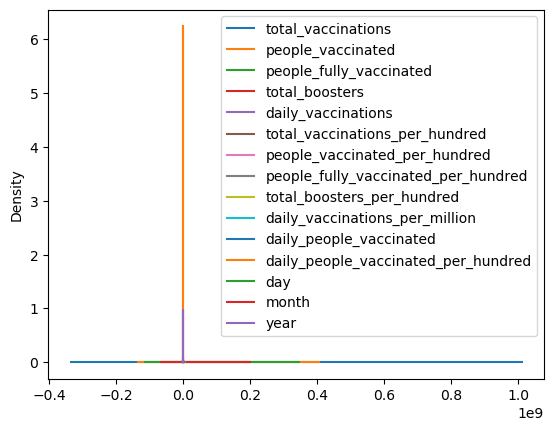

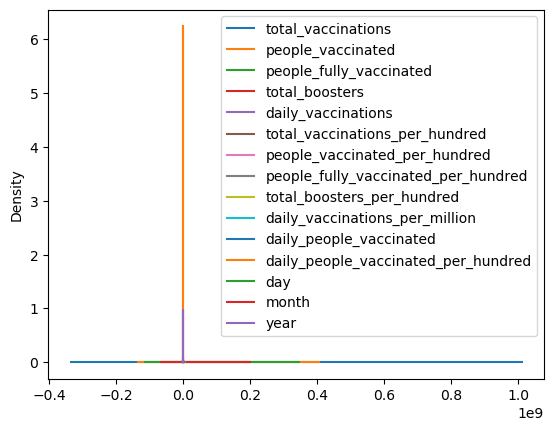

In [177]:
# Plot the density graph
data.plot.density()

# Display the plot
plt.show()

### Density Plot

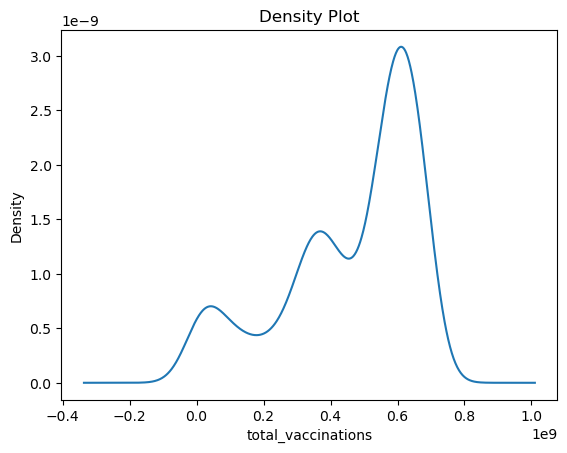

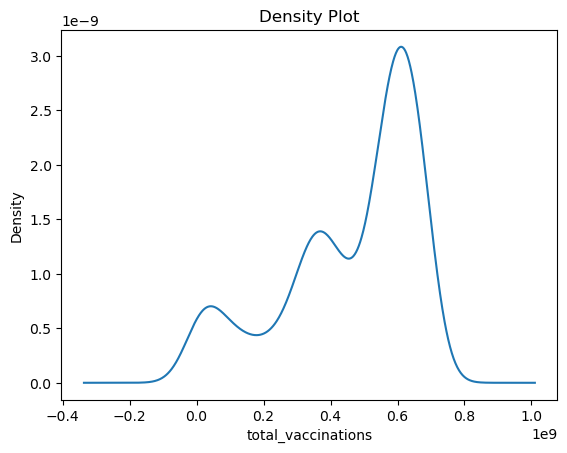

In [178]:
data['total_vaccinations'].plot.density()

# Add labels and title to the graph
plt.xlabel('total_vaccinations')
plt.ylabel('Density')
plt.title('Density Plot')

# Show the plot
plt.show()

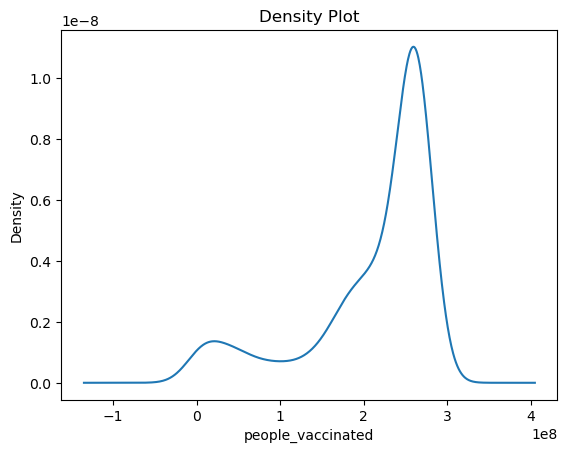

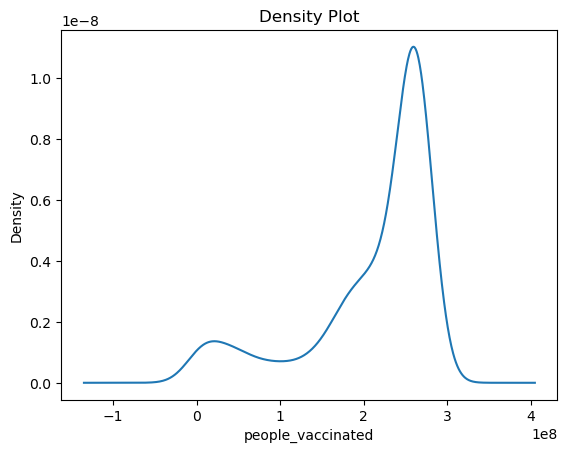

In [179]:
data['people_vaccinated'].plot.density()

# Add labels and title to the graph
plt.xlabel('people_vaccinated')
plt.ylabel('Density')
plt.title('Density Plot')

# Show the plot
plt.show()

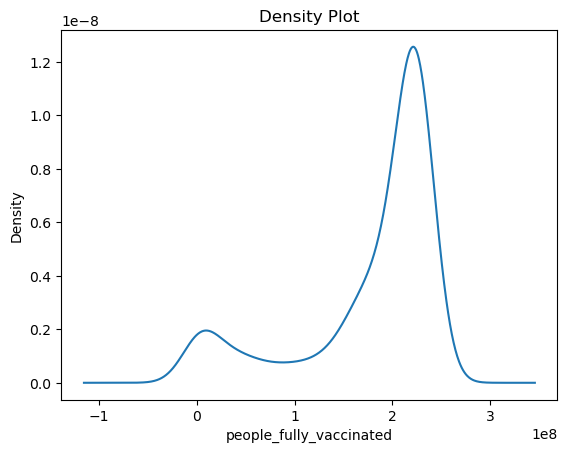

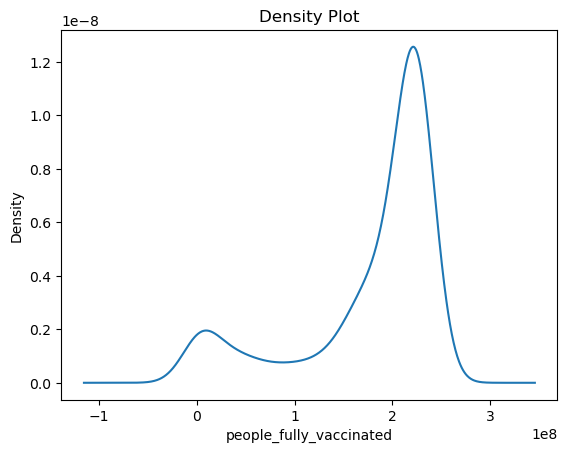

In [180]:
data['people_fully_vaccinated'].plot.density()

# Add labels and title to the graph
plt.xlabel('people_fully_vaccinated')
plt.ylabel('Density')
plt.title('Density Plot')

# Show the plot
plt.show()

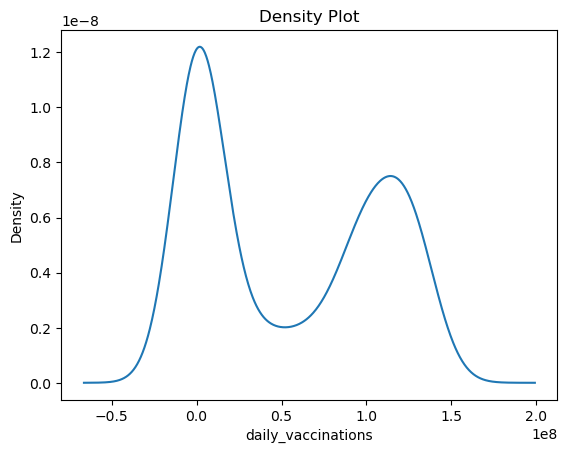

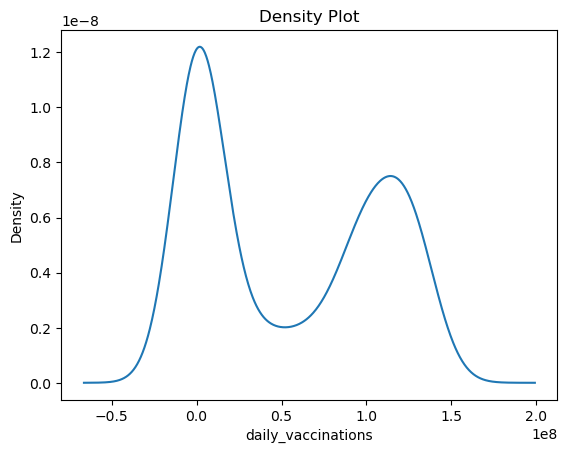

In [181]:
data['total_boosters'].plot.density()

# Add labels and title to the graph
plt.xlabel('daily_vaccinations')
plt.ylabel('Density')
plt.title('Density Plot')

# Show the plot
plt.show()

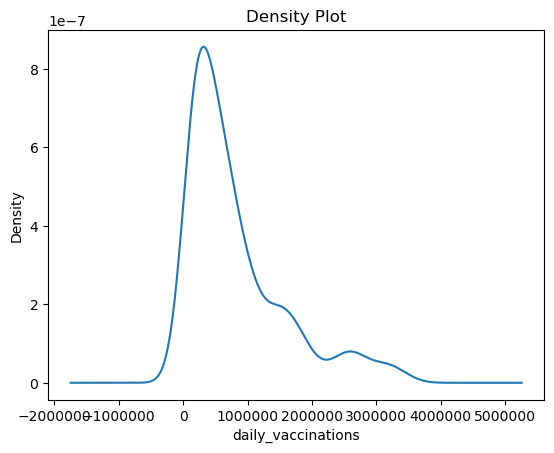

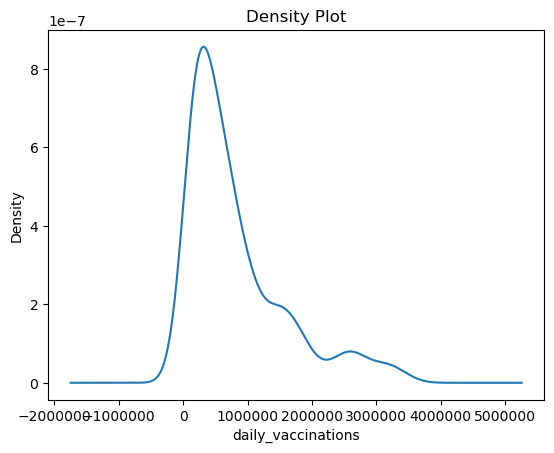

In [182]:

data['daily_vaccinations'].plot.density()

# Add labels and title to the graph
plt.xlabel('daily_vaccinations')
plt.ylabel('Density')
plt.title('Density Plot')

# Show the plot
plt.show()

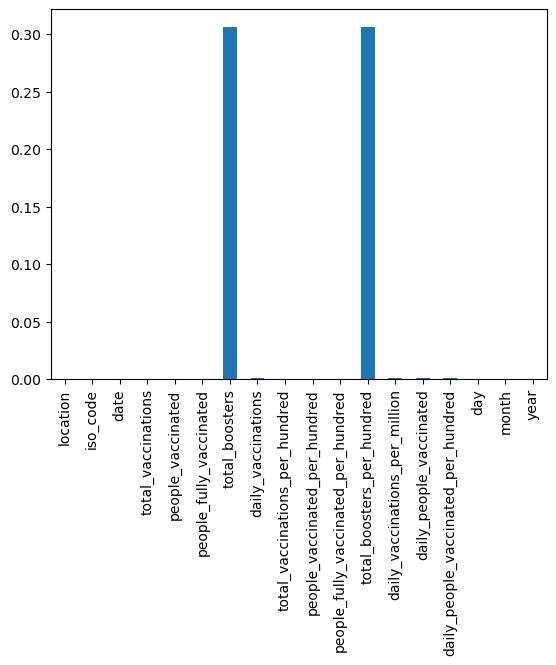

Features with Missing Data:
Index(['total_boosters', 'daily_vaccinations', 'total_boosters_per_hundred',
       'daily_vaccinations_per_million', 'daily_people_vaccinated',
       'daily_people_vaccinated_per_hundred'],
      dtype='object')
Percentage of Missing Data:
total_boosters                         0.306393
daily_vaccinations                     0.001206
total_boosters_per_hundred             0.306393
daily_vaccinations_per_million         0.001206
daily_people_vaccinated                0.001206
daily_people_vaccinated_per_hundred    0.001206
dtype: float64


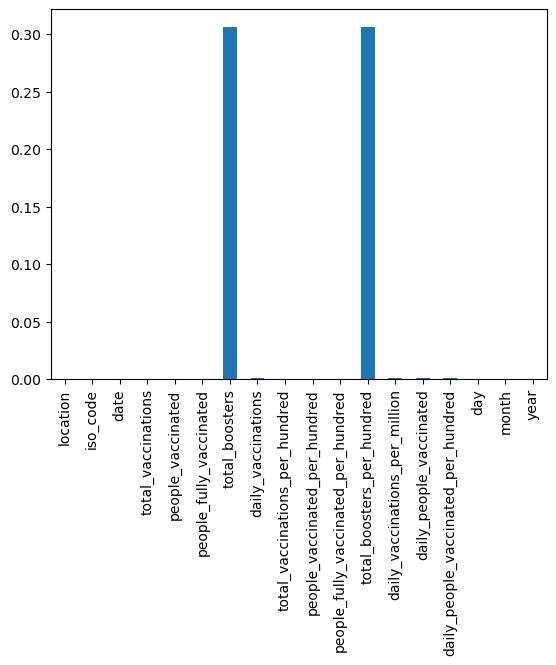

Features with Missing Data:
Index(['total_boosters', 'daily_vaccinations', 'total_boosters_per_hundred',
       'daily_vaccinations_per_million', 'daily_people_vaccinated',
       'daily_people_vaccinated_per_hundred'],
      dtype='object')
Percentage of Missing Data:
total_boosters                        0
daily_vaccinations                    0
total_boosters_per_hundred            0
daily_vaccinations_per_million        0
daily_people_vaccinated               0
daily_people_vaccinated_per_hundred   0
dtype: float64


In [183]:
# Find the percentage of missing data for each column
missing_data = data.isnull().mean()

# Plot the percentage of missing data
missing_data.plot(kind='bar')
plt.show()

# Select the columns with missing data
selected_features = missing_data[missing_data > 0].index

print("Features with Missing Data:")
print(selected_features)
print("=============================================")
print("Percentage of Missing Data:")
print(missing_data[selected_features])


'total_booster', 'daily_vaccinations', 'daily_people_vaccinated' have missing data. Around 0.12% to 29% data is missing for variables.


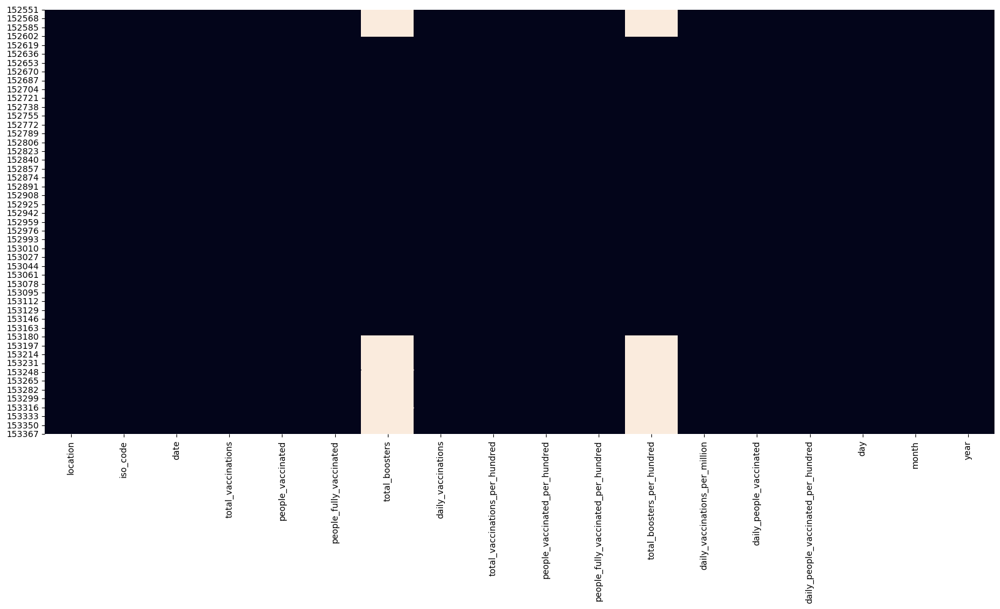

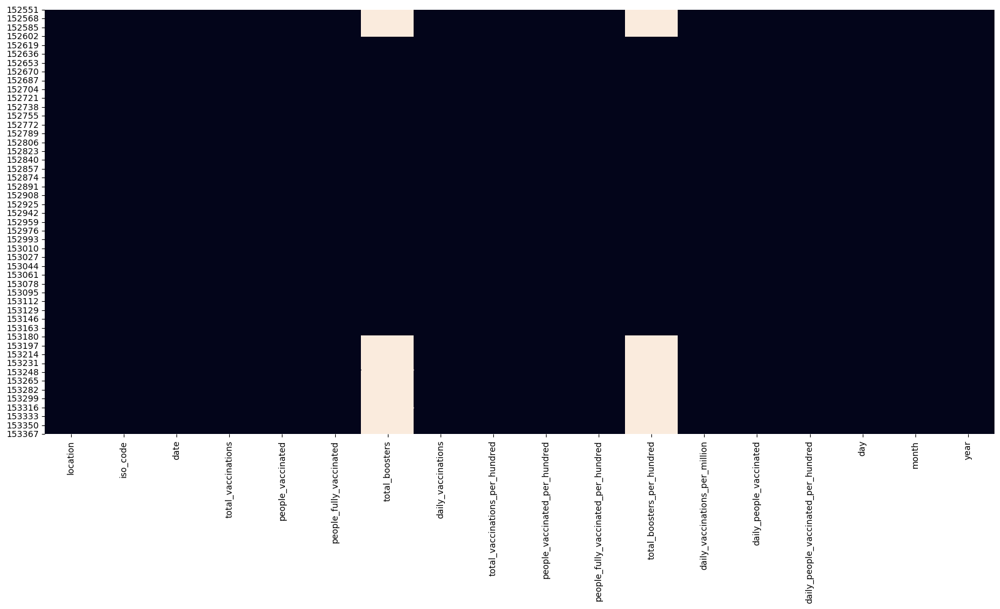

In [184]:
# using Seaborn's heatmap function to visualize the missing values
plt.figure(figsize=(20,9))
sns.heatmap(data.isnull(), cbar=False)

# Show the plot
plt.show()

## Imputing Missing Data
Imputing missing values is an essential step in data preprocessing. Incomplete data can lead to biased analysis and inaccurate predictions. There are several methods to impute missing values, and the choice of method depends on the data and the analysis requirements.

One of the most common methods for imputing missing values is interpolation. Interpolation is a method that estimates missing values by calculating the mean, median, or mode of the adjacent values. The interpolation method is effective when there is a smooth trend in the data, and missing values are close to the adjacent values. Interpolation is useful in time series data, where the data values are continuous over time.

Another method for imputing missing values is backward fill (bfill). This method is used when the missing values occur at the beginning of the data series. The bfill method fills the missing values by using the value of the next available data point in the dataset. Bfill is useful in time series data, where the data values tend to follow a pattern over time.

Finally, null values can be imputed by replacing them with a specific value, such as the mean or median of the column. This method is called the mean or median imputation method and is used when the data follows a normal distribution. This method can be effective when the missing values are random and not related to any pattern in the data.

For imputing missing value, i have used Interpolation, bfill and fillna with zero

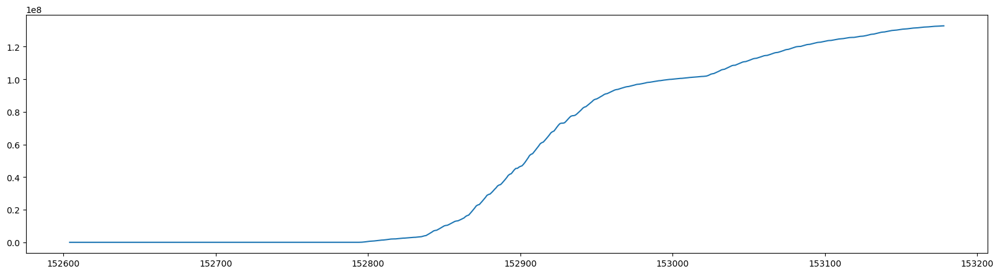

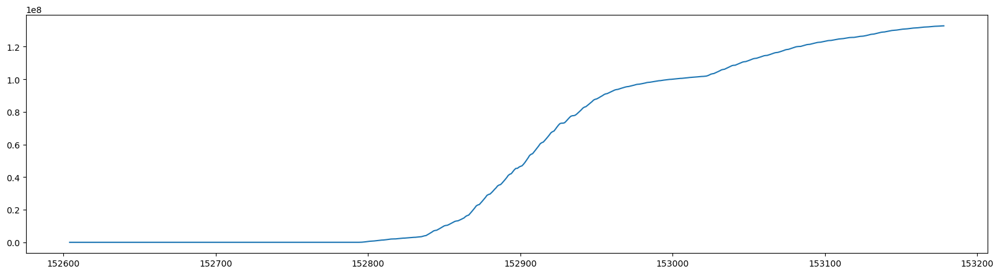

In [185]:
data['total_boosters'].plot(figsize=(20,5)) 

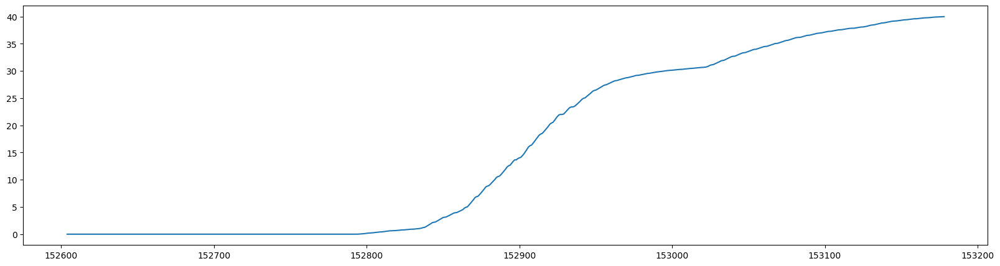

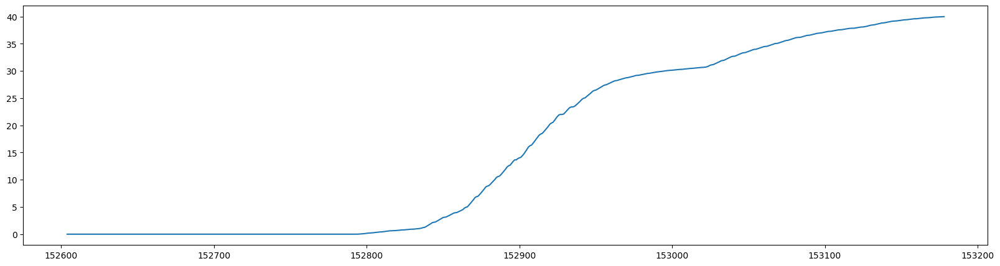

In [186]:
data['total_boosters_per_hundred'].plot(figsize=(20,5))

In [187]:
# Replace only the initial NaN values with 0, as people might have not taken booster dose

first_valid_index = data['total_boosters'].first_valid_index()
data.loc[:first_valid_index - 1, 'total_boosters'] = 0

In [188]:
first_valid_index = data['total_boosters_per_hundred'].first_valid_index()
data.loc[:first_valid_index - 1, 'total_boosters_per_hundred'] = 0
data.head(10)

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
152551,United States,USA,2020-12-13,44488.0,35964.0,9419.0,0.0,NaN,0.01,0.01,0.00,0.0,NaN,NaN,NaN,13,12,2020
152552,United States,USA,2020-12-14,49320.0,40602.0,9580.0,0.0,4832.0,0.01,0.01,0.00,0.0,15.0,4638.0,0.001,14,12,2020
152553,United States,USA,2020-12-15,97132.0,86966.0,9904.0,0.0,26322.0,0.03,0.03,0.00,0.0,79.0,25501.0,0.008,15,12,2020
152554,United States,USA,2020-12-16,257142.0,242380.0,10418.0,0.0,70885.0,0.08,0.07,0.00,0.0,214.0,68805.0,0.021,16,12,2020
152555,United States,USA,2020-12-17,532154.0,510520.0,11238.0,0.0,121916.0,0.16,0.15,0.00,0.0,367.0,118639.0,0.036,17,12,2020
152556,United States,USA,2020-12-18,952902.0,921917.0,12550.0,0.0,181683.0,0.29,0.28,0.00,0.0,547.0,177191.0,0.053,18,12,2020
152557,United States,USA,2020-12-19,1136995.0,1101630.0,13703.0,0.0,182084.0,0.34,0.33,0.00,0.0,548.0,177611.0,0.053,19,12,2020
152558,United States,USA,2020-12-20,1244060.0,1206454.0,14524.0,0.0,171367.0,0.37,0.36,0.00,0.0,516.0,167213.0,0.050,20,12,2020
152559,United States,USA,2020-12-21,1630806.0,1585641.0,16191.0,0.0,225927.0,0.49,0.48,0.00,0.0,680.0,220720.0,0.066,21,12,2020
152560,United States,USA,2020-12-22,2081868.0,2027393.0,19254.0,0.0,283534.0,0.63,0.61,0.01,0.0,854.0,277204.0,0.083,22,12,2020


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
152551,United States,USA,2020-12-13,44488,35964,9419,0,NaN,0,0,0,0,NaN,NaN,NaN,13,12,2020
152552,United States,USA,2020-12-14,49320,40602,9580,0,4832,0,0,0,0,15,4638,0,14,12,2020
152553,United States,USA,2020-12-15,97132,86966,9904,0,26322,0,0,0,0,79,25501,0,15,12,2020
152554,United States,USA,2020-12-16,257142,242380,10418,0,70885,0,0,0,0,214,68805,0,16,12,2020
152555,United States,USA,2020-12-17,532154,510520,11238,0,121916,0,0,0,0,367,118639,0,17,12,2020
152556,United States,USA,2020-12-18,952902,921917,12550,0,181683,0,0,0,0,547,177191,0,18,12,2020
152557,United States,USA,2020-12-19,1136995,1101630,13703,0,182084,0,0,0,0,548,177611,0,19,12,2020
152558,United States,USA,2020-12-20,1244060,1206454,14524,0,171367,0,0,0,0,516,167213,0,20,12,2020
152559,United States,USA,2020-12-21,1630806,1585641,16191,0,225927,0,0,0,0,680,220720,0,21,12,2020
152560,United States,USA,2020-12-22,2081868,2027393,19254,0,283534,1,1,0,0,854,277204,0,22,12,2020


In [189]:
# later we will interpolate 'total_boosters' remaining values
data['total_boosters'].interpolate(method='linear', limit_direction ='forward', inplace=True)
data.tail()

# later we will interpolate 'total_boosters_per_hundred' remaining values
data['total_boosters_per_hundred'].interpolate(method='linear', limit_direction ='forward', inplace=True)
data.tail()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
153375,United States,USA,2023-03-17,673393992.0,269819267.0,230274516.0,132777282.0,47550.0,202.82,81.27,69.36,39.99,143.0,10042.0,0.003,17,3,2023
153376,United States,USA,2023-03-18,673415307.0,269824345.0,230276885.0,132777282.0,46467.0,202.83,81.27,69.36,39.99,140.0,9816.0,0.003,18,3,2023
153377,United States,USA,2023-03-19,673425564.0,269827472.0,230277963.0,132777282.0,45751.0,202.83,81.27,69.36,39.99,138.0,9678.0,0.003,19,3,2023
153378,United States,USA,2023-03-20,673458097.0,269834492.0,230281943.0,132777282.0,41973.0,202.84,81.27,69.36,39.99,126.0,8932.0,0.003,20,3,2023
153379,United States,USA,2023-03-21,673465377.0,269835963.0,230283056.0,132777282.0,34871.0,202.85,81.27,69.36,39.99,105.0,7444.0,0.002,21,3,2023


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
153375,United States,USA,2023-03-17,673393992,269819267,230274516,132777282,47550,203,81,69,40,143,10042,0,17,3,2023
153376,United States,USA,2023-03-18,673415307,269824345,230276885,132777282,46467,203,81,69,40,140,9816,0,18,3,2023
153377,United States,USA,2023-03-19,673425564,269827472,230277963,132777282,45751,203,81,69,40,138,9678,0,19,3,2023
153378,United States,USA,2023-03-20,673458097,269834492,230281943,132777282,41973,203,81,69,40,126,8932,0,20,3,2023
153379,United States,USA,2023-03-21,673465377,269835963,230283056,132777282,34871,203,81,69,40,105,7444,0,21,3,2023


In [190]:
data.isna().sum()

location                               0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
total_boosters                         0
daily_vaccinations                     1
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
total_boosters_per_hundred             0
daily_vaccinations_per_million         1
daily_people_vaccinated                1
daily_people_vaccinated_per_hundred    1
day                                    0
month                                  0
year                                   0
dtype: int64

location                               0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
total_boosters                         0
daily_vaccinations                     1
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
total_boosters_per_hundred             0
daily_vaccinations_per_million         1
daily_people_vaccinated                1
daily_people_vaccinated_per_hundred    1
day                                    0
month                                  0
year                                   0
dtype: int64

**'daily_vaccinations', 'daily_vaccinations_per_million', 'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred'**


As for above columns we have only 1 value missing i.e in 1st row, we can use **bfill** to impute missing value

In [191]:

cols = ['daily_vaccinations', 'daily_vaccinations_per_million', 'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred']
data.loc[:,cols] = data.loc[:,cols].bfill()
data.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
152551,United States,USA,2020-12-13,44488.0,35964.0,9419.0,0.0,4832.0,0.01,0.01,0.0,0.0,15.0,4638.0,0.001,13,12,2020
152552,United States,USA,2020-12-14,49320.0,40602.0,9580.0,0.0,4832.0,0.01,0.01,0.0,0.0,15.0,4638.0,0.001,14,12,2020
152553,United States,USA,2020-12-15,97132.0,86966.0,9904.0,0.0,26322.0,0.03,0.03,0.0,0.0,79.0,25501.0,0.008,15,12,2020
152554,United States,USA,2020-12-16,257142.0,242380.0,10418.0,0.0,70885.0,0.08,0.07,0.0,0.0,214.0,68805.0,0.021,16,12,2020
152555,United States,USA,2020-12-17,532154.0,510520.0,11238.0,0.0,121916.0,0.16,0.15,0.0,0.0,367.0,118639.0,0.036,17,12,2020


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
152551,United States,USA,2020-12-13,44488,35964,9419,0,4832,0,0,0,0,15,4638,0,13,12,2020
152552,United States,USA,2020-12-14,49320,40602,9580,0,4832,0,0,0,0,15,4638,0,14,12,2020
152553,United States,USA,2020-12-15,97132,86966,9904,0,26322,0,0,0,0,79,25501,0,15,12,2020
152554,United States,USA,2020-12-16,257142,242380,10418,0,70885,0,0,0,0,214,68805,0,16,12,2020
152555,United States,USA,2020-12-17,532154,510520,11238,0,121916,0,0,0,0,367,118639,0,17,12,2020


In [192]:
data.isna().sum()

location                               0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
total_boosters                         0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
total_boosters_per_hundred             0
daily_vaccinations_per_million         0
daily_people_vaccinated                0
daily_people_vaccinated_per_hundred    0
day                                    0
month                                  0
year                                   0
dtype: int64

location                               0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
total_boosters                         0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
total_boosters_per_hundred             0
daily_vaccinations_per_million         0
daily_people_vaccinated                0
daily_people_vaccinated_per_hundred    0
day                                    0
month                                  0
year                                   0
dtype: int64

All missing values are imputed

In [193]:
print(data.shape)
data.describe()

(829, 18)


,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
count,8.290000e+02,8.290000e+02,8.290000e+02,8.290000e+02,8.290000e+02,829.000000,829.000000,829.000000,829.000000,829.000000,8.290000e+02,829.00000,829.000000,829.000000,829.000000
mean,4.595359e+08,2.107394e+08,1.786624e+08,6.953577e+07,8.124857e+05,138.410627,63.473908,53.812581,20.943402,2447.176116,3.256669e+05,0.09807,15.714113,6.202654,2021.610374
std,2.000114e+08,7.617130e+07,7.057439e+07,5.842058e+07,7.633580e+05,60.242777,22.942556,21.256749,17.595633,2299.211506,4.389923e+05,0.13226,8.749827,3.635233,0.690822
min,4.448800e+04,3.596400e+04,9.419000e+03,0.000000e+00,4.832000e+03,0.010000,0.010000,0.000000,0.000000,15.000000,4.638000e+03,0.00100,1.000000,1.000000,2020.000000
25%,3.431046e+08,1.853375e+08,1.658459e+08,3.390000e+02,2.656560e+05,103.340000,55.820000,49.950000,0.000000,800.000000,4.629100e+04,0.01400,8.000000,3.000000,2021.000000
50%,5.502248e+08,2.514974e+08,2.151372e+08,9.411453e+07,5.506950e+05,165.730000,75.750000,64.800000,28.350000,1659.000000,1.301760e+05,0.03900,16.000000,6.000000,2022.000000
75%,6.123809e+08,2.629315e+08,2.251149e+08,1.324947e+08,1.089943e+06,184.450000,79.190000,67.800000,39.910000,3283.000000,3.956990e+05,0.11900,23.000000,9.000000,2022.000000
max,6.734654e+08,2.698360e+08,2.302831e+08,1.327773e+08,3.506427e+06,202.850000,81.270000,69.360000,39.990000,10561.000000,2.017264e+06,0.60800,31.000000,12.000000,2023.000000


(829, 18)


,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
count,829,829,829,829,829,829,829,829,829,829,829,829,829,829,829
mean,459535864,210739394,178662364,69535770,812486,138,63,54,21,2447,325667,0,16,6,2022
std,200011407,76171298,70574389,58420577,763358,60,23,21,18,2299,438992,0,9,4,1
min,44488,35964,9419,0,4832,0,0,0,0,15,4638,0,1,1,2020
25%,343104581,185337509,165845881,339,265656,103,56,50,0,800,46291,0,8,3,2021
50%,550224783,251497361,215137181,94114531,550695,166,76,65,28,1659,130176,0,16,6,2022
75%,612380929,262931468,225114894,132494669,1089943,184,79,68,40,3283,395699,0,23,9,2022
max,673465377,269835963,230283056,132777282,3506427,203,81,69,40,10561,2017264,1,31,12,2023


This table shows summary statistics for a dataset with 808 observations and 15 variables.

The variables are: count - shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

std - shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

min and max - show the smallest and largest values observed for each variable.

25%, 50%, and 75% - show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

# Data Visualization

### BoxPlot

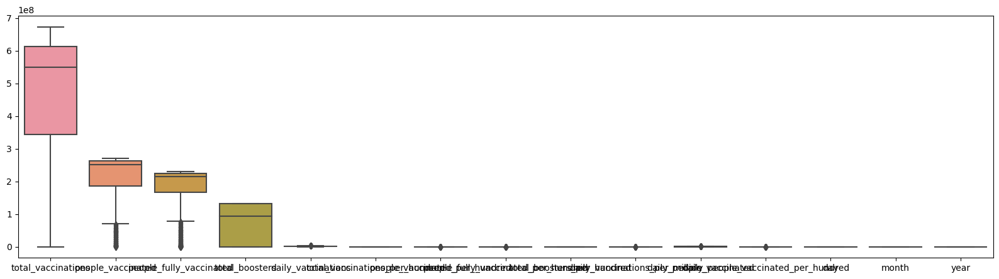

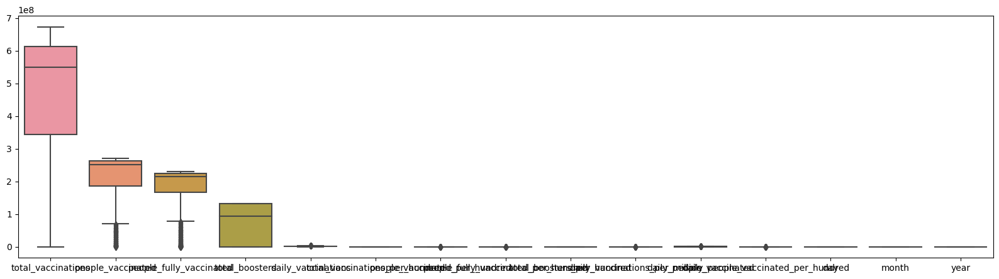

In [194]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,5))
sns.boxplot(data=data)

### Correlation Matrix

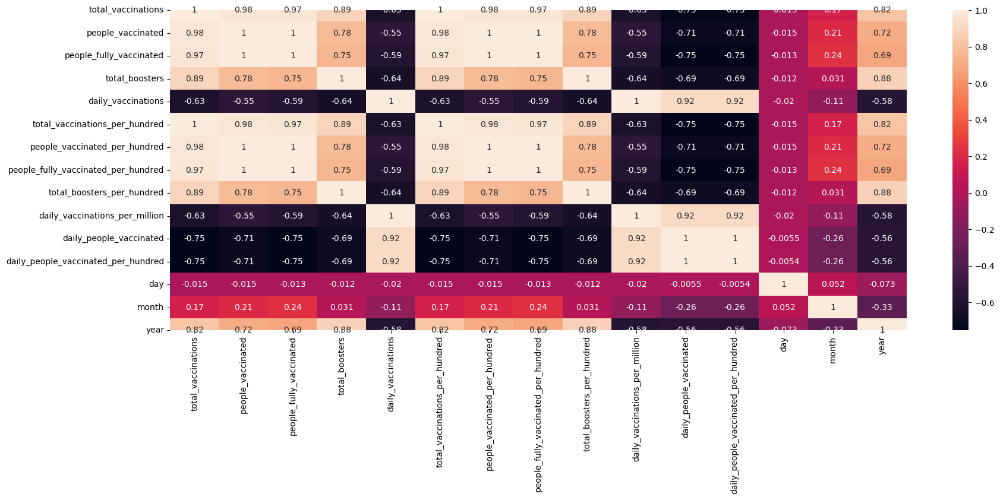

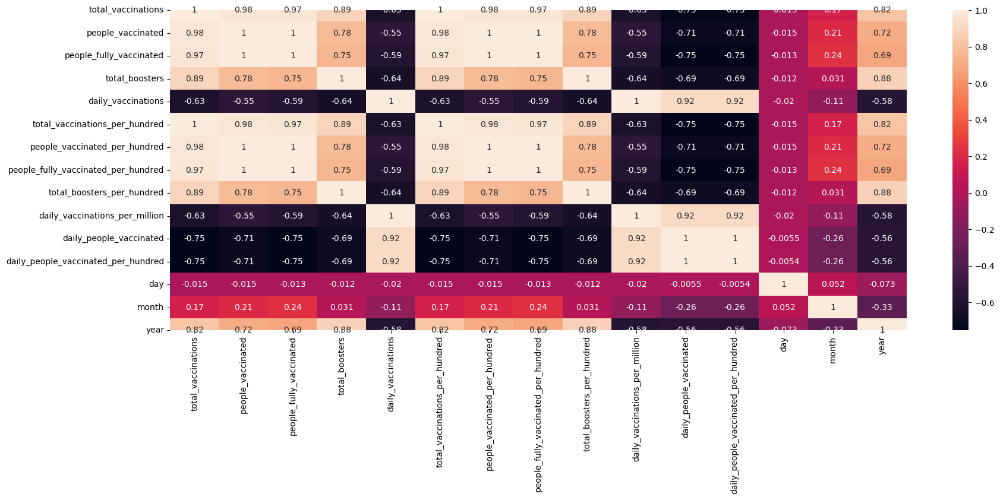

In [195]:
# Heatmap showing correlation between the attributes
plt.figure(figsize=(20,7))
sns.heatmap(data.corr(), annot=True) 

In [196]:
#checking the correlation between all the features in the data
data.corr()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
total_vaccinations,1.000000,0.975135,0.965941,0.890659,-0.626369,1.000000,0.975136,0.965941,0.890656,-0.626368,-0.752585,-0.752616,-0.015051,0.167339,0.821562
people_vaccinated,0.975135,1.000000,0.995797,0.779100,-0.545715,0.975135,1.000000,0.995797,0.779100,-0.545715,-0.708889,-0.708896,-0.014945,0.208823,0.718488
people_fully_vaccinated,0.965941,0.995797,1.000000,0.754843,-0.588024,0.965941,0.995797,1.000000,0.754843,-0.588024,-0.752519,-0.752524,-0.013414,0.242943,0.687031
total_boosters,0.890659,0.779100,0.754843,1.000000,-0.644654,0.890659,0.779101,0.754842,1.000000,-0.644653,-0.688582,-0.688626,-0.011752,0.031199,0.880129
daily_vaccinations,-0.626369,-0.545715,-0.588024,-0.644654,1.000000,-0.626368,-0.545719,-0.588022,-0.644654,1.000000,0.921098,0.921114,-0.019783,-0.105542,-0.577222
total_vaccinations_per_hundred,1.000000,0.975135,0.965941,0.890659,-0.626368,1.000000,0.975135,0.965941,0.890657,-0.626367,-0.752584,-0.752615,-0.015052,0.167340,0.821561
people_vaccinated_per_hundred,0.975136,1.000000,0.995797,0.779101,-0.545719,0.975135,1.000000,0.995798,0.779101,-0.545719,-0.708892,-0.708898,-0.014940,0.208818,0.718490
people_fully_vaccinated_per_hundred,0.965941,0.995797,1.000000,0.754842,-0.588022,0.965941,0.995798,1.000000,0.754842,-0.588022,-0.752517,-0.752522,-0.013415,0.242939,0.687033
total_boosters_per_hundred,0.890656,0.779100,0.754843,1.000000,-0.644654,0.890657,0.779101,0.754842,1.000000,-0.644653,-0.688582,-0.688626,-0.011754,0.031195,0.880122
daily_vaccinations_per_million,-0.626368,-0.545715,-0.588024,-0.644653,1.000000,-0.626367,-0.545719,-0.588022,-0.644653,1.000000,0.921098,0.921114,-0.019779,-0.105546,-0.577219


,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
total_vaccinations,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
people_vaccinated,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
people_fully_vaccinated,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
total_boosters,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
daily_vaccinations,-1,-1,-1,-1,1,-1,-1,-1,-1,1,1,1,-0,-0,-1
total_vaccinations_per_hundred,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
people_vaccinated_per_hundred,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
people_fully_vaccinated_per_hundred,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
total_boosters_per_hundred,1,1,1,1,-1,1,1,1,1,-1,-1,-1,-0,0,1
daily_vaccinations_per_million,-1,-1,-1,-1,1,-1,-1,-1,-1,1,1,1,-0,-0,-1


### QQ Plot
quantile-quantile (q-q) plot is a graphical technique for determining if two data sets come from populations with a common distribution. 

<Figure size 800x500 with 0 Axes>

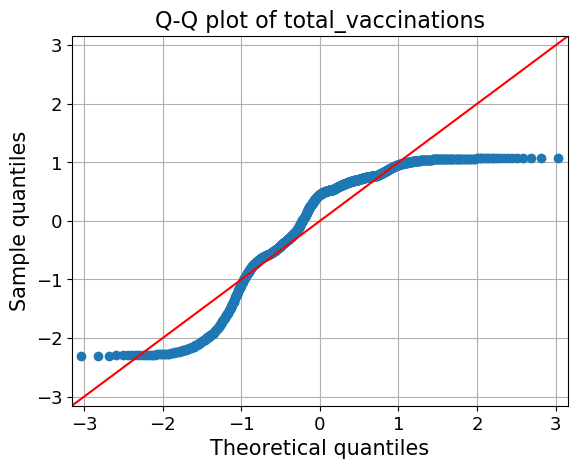

<Figure size 800x500 with 0 Axes>

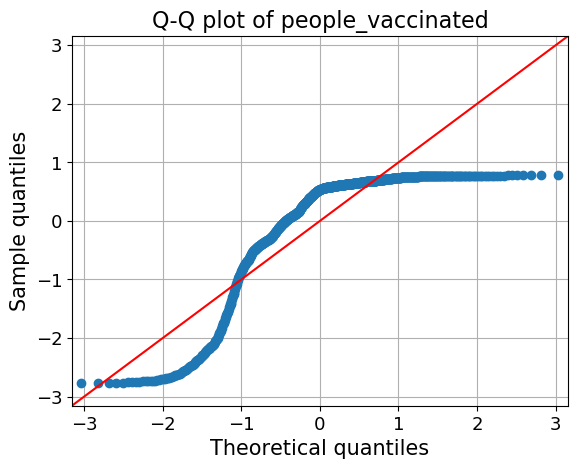

<Figure size 800x500 with 0 Axes>

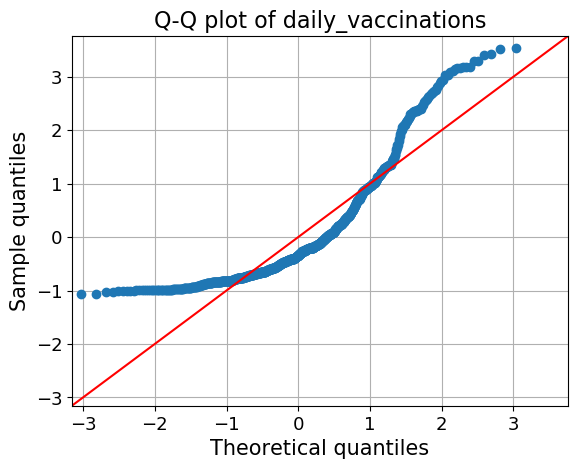

<Figure size 800x500 with 0 Axes>

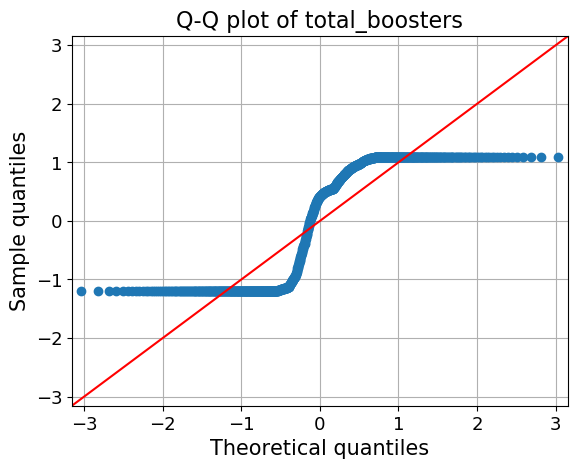

<Figure size 800x500 with 0 Axes>

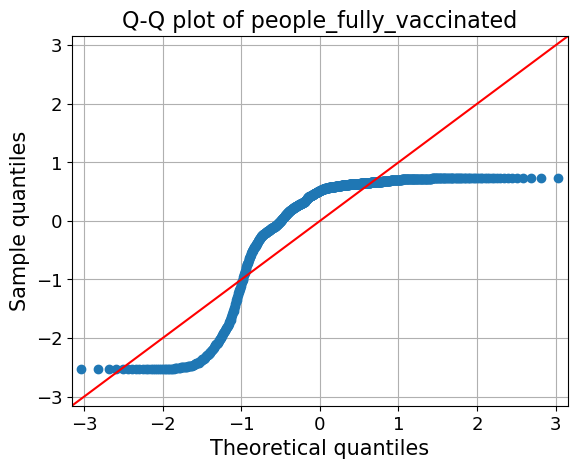

<Figure size 800x500 with 0 Axes>

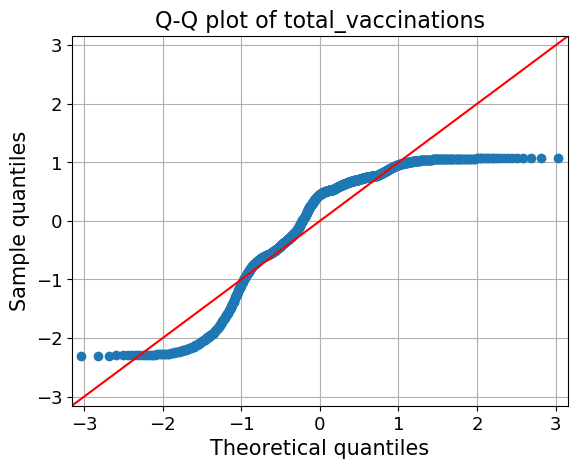

<Figure size 800x500 with 0 Axes>

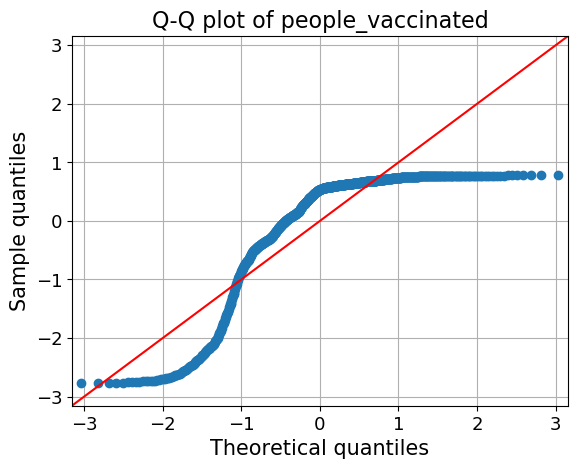

<Figure size 800x500 with 0 Axes>

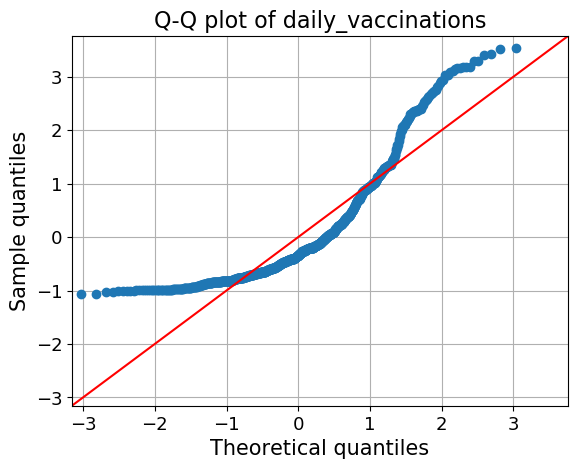

<Figure size 800x500 with 0 Axes>

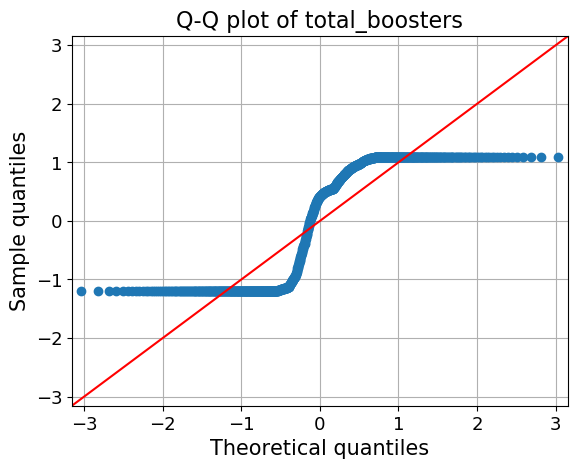

<Figure size 800x500 with 0 Axes>

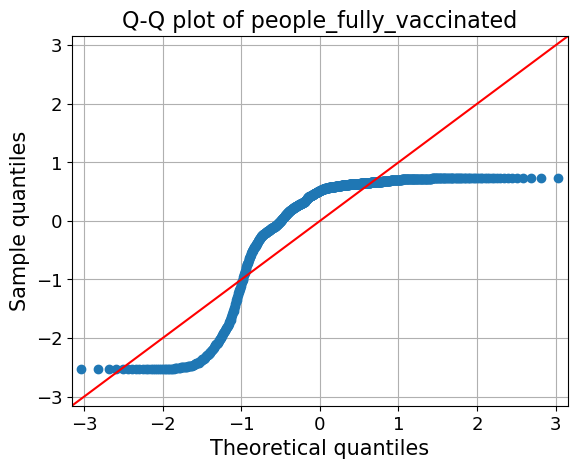

In [197]:
#checking the distribution of independent variables using qqplot
from statsmodels.graphics.gofplots import qqplot
data_norm=data[['total_vaccinations', 'people_vaccinated', 'daily_vaccinations', 'total_boosters', 'people_fully_vaccinated']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

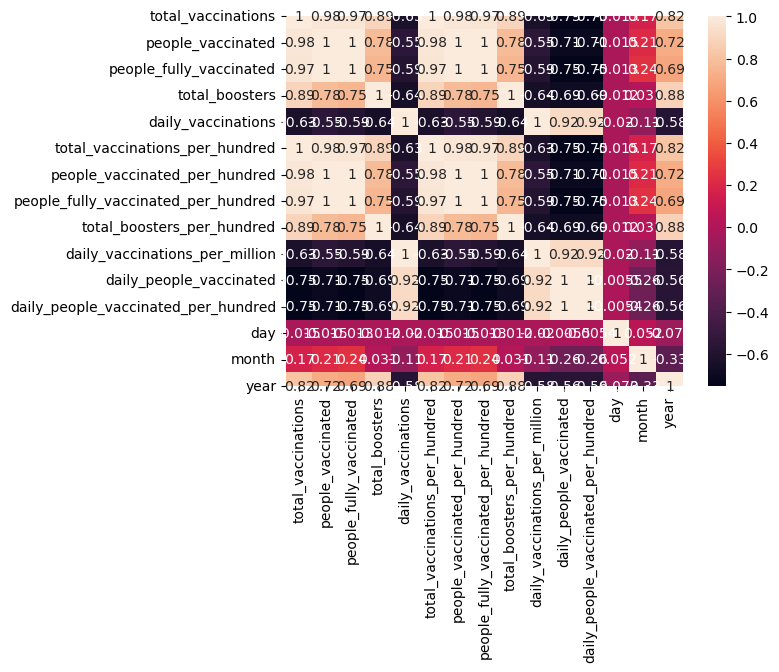

<Figure size 2000x700 with 0 Axes>

total_vaccinations                     1.000000
people_vaccinated                      0.975135
people_fully_vaccinated                0.965941
total_boosters                         0.890659
daily_vaccinations                    -0.626369
total_vaccinations_per_hundred         1.000000
people_vaccinated_per_hundred          0.975136
people_fully_vaccinated_per_hundred    0.965941
total_boosters_per_hundred             0.890656
daily_vaccinations_per_million        -0.626368
daily_people_vaccinated               -0.752585
daily_people_vaccinated_per_hundred   -0.752616
day                                   -0.015051
month                                  0.167339
year                                   0.821562
Name: total_vaccinations, dtype: float64
Positively Correlated Variables:
total_vaccinations_per_hundred         1.000000
people_vaccinated_per_hundred          0.975136
people_vaccinated                      0.975135
people_fully_vaccinated                0.965941
people_fully_v

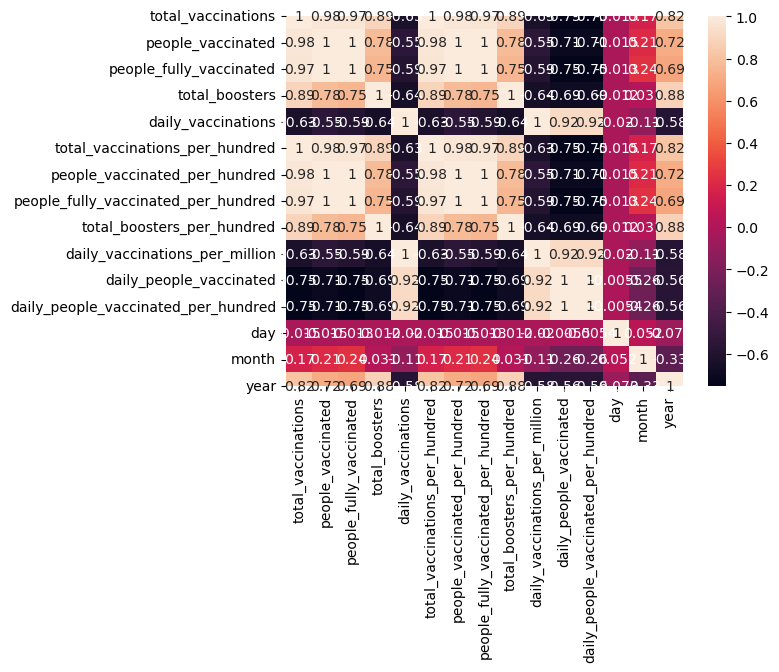

<Figure size 2000x700 with 0 Axes>

total_vaccinations                     1
people_vaccinated                      1
people_fully_vaccinated                1
total_boosters                         1
daily_vaccinations                    -1
total_vaccinations_per_hundred         1
people_vaccinated_per_hundred          1
people_fully_vaccinated_per_hundred    1
total_boosters_per_hundred             1
daily_vaccinations_per_million        -1
daily_people_vaccinated               -1
daily_people_vaccinated_per_hundred   -1
day                                   -0
month                                  0
year                                   1
Name: total_vaccinations, dtype: float64
Positively Correlated Variables:
total_vaccinations_per_hundred         1
people_vaccinated_per_hundred          1
people_vaccinated                      1
people_fully_vaccinated                1
people_fully_vaccinated_per_hundred    1
total_boosters                         1
total_boosters_per_hundred             1
year                    

In [198]:
# Calculate the correlation matrix
corr_matrix = data.corr()

# Plot the heatmap of the correlation matrix
sns.heatmap(corr_matrix, annot=True)
plt.figure(figsize=(20,7))

plt.show()

# Find the most positively and negatively correlated variables with the target
target = 'total_vaccinations'
print(corr_matrix[target])
print("=========================================")
positive_correlation = corr_matrix[target].sort_values(ascending=False).drop(target).head(10)
negative_correlation = corr_matrix[target].sort_values().drop(target).head(10)

print("Positively Correlated Variables:")
print(positive_correlation)
print("=========================================")

print("Negatively Correlated Variables:")
print(negative_correlation)

If two attributes have a **correlation coefficient of 1**, it means that they have a perfect positive correlation, and they move together in the same direction. This means that when **one attribute increases, the other attribute also increases by the same proportion**. 

On the other hand, if two attributes have a **correlation coefficient of -1**, it means that they have a perfect negative correlation, and they move together in opposite directions. This means that when **one attribute increases, the other attribute decreases by the same proportion**.

**In above figure, 'people_vaccinated' and 'total_vaccinations' are positively correlated
'people_fully_vaccinated' and 'people_vaccinated' are correlated**

In [199]:
data.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
count,8.290000e+02,8.290000e+02,8.290000e+02,8.290000e+02,8.290000e+02,829.000000,829.000000,829.000000,829.000000,829.000000,8.290000e+02,829.00000,829.000000,829.000000,829.000000
mean,4.595359e+08,2.107394e+08,1.786624e+08,6.953577e+07,8.124857e+05,138.410627,63.473908,53.812581,20.943402,2447.176116,3.256669e+05,0.09807,15.714113,6.202654,2021.610374
std,2.000114e+08,7.617130e+07,7.057439e+07,5.842058e+07,7.633580e+05,60.242777,22.942556,21.256749,17.595633,2299.211506,4.389923e+05,0.13226,8.749827,3.635233,0.690822
min,4.448800e+04,3.596400e+04,9.419000e+03,0.000000e+00,4.832000e+03,0.010000,0.010000,0.000000,0.000000,15.000000,4.638000e+03,0.00100,1.000000,1.000000,2020.000000
25%,3.431046e+08,1.853375e+08,1.658459e+08,3.390000e+02,2.656560e+05,103.340000,55.820000,49.950000,0.000000,800.000000,4.629100e+04,0.01400,8.000000,3.000000,2021.000000
50%,5.502248e+08,2.514974e+08,2.151372e+08,9.411453e+07,5.506950e+05,165.730000,75.750000,64.800000,28.350000,1659.000000,1.301760e+05,0.03900,16.000000,6.000000,2022.000000
75%,6.123809e+08,2.629315e+08,2.251149e+08,1.324947e+08,1.089943e+06,184.450000,79.190000,67.800000,39.910000,3283.000000,3.956990e+05,0.11900,23.000000,9.000000,2022.000000
max,6.734654e+08,2.698360e+08,2.302831e+08,1.327773e+08,3.506427e+06,202.850000,81.270000,69.360000,39.990000,10561.000000,2.017264e+06,0.60800,31.000000,12.000000,2023.000000


,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year
count,829,829,829,829,829,829,829,829,829,829,829,829,829,829,829
mean,459535864,210739394,178662364,69535770,812486,138,63,54,21,2447,325667,0,16,6,2022
std,200011407,76171298,70574389,58420577,763358,60,23,21,18,2299,438992,0,9,4,1
min,44488,35964,9419,0,4832,0,0,0,0,15,4638,0,1,1,2020
25%,343104581,185337509,165845881,339,265656,103,56,50,0,800,46291,0,8,3,2021
50%,550224783,251497361,215137181,94114531,550695,166,76,65,28,1659,130176,0,16,6,2022
75%,612380929,262931468,225114894,132494669,1089943,184,79,68,40,3283,395699,0,23,9,2022
max,673465377,269835963,230283056,132777282,3506427,203,81,69,40,10561,2017264,1,31,12,2023


### Pairplot
A pair plot, also known as a scatter plot matrix, is a type of data visualization that displays pairwise relationships between different variables in a dataset. In a pair plot, each variable in the dataset is plotted against every other variable, resulting in a grid of scatter plots.

In a pair plot, each scatter plot in the grid represents a pair of variables. The diagonal of the grid typically shows a histogram or density plot of each variable, providing a quick overview of its distribution. The off-diagonal plots show the relationship between each pair of variables, with points representing individual data points and the color or shape of the points indicating additional information, such as the value of a categorical variable.


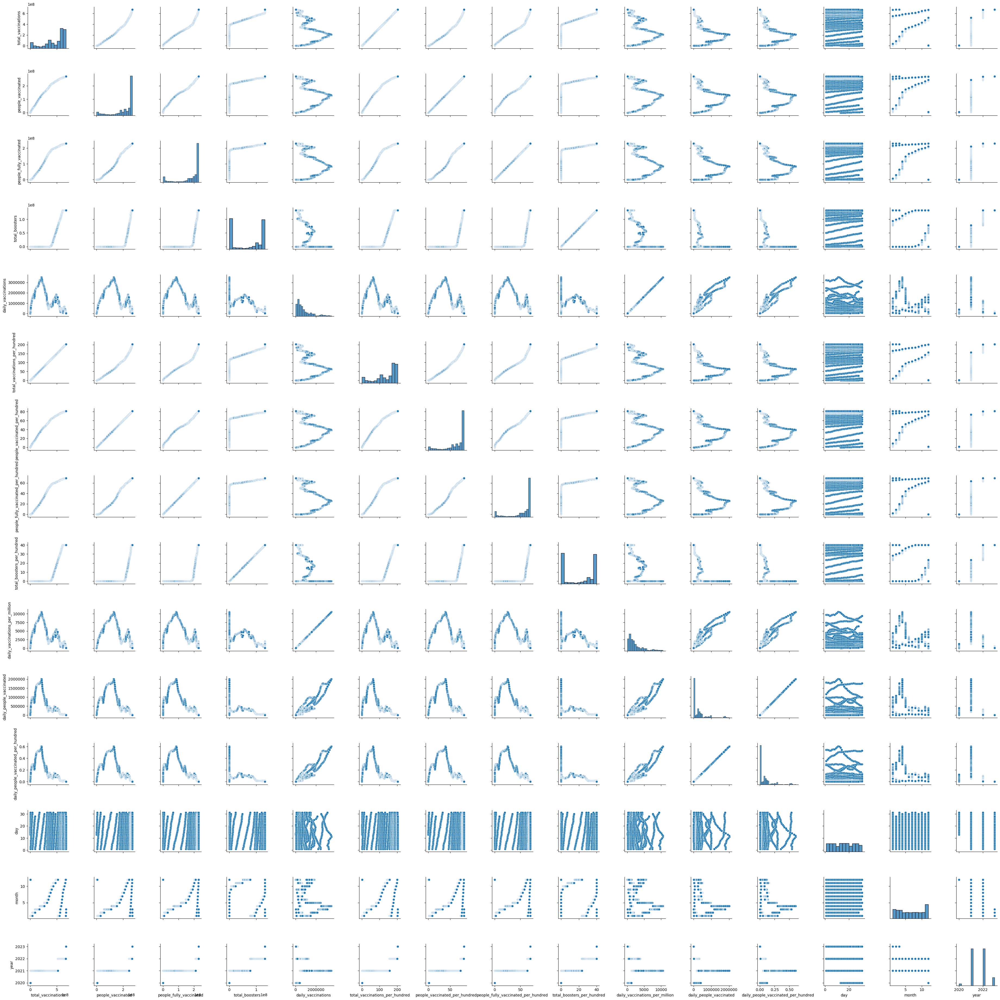

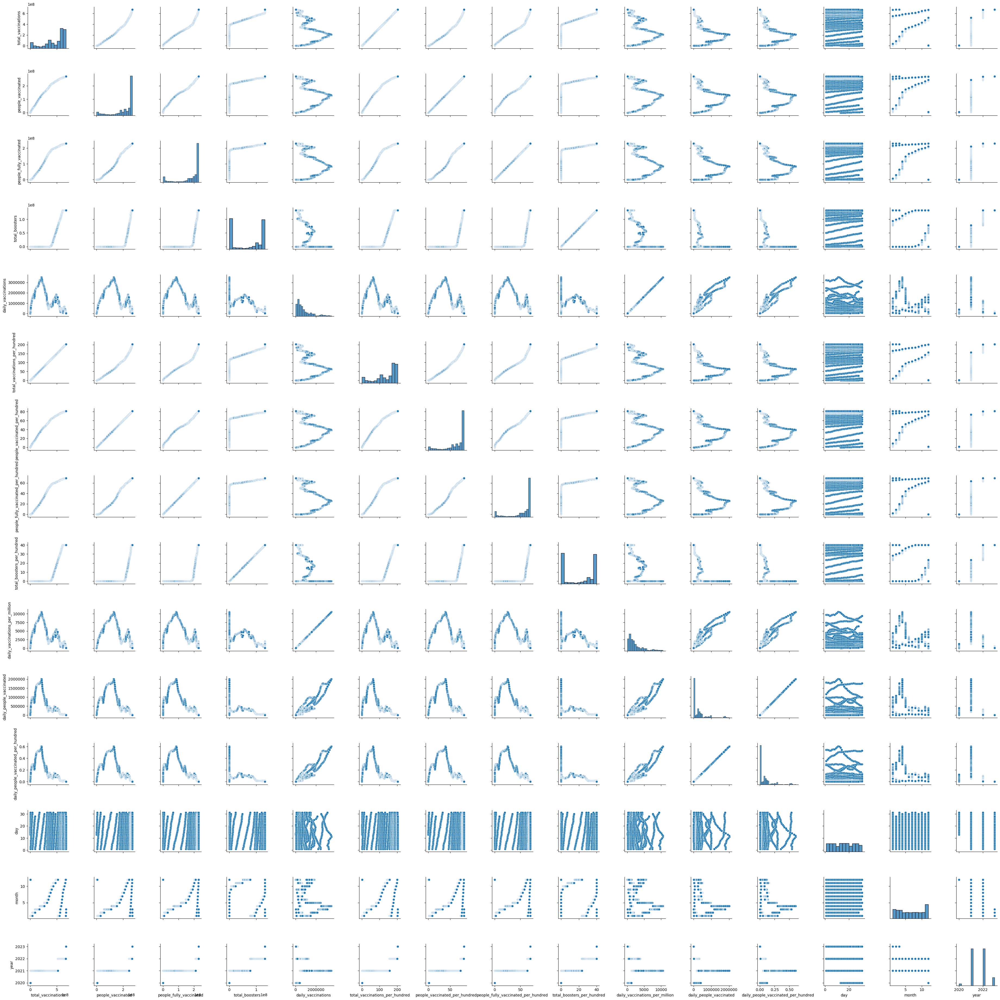

In [200]:
#pair plot to check the colinearity
sns.pairplot(data) 

## Density Plot

In [201]:
data.dtypes

location                                object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
total_boosters                         float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
total_boosters_per_hundred             float64
daily_vaccinations_per_million         float64
daily_people_vaccinated                float64
daily_people_vaccinated_per_hundred    float64
day                                      int64
month                                    int64
year                                     int64
dtype: object

location                                object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
total_boosters                         float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
total_boosters_per_hundred             float64
daily_vaccinations_per_million         float64
daily_people_vaccinated                float64
daily_people_vaccinated_per_hundred    float64
day                                      int64
month                                    int64
year                                     int64
dtype: object

In [202]:
d_columns = ['total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'daily_vaccinations', 'total_vaccinations_per_hundred',
       'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred',
       'total_boosters_per_hundred', 'daily_vaccinations_per_million',
       'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred']
d_columns

['total_vaccinations',
 'people_vaccinated',
 'people_fully_vaccinated',
 'total_boosters',
 'daily_vaccinations',
 'total_vaccinations_per_hundred',
 'people_vaccinated_per_hundred',
 'people_fully_vaccinated_per_hundred',
 'total_boosters_per_hundred',
 'daily_vaccinations_per_million',
 'daily_people_vaccinated',
 'daily_people_vaccinated_per_hundred']

['total_vaccinations',
 'people_vaccinated',
 'people_fully_vaccinated',
 'total_boosters',
 'daily_vaccinations',
 'total_vaccinations_per_hundred',
 'people_vaccinated_per_hundred',
 'people_fully_vaccinated_per_hundred',
 'total_boosters_per_hundred',
 'daily_vaccinations_per_million',
 'daily_people_vaccinated',
 'daily_people_vaccinated_per_hundred']

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.48it/s]


          sumsquare_error          aic           bic    kl_div  ks_statistic  \
powerlaw     1.910893e-16  4139.966062 -35555.554597  0.216232      0.105057   
cauchy       2.721870e-16  4262.371920 -35269.017050  0.361462      0.232848   
uniform      3.136933e-16  4069.576217 -35151.360295  0.395349      0.319983   
norm         3.164724e-16  4142.745230 -35144.048064  0.377342      0.176712   
rayleigh     3.550464e-16  4119.618688 -35048.702906  0.469046      0.205304   

             ks_pvalue  
powerlaw  2.021916e-08  
cauchy    5.228741e-40  
uniform   5.294239e-76  
norm      4.087563e-23  
rayleigh  4.055228e-31  


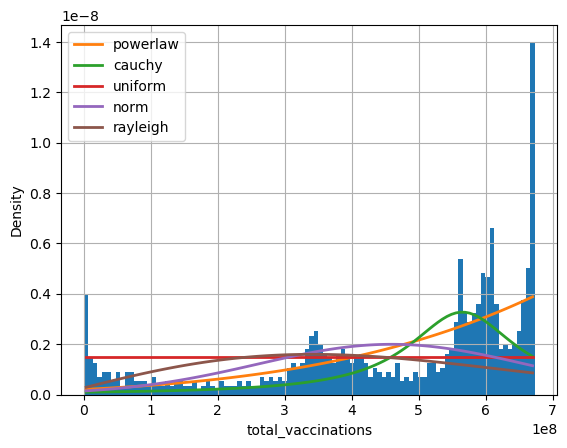

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.62it/s]


          sumsquare_error          aic           bic    kl_div  ks_statistic  \
powerlaw     2.627218e-15  4041.477563 -33382.795210  0.290816      0.238182   
cauchy       2.761446e-15  4257.705373 -33348.207217  0.383700      0.292009   
norm         5.064806e-15  4021.186920 -32845.367887  0.611608      0.218784   
lognorm      5.093792e-15  4027.491076 -32833.916806  0.623135      0.215983   
uniform      5.400945e-15  3886.638300 -32792.097947  0.719767      0.452664   

              ks_pvalue  
powerlaw   7.270842e-42  
cauchy     4.099779e-63  
norm       2.530280e-35  
lognorm    1.994796e-34  
uniform   1.211926e-155  


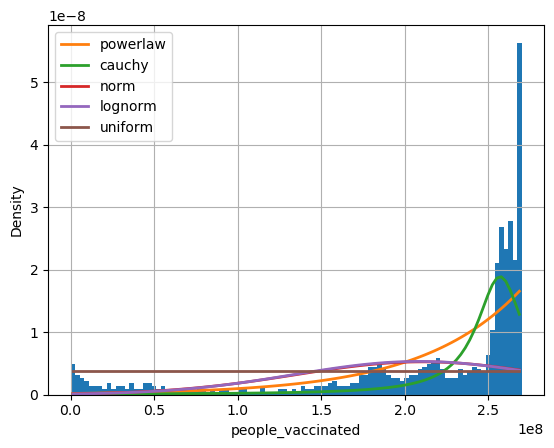

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.01it/s]


          sumsquare_error          aic           bic    kl_div  ks_statistic  \
cauchy       4.563741e-15  4247.514846 -32931.727427  0.365197      0.297828   
powerlaw     4.845815e-15  4003.974462 -32875.289853  0.346367      0.259788   
norm         8.538433e-15  3972.014813 -32412.412919  0.753178      0.232121   
uniform      8.839509e-15  3854.955777 -32383.684924  0.827396      0.479142   
rayleigh     9.261786e-15  3923.076631 -32344.999194  0.925468      0.290001   

              ks_pvalue  
cauchy     1.089673e-65  
powerlaw   7.666112e-50  
norm       9.287494e-40  
uniform   1.671870e-175  
rayleigh   3.082125e-62  


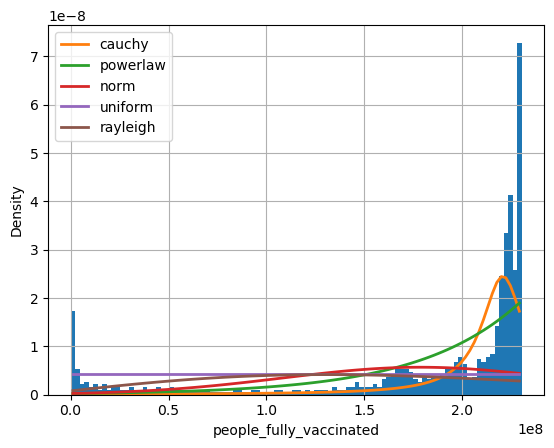

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.28it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
exponpow     7.921557e-14  3833.975329 -30559.016143     inf      0.292279   
powerlaw     8.474056e-14  4334.818619 -30503.123780     inf      0.636005   
lognorm      9.118643e-14  4726.512118 -30442.348317     inf      0.667380   
expon        9.140815e-14  3806.418543 -30447.055296     inf      0.295551   
uniform      9.150980e-14  3744.836742 -30446.133951     inf      0.317636   

             ks_pvalue  
exponpow  3.121880e-63  
powerlaw  0.000000e+00  
lognorm   0.000000e+00  
expon     1.126895e-64  
uniform   7.157239e-75  


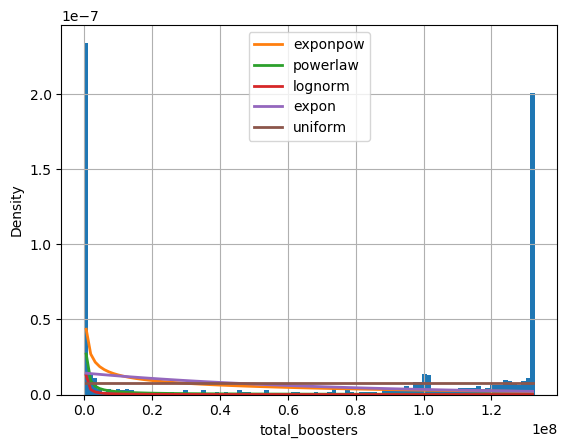

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  4.82it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
gamma        2.468324e-12  3167.271803 -27707.984332     inf      0.048817   
expon        3.198160e-12  3157.929270 -27499.963292     inf      0.066550   
exponpow     4.671918e-12  3148.391896 -27179.057135     inf      0.083837   
cauchy       4.751863e-12  3276.287210 -27171.711608     inf      0.193130   
rayleigh     6.371160e-12  3207.483019 -26928.611658     inf      0.174782   

             ks_pvalue  
gamma     3.719033e-02  
expon     1.231305e-03  
exponpow  1.618594e-05  
cauchy    1.469284e-27  
rayleigh  1.279576e-22  


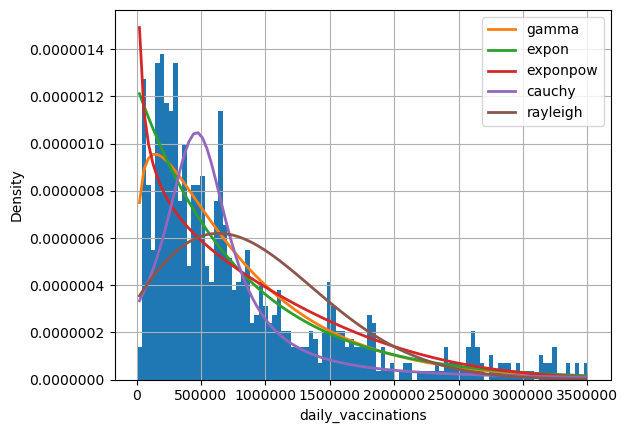

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]


          sumsquare_error          aic           bic    kl_div  ks_statistic  \
powerlaw         0.002106  1136.856856 -10659.856118  0.216241      0.105028   
cauchy           0.003000  1259.271716 -10373.322465  0.361497      0.232826   
uniform          0.003458  1066.483498 -10255.721657  0.395349      0.319952   
norm             0.003488  1139.650898 -10248.393567  0.377355      0.176707   
lognorm          0.003497  1142.304919 -10239.637942  0.379519      0.177743   

             ks_pvalue  
powerlaw  2.042517e-08  
cauchy    5.320927e-40  
uniform   5.477760e-76  
norm      4.098987e-23  
lognorm   2.208984e-23  


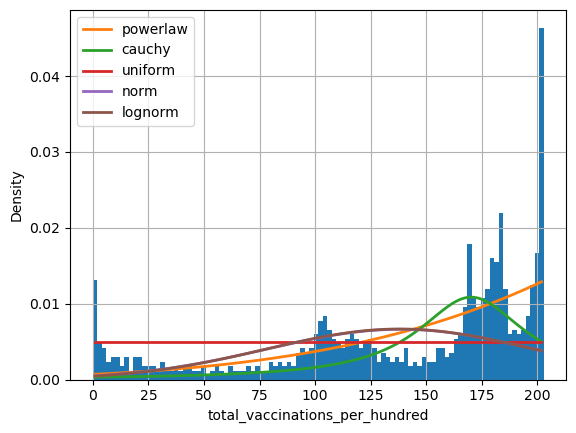

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.34it/s]


          sumsquare_error          aic          bic    kl_div  ks_statistic  \
powerlaw         0.029255  1038.412874 -8478.687980  0.291018      0.238222   
cauchy           0.030757  1254.638739 -8443.894914  0.384100      0.292152   
norm             0.056143  1018.097768 -7945.023709  0.611288      0.218831   
lognorm          0.056182  1021.668481 -7937.727672  0.613222      0.217761   
gamma            0.056928  1010.886870 -7926.783321  0.629493      0.231244   

             ks_pvalue  
powerlaw  7.037523e-42  
cauchy    3.551174e-63  
norm      2.444525e-35  
lognorm   5.396406e-35  
gamma     1.854870e-39  


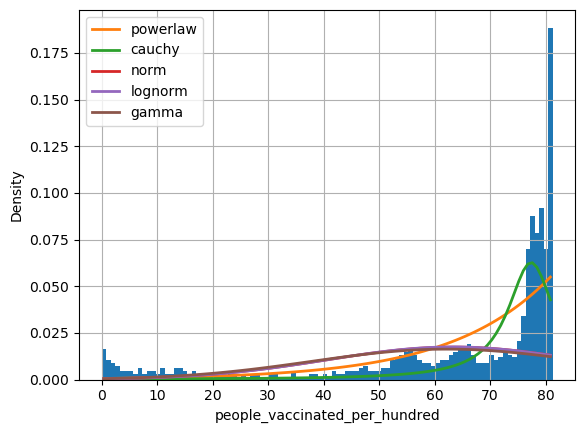

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.30it/s]


          sumsquare_error          aic          bic    kl_div  ks_statistic  \
cauchy           0.050294  1244.444580 -8036.222328  0.365151      0.297851   
lognorm          0.093839   975.061565 -7512.459193  0.747962      0.241882   
norm             0.094112   968.935208 -7516.775837  0.753161      0.232129   
uniform          0.097431   851.862066 -7488.038062  0.827396      0.479165   
rayleigh         0.102085   919.987662 -7449.355709  0.925468      0.290003   

              ks_pvalue  
cauchy     1.064202e-65  
lognorm    3.527071e-43  
norm       9.230180e-40  
uniform   1.604119e-175  
rayleigh   3.076338e-62  


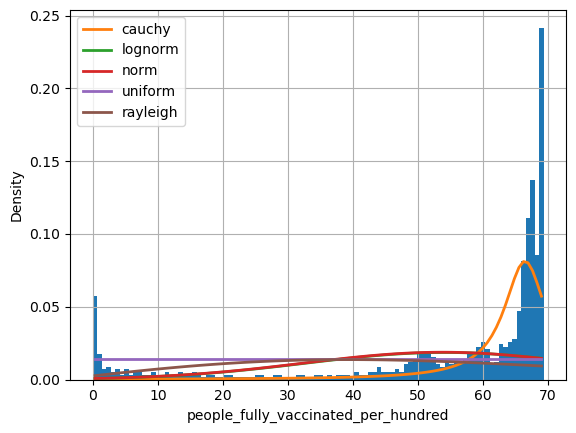

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.17it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
chi2             0.734385  1230.456801 -5806.832659     inf      0.550187   
lognorm          0.752922  1145.974321 -5786.167309     inf      0.379699   
exponpow         0.880345   828.285905 -5656.551066     inf      0.294331   
expon            1.007621   803.307922 -5551.327920     inf      0.295565   
uniform          1.008744   741.725885 -5550.404760     inf      0.317531   

              ks_pvalue  
chi2      3.411489e-236  
lognorm   6.218970e-108  
exponpow   3.908140e-64  
expon      1.110861e-64  
uniform    8.038139e-75  


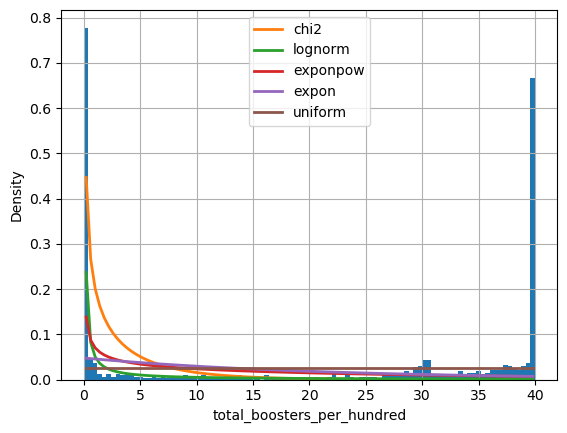

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.31it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
chi2         2.679016e-07  2008.301025 -18095.865457     inf      0.046416   
gamma        2.699836e-07  2006.224244 -18089.447655     inf      0.048684   
expon        3.502193e-07  1996.911800 -17880.463539     inf      0.066286   
exponpow     5.096204e-07  1992.439887 -17562.780066     inf      0.079719   
cauchy       5.226099e-07  2115.254045 -17548.634980     inf      0.193156   

             ks_pvalue  
chi2      5.444072e-02  
gamma     3.800493e-02  
expon     1.305387e-03  
exponpow  4.973017e-05  
cauchy    1.444261e-27  


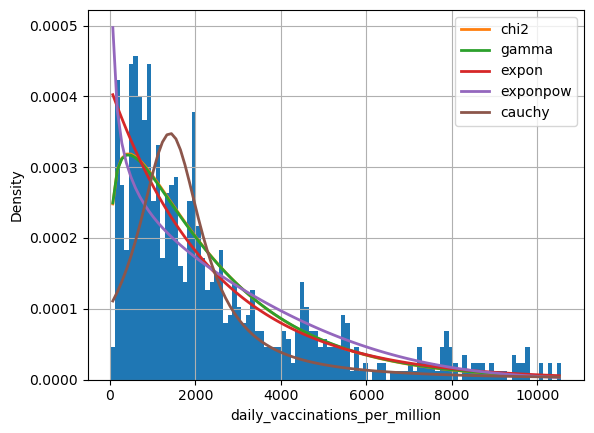

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
lognorm      8.280352e-11  3159.450511 -24795.764259     inf      0.154906   
gamma        1.009217e-10  3127.734651 -24631.726079     inf      0.203479   
exponpow     1.127990e-10  3030.764251 -24539.489775     inf      0.218231   
powerlaw     1.177709e-10  2990.461813 -24503.732158     inf      0.210711   
expon        1.192219e-10  3166.787193 -24500.300471     inf      0.296148   

             ks_pvalue  
lognorm   7.738556e-18  
gamma     1.431550e-30  
exponpow  3.811452e-35  
powerlaw  9.009376e-33  
expon     6.118725e-65  


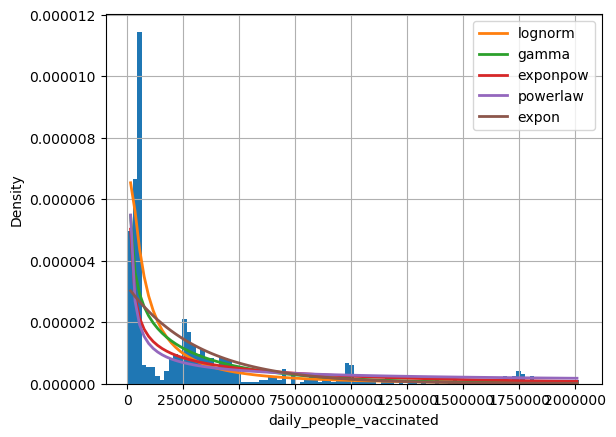

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 11.46it/s]


          sumsquare_error         aic         bic  kl_div  ks_statistic  \
lognorm        889.543486  155.867573   78.595410     inf      0.161730   
gamma         1067.401704  143.868074  229.700777     inf      0.186504   
exponpow      1097.348246  120.906405  252.638546     inf      0.157869   
chi2          1163.329775  100.371960  301.043695     inf      0.198516   
powerlaw      1269.736849  -13.280681  373.600498     inf      0.212365   

             ks_pvalue  
lognorm   2.058807e-19  
gamma     1.022703e-25  
exponpow  1.634210e-18  
chi2      4.170207e-29  
powerlaw  2.755301e-33  


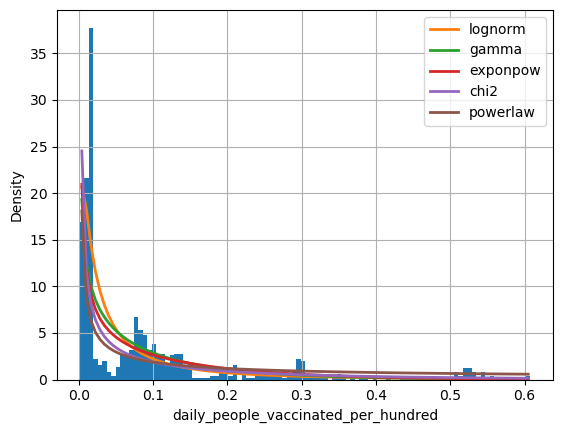

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.23it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
powerlaw                0 4140 -35556       0             0          0
cauchy                  0 4262 -35269       0             0          0
uniform                 0 4070 -35151       0             0          0
norm                    0 4143 -35144       0             0          0
rayleigh                0 4120 -35049       0             0          0


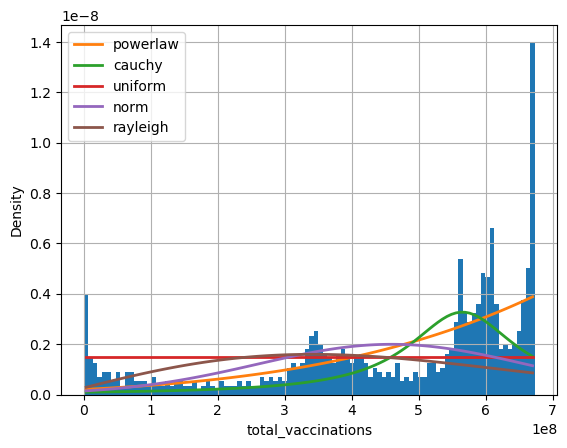

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.87it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
powerlaw                0 4041 -33383       0             0          0
cauchy                  0 4258 -33348       0             0          0
norm                    0 4021 -32845       1             0          0
lognorm                 0 4027 -32834       1             0          0
uniform                 0 3887 -32792       1             0          0


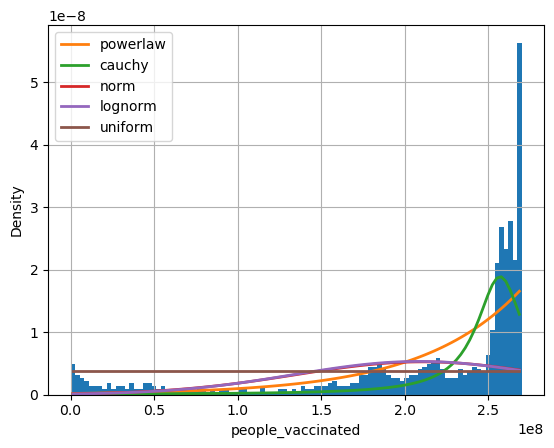

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.88it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
cauchy                  0 4248 -32932       0             0          0
powerlaw                0 4004 -32875       0             0          0
norm                    0 3972 -32412       1             0          0
uniform                 0 3855 -32384       1             0          0
rayleigh                0 3923 -32345       1             0          0


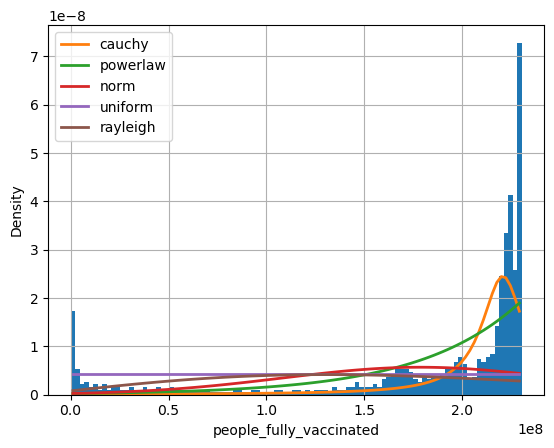

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.59it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
exponpow                0 3834 -30559     inf             0          0
powerlaw                0 4335 -30503     inf             1          0
lognorm                 0 4727 -30442     inf             1          0
expon                   0 3806 -30447     inf             0          0
uniform                 0 3745 -30446     inf             0          0


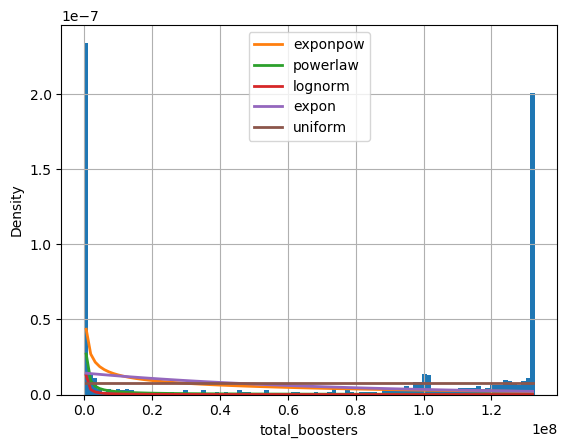

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.77it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
gamma                   0 3167 -27708     inf             0          0
expon                   0 3158 -27500     inf             0          0
exponpow                0 3148 -27179     inf             0          0
cauchy                  0 3276 -27172     inf             0          0
rayleigh                0 3207 -26929     inf             0          0


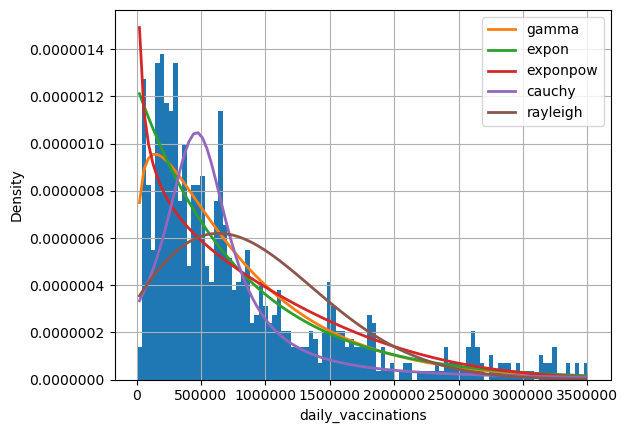

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.28it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
powerlaw                0 1137 -10660       0             0          0
cauchy                  0 1259 -10373       0             0          0
uniform                 0 1066 -10256       0             0          0
norm                    0 1140 -10248       0             0          0
lognorm                 0 1142 -10240       0             0          0


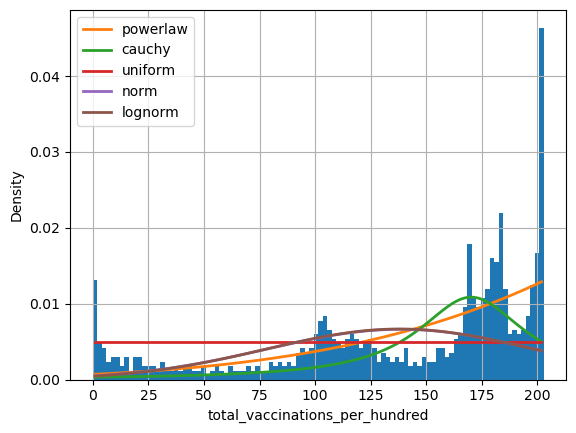

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.93it/s]


          sumsquare_error  aic   bic  kl_div  ks_statistic  ks_pvalue
powerlaw                0 1038 -8479       0             0          0
cauchy                  0 1255 -8444       0             0          0
norm                    0 1018 -7945       1             0          0
lognorm                 0 1022 -7938       1             0          0
gamma                   0 1011 -7927       1             0          0


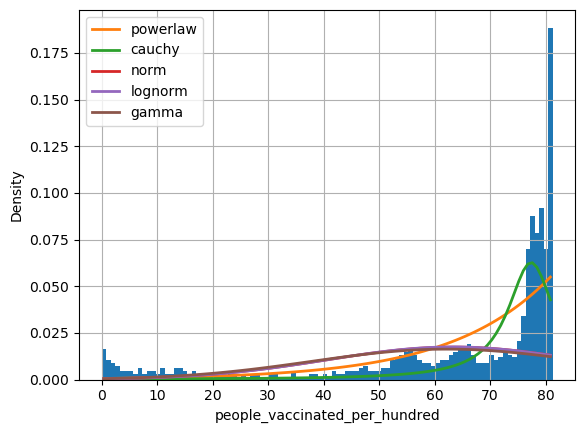

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.12it/s]


          sumsquare_error  aic   bic  kl_div  ks_statistic  ks_pvalue
cauchy                  0 1244 -8036       0             0          0
lognorm                 0  975 -7512       1             0          0
norm                    0  969 -7517       1             0          0
uniform                 0  852 -7488       1             0          0
rayleigh                0  920 -7449       1             0          0


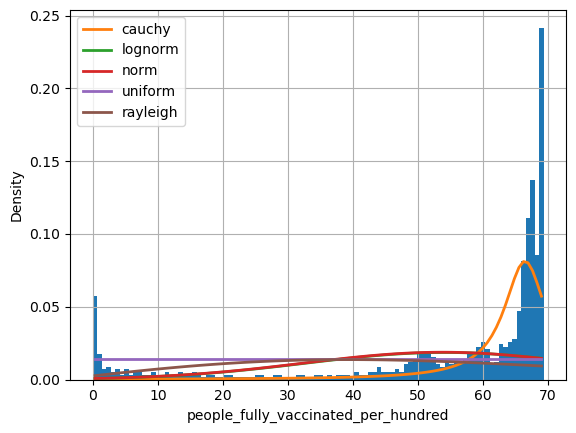

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.01it/s]


          sumsquare_error  aic   bic  kl_div  ks_statistic  ks_pvalue
chi2                    1 1230 -5807     inf             1          0
lognorm                 1 1146 -5786     inf             0          0
exponpow                1  828 -5657     inf             0          0
expon                   1  803 -5551     inf             0          0
uniform                 1  742 -5550     inf             0          0


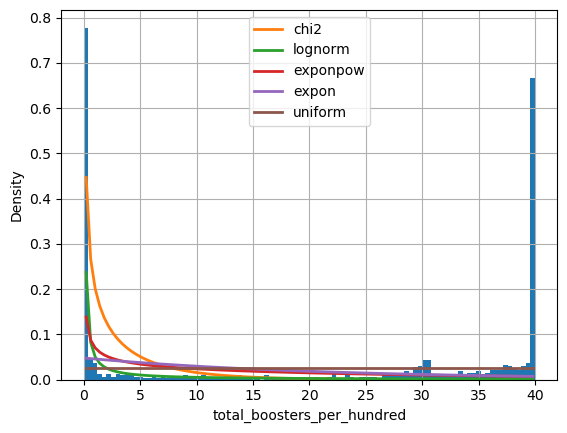

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 10.76it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
chi2                    0 2008 -18096     inf             0          0
gamma                   0 2006 -18089     inf             0          0
expon                   0 1997 -17880     inf             0          0
exponpow                0 1992 -17563     inf             0          0
cauchy                  0 2115 -17549     inf             0          0


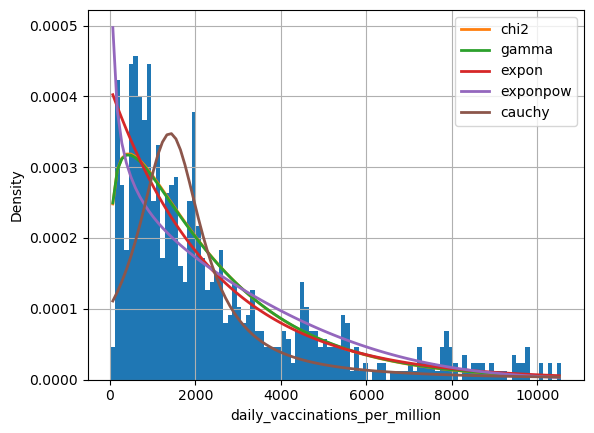

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 11.04it/s]


          sumsquare_error  aic    bic  kl_div  ks_statistic  ks_pvalue
lognorm                 0 3159 -24796     inf             0          0
gamma                   0 3128 -24632     inf             0          0
exponpow                0 3031 -24539     inf             0          0
powerlaw                0 2990 -24504     inf             0          0
expon                   0 3167 -24500     inf             0          0


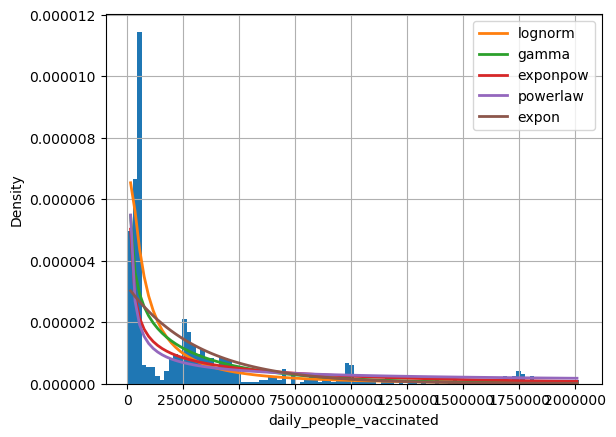

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.93it/s]


          sumsquare_error  aic  bic  kl_div  ks_statistic  ks_pvalue
lognorm               890  156   79     inf             0          0
gamma                1067  144  230     inf             0          0
exponpow             1097  121  253     inf             0          0
chi2                 1163  100  301     inf             0          0
powerlaw             1270  -13  374     inf             0          0


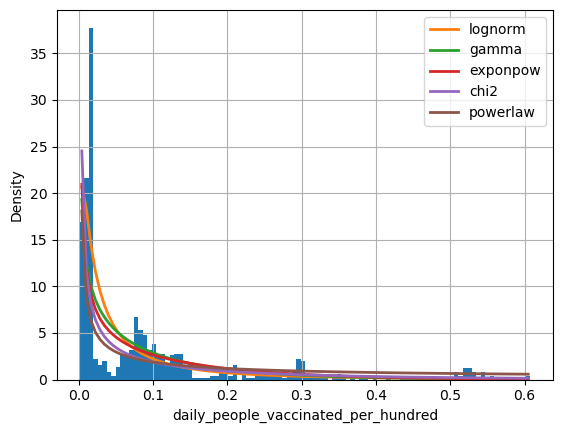

In [203]:
for i in d_columns:
    values = data[i].values
    f = Fitter(values, distributions=get_common_distributions())
    f.fit()
    print(f.summary())
    plt.ylabel("Density")
    plt.xlabel(i)
    plt.show()

In [204]:
fig = make_subplots(specs=[[{"secondary_y":False}]])

fig.add_trace(go.Scatter(x=data['date'],y=data['people_vaccinated'],name='People vaccinated' ),secondary_y=False,)

fig.add_trace(go.Scatter(x=data['date'],y=data['people_fully_vaccinated'],name='People fully vaccinated '),secondary_y=False,)

fig.update_layout(autosize=False,width=700,height=500,title_text="Vaccination Progress in United States")
fig.update_xaxes(title_text="date")
fig.update_yaxes(title_text="people",secondary_y=False)
fig.show()

# OLS (Ordinary Least Squares)

In [205]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(data['total_vaccinations'], data[['people_vaccinated', 'daily_vaccinations',
       'total_boosters']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:     total_vaccinations   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          3.661e+05
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                        0.00
Time:                        03:26:14   Log-Likelihood:                         -14802.
No. Observations:                 829   AIC:                                  2.961e+04
Df Residuals:                     826   BIC:                                  2.962e+04
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
people_vaccinated      1.8650      0.007    276.748      0.000       1.852       1.878
daily_vaccinations    -9.7736      0.641    -15.246      0.000     -11.032      -8.515
total_boosters         1.0714      0.014     74.699      0.000       1.043       1.100
==============================================================================
Omnibus:                       47.048   Durbin-Watson:                   0.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.182
Skew:                           0.530   Prob(JB):                     9.37e-11
Kurtosis:                       2.538   Cond. No.                         320.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:     total_vaccinations   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          3.661e+05
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                        0.00
Time:                        03:37:07   Log-Likelihood:                         -14802.
No. Observations:                 829   AIC:                                  2.961e+04
Df Residuals:                     826   BIC:                                  2.962e+04
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
people_vaccinated      1.8650      0.007    276.748      0.000       1.852       1.878
daily_vaccinations    -9.7736      0.641    -15.246      0.000     -11.032      -8.515
total_boosters         1.0714      0.014     74.699      0.000       1.043       1.100
==============================================================================
Omnibus:                       47.048   Durbin-Watson:                   0.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.182
Skew:                           0.530   Prob(JB):                     9.37e-11
Kurtosis:                       2.538   Cond. No.                         320.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The OLS model is used in Statsmodels for estimating the parameters of a linear regression model, which describes the relationship between a dependent variable and one or more independent variables. In particular, the OLS model in Statsmodels is used to:


*   Estimate the coefficients (slopes) of the linear regression equation.

*   Test the statistical significance of the coefficients to determine if they are different from zero.

* Calculate various goodness-of-fit statistics, such as the R-squared, which measures how well the model fits the data.

* Perform hypothesis tests on the regression coefficients, such as testing whether the coefficient of a particular independent variable is significantly different from zero.

* Generate predictions for new data based on the estimated regression equation.






# Train Test Split

For prediction we will use United States data

In [206]:
# converting date into datetime

data["date"] = pd.to_datetime(data.date)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 829 entries, 152551 to 153379
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   location                             829 non-null    object        
 1   iso_code                             829 non-null    object        
 2   date                                 829 non-null    datetime64[ns]
 3   total_vaccinations                   829 non-null    float64       
 4   people_vaccinated                    829 non-null    float64       
 5   people_fully_vaccinated              829 non-null    float64       
 6   total_boosters                       829 non-null    float64       
 7   daily_vaccinations                   829 non-null    float64       
 8   total_vaccinations_per_hundred       829 non-null    float64       
 9   people_vaccinated_per_hundred        829 non-null    float64       
 10  people

In [207]:
data["days_since"]=data.index-data.index.min()

In [208]:
data.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year,days_since
152551,United States,USA,2020-12-13,44488.0,35964.0,9419.0,0.0,4832.0,0.01,0.01,0.0,0.0,15.0,4638.0,0.001,13,12,2020,0
152552,United States,USA,2020-12-14,49320.0,40602.0,9580.0,0.0,4832.0,0.01,0.01,0.0,0.0,15.0,4638.0,0.001,14,12,2020,1
152553,United States,USA,2020-12-15,97132.0,86966.0,9904.0,0.0,26322.0,0.03,0.03,0.0,0.0,79.0,25501.0,0.008,15,12,2020,2
152554,United States,USA,2020-12-16,257142.0,242380.0,10418.0,0.0,70885.0,0.08,0.07,0.0,0.0,214.0,68805.0,0.021,16,12,2020,3
152555,United States,USA,2020-12-17,532154.0,510520.0,11238.0,0.0,121916.0,0.16,0.15,0.0,0.0,367.0,118639.0,0.036,17,12,2020,4


,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year,days_since
152551,United States,USA,2020-12-13,44488,35964,9419,0,4832,0,0,0,0,15,4638,0,13,12,2020,0
152552,United States,USA,2020-12-14,49320,40602,9580,0,4832,0,0,0,0,15,4638,0,14,12,2020,1
152553,United States,USA,2020-12-15,97132,86966,9904,0,26322,0,0,0,0,79,25501,0,15,12,2020,2
152554,United States,USA,2020-12-16,257142,242380,10418,0,70885,0,0,0,0,214,68805,0,16,12,2020,3
152555,United States,USA,2020-12-17,532154,510520,11238,0,121916,0,0,0,0,367,118639,0,17,12,2020,4


### Fitting into Linear Model
Linear regression is a type of linear model that is used to analyze the relationship between a dependent variable and one or more independent variables. It is a statistical method that involves finding the best-fitting line that describes the linear relationship between the variables.

In [209]:
X = data[['days_since', 'people_vaccinated', 'daily_vaccinations', 'people_fully_vaccinated', 'total_boosters']]

y = data['total_vaccinations']

# Splitting Data into Training and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
X_train_100 = shap.utils.sample(X_train, 100) 
# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
X_test_100 = shap.utils.sample(X_test, 100)  

In [210]:
# Initializing a Linear Model
linear_model = sklearn.linear_model.LinearRegression()  

# Training a linear model
linear_model.fit(X_train, y_train)  

LinearRegression()

LinearRegression()

In [211]:
print(X_test.shape)
print(y_test.shape)
print(X_train.shape)
print(y_train.shape)

(83, 5)
(83,)
(746, 5)
(746,)
(83, 5)
(83,)
(746, 5)
(746,)


In [212]:
from sklearn.metrics import r2_score, mean_squared_error 

y_pred = linear_model.predict(X_test)
score = r2_score(y_test, y_pred)*100
print("Accuracy of the model is %.2f" %score)
print("==============================================")

pred_df=pd.DataFrame({'Actual Value':y_test,'Predicted Value':y_pred,'Difference':y_test-y_pred})
print(pred_df.to_string(float_format='{:.0f}'.format))
y_linear_predictions = linear_model.predict(X_test).round()

Accuracy of the model is 99.94
        Actual Value  Predicted Value  Difference
153159     610322704        620838863   -10516159
153008     564591570        560582249     4009321
152841     401829599        408186142    -6356543
153109     598557236        603126503    -4569267
152719     313615863        307858802     5757061
153236     645155849        643129578     2026271
153366     672928742        673231938     -303196
152637     109996468        111582666    -1586198
152811     379279241        383716176    -4436935
153342     671482429        668146498     3335931
153302     666823130        659309597     7513533
152688     260137343        257247736     2889607
152816     383692182        388399783    -4707601
152766     347115228        345504400     1610828
152581      14320913         14847980     -527067
152932     519333375        512979246     6354129
152798     368068503        371400184    -3331681
152810     378341241        382718464    -4377223
153327     67035367

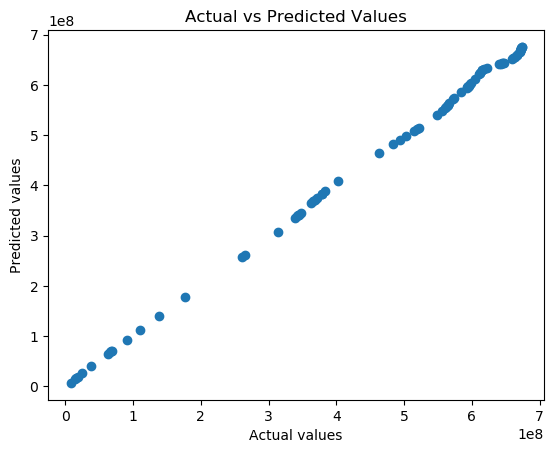

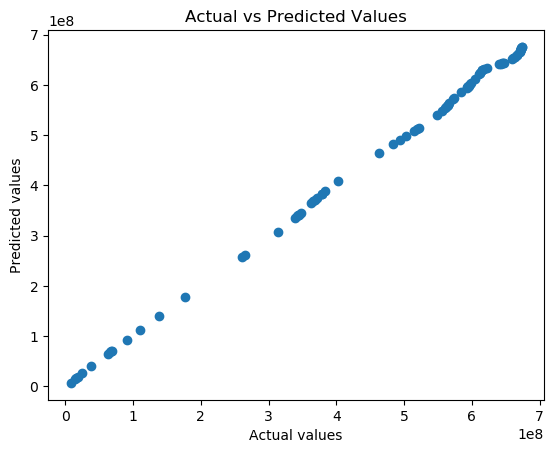

In [213]:
# create scatter plot of actual vs predicted values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Actual vs Predicted Values')
plt.show()


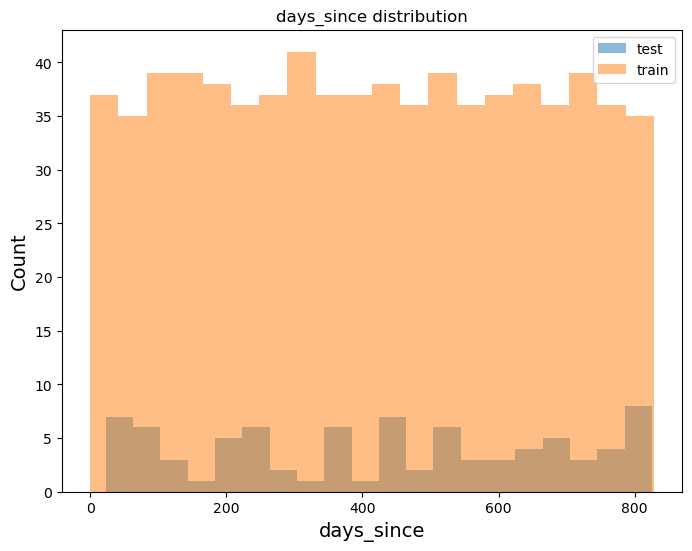

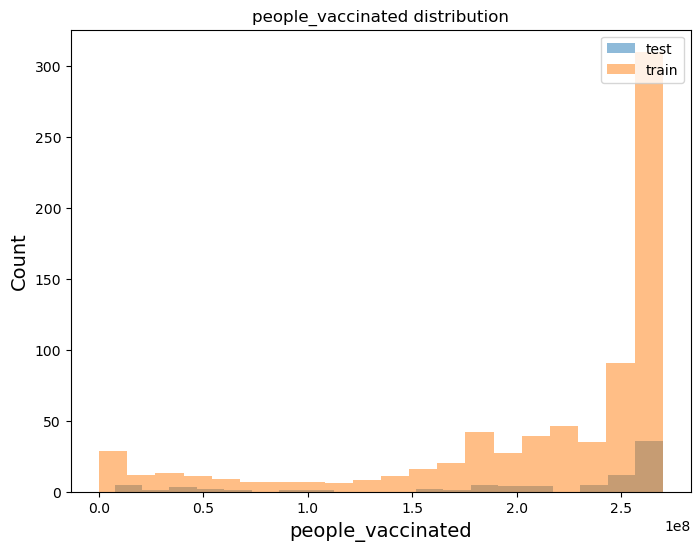

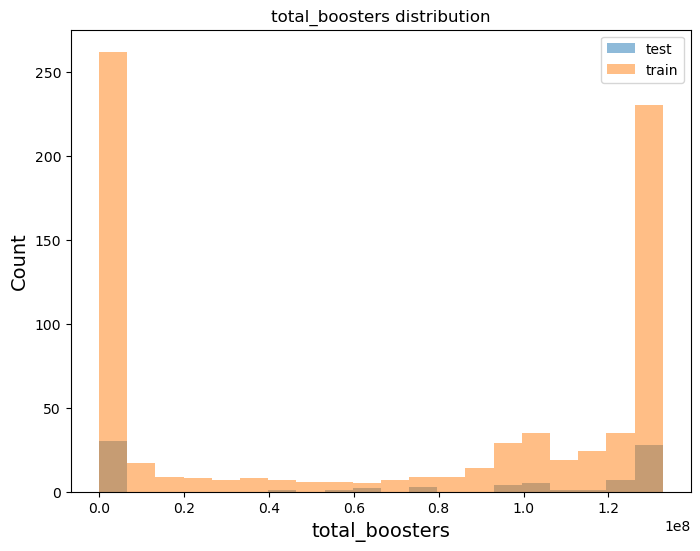

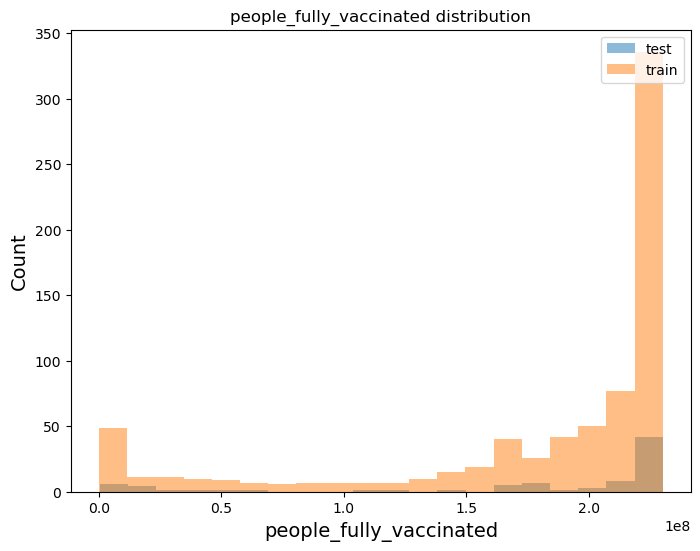

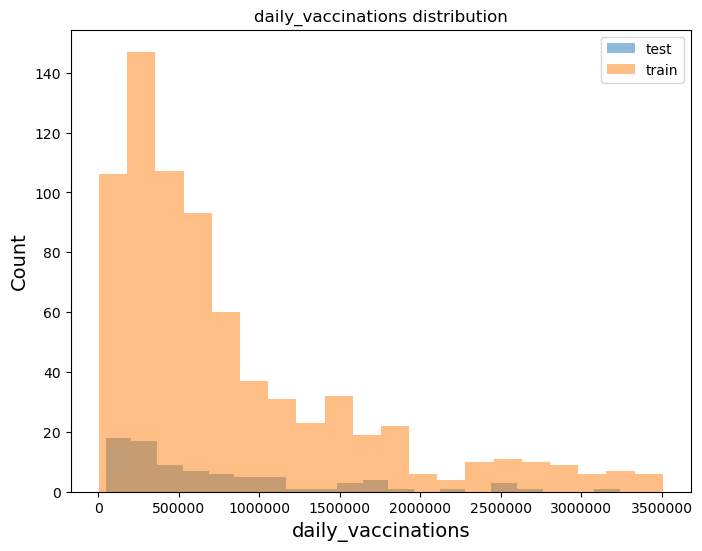

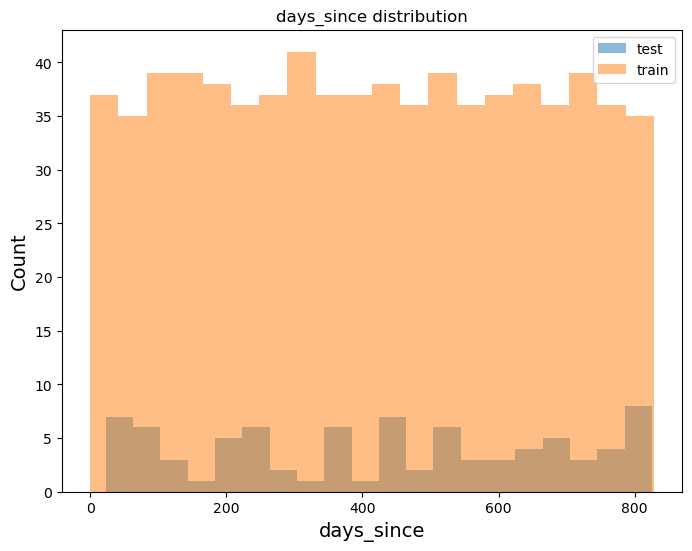

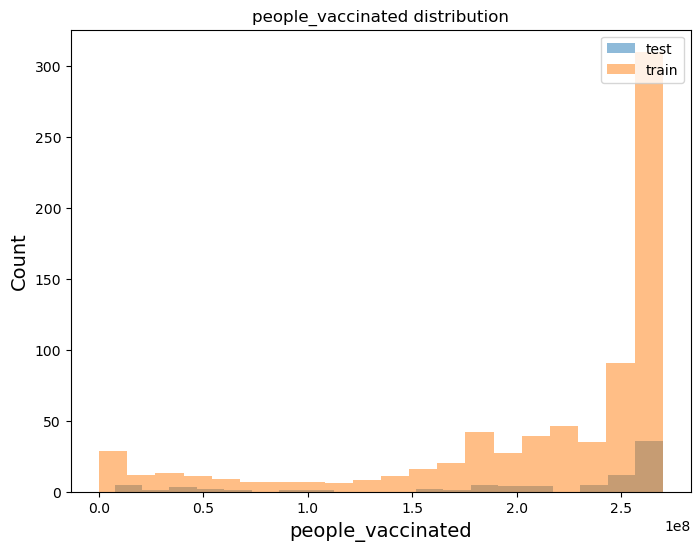

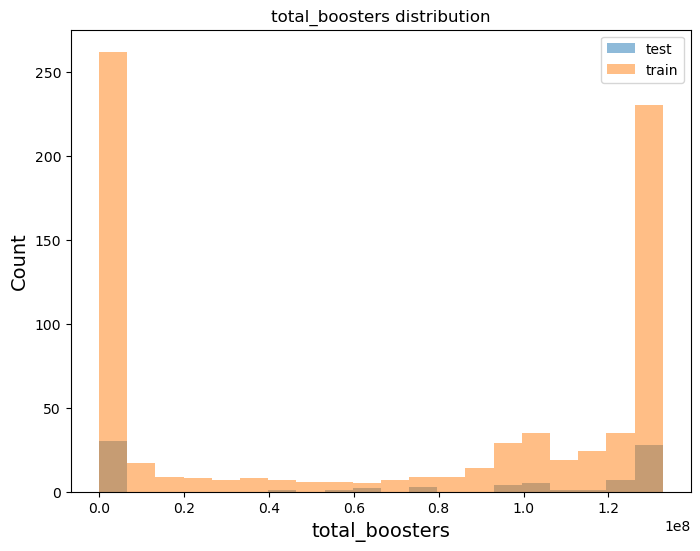

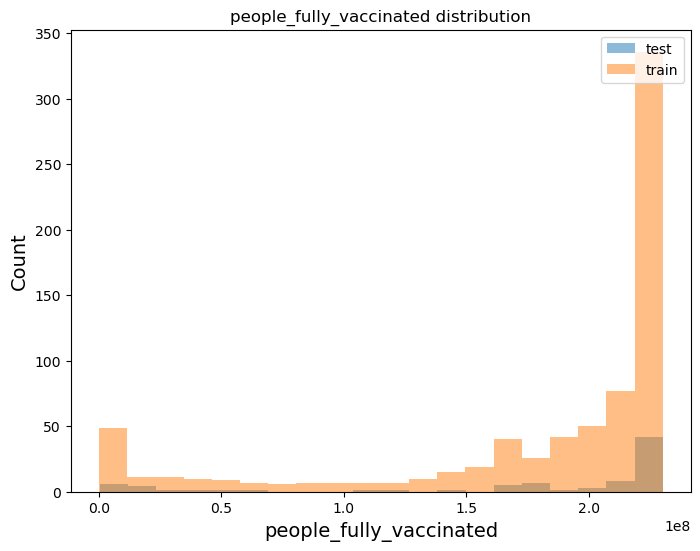

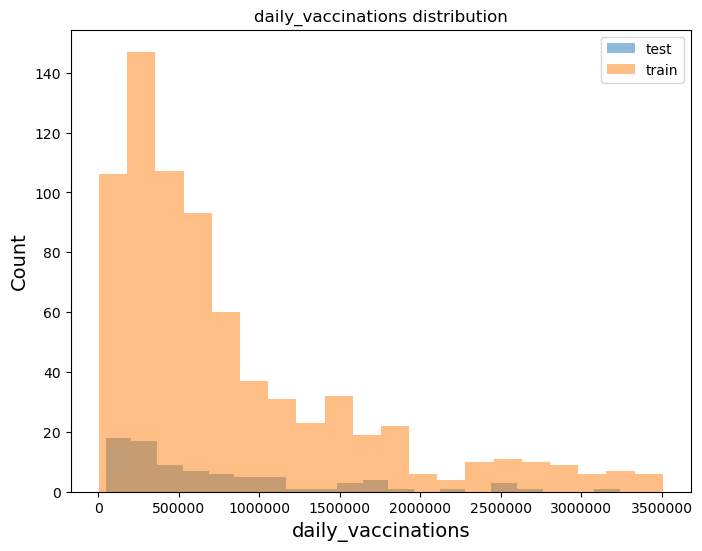

In [214]:
# Looking the data for test, training set
X_test_plot = X_test[['days_since', 'people_vaccinated', 'total_boosters', 'people_fully_vaccinated', 'daily_vaccinations']]
X_train_plot = X_train[['days_since', 'people_vaccinated', 'total_boosters', 'people_fully_vaccinated', 'daily_vaccinations']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

For better prediction, we can use
ARIMA (AutoRegressive Integrated Moving Average),
SARIMA (Seasonal ARIMA), AR (Autoregression)

## ARIMA

In [215]:
newdata = data.copy()

In [216]:
newdata['date'] = pd.to_datetime(newdata['date'])
newdata = data.set_index('date')
newdata.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829 entries, 2020-12-13 to 2023-03-21
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   location                             829 non-null    object 
 1   iso_code                             829 non-null    object 
 2   total_vaccinations                   829 non-null    float64
 3   people_vaccinated                    829 non-null    float64
 4   people_fully_vaccinated              829 non-null    float64
 5   total_boosters                       829 non-null    float64
 6   daily_vaccinations                   829 non-null    float64
 7   total_vaccinations_per_hundred       829 non-null    float64
 8   people_vaccinated_per_hundred        829 non-null    float64
 9   people_fully_vaccinated_per_hundred  829 non-null    float64
 10  total_boosters_per_hundred           829 non-null    float64
 11  daily_vaccina

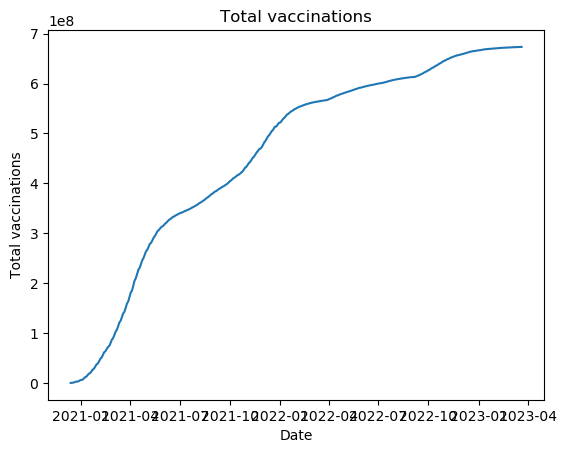

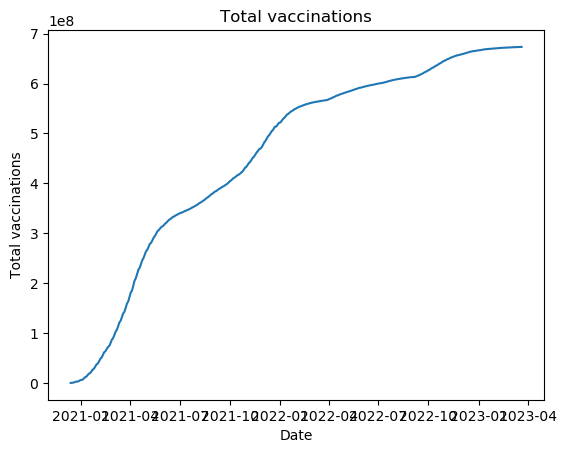

In [217]:
# Visualize the data
plt.plot(newdata['total_vaccinations'])
plt.title('Total vaccinations')
plt.xlabel('Date')
plt.ylabel('Total vaccinations')
plt.show()

In [50]:
!pip install pmdarima
from pmdarima.arima import auto_arima

# Determine the optimal values of p, d, and q
model = auto_arima(newdata['total_vaccinations'], seasonal=False, trace=True)
print(model.summary())

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=23304.606, Time=1.38 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=23704.803, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=23701.814, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=23692.109, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=23702.805, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=23585.248, Time=0.67 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=23385.580, Time=0.32 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=23531.380, Time=1.36 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=23149.805, Time=3.31 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=23455.443, Time=0.49 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=23143.620, Time=2.97 sec
 ARIMA(4,2,3)(0,0,0)[0] intercept   : AIC=22878.897, Time=1.93 sec
 ARIMA(4,2,2)(0,0,0)[0] intercept   : AIC=23536.579, T

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.9/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



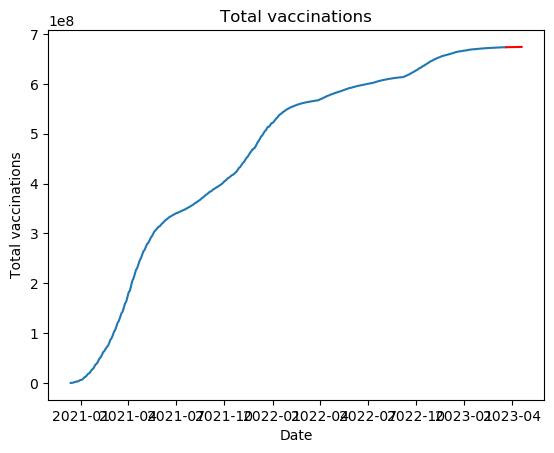

In [51]:
from statsmodels.tsa.arima.model import ARIMA

# Fit the ARIMA model
model = ARIMA(newdata['total_vaccinations'], order=(5,2,5))
model_fit = model.fit()

# Make predictions for the next 30 days
predictions = model_fit.forecast(steps=30)

# Visualize the predictions
plt.plot(newdata['total_vaccinations'])
plt.plot(predictions, color='red')
plt.title('Total vaccinations')
plt.xlabel('Date')
plt.ylabel('Total vaccinations')
plt.show()


In [52]:
newdata['total_vaccinations'].tail()


date
2023-03-17    673393992.0
2023-03-18    673415307.0
2023-03-19    673425564.0
2023-03-20    673458097.0
2023-03-21    673465377.0
Name: total_vaccinations, dtype: float64

In [53]:
# format the float values to display 2 decimal places
pd.options.display.float_format = '{:.2f}'.format

# print the predictions
print(predictions)


2023-03-22   673480572.86
2023-03-23   673510194.91
2023-03-24   673549032.16
2023-03-25   673555167.83
2023-03-26   673558312.21
2023-03-27   673581302.33
2023-03-28   673599143.36
2023-03-29   673608756.20
2023-03-30   673640585.16
2023-03-31   673676798.22
2023-04-01   673684237.66
2023-04-02   673687742.25
2023-04-03   673711264.64
2023-04-04   673729135.80
2023-04-05   673738917.71
2023-04-06   673769879.83
2023-04-07   673805238.87
2023-04-08   673813035.23
2023-04-09   673817357.33
2023-04-10   673841092.13
2023-04-11   673859125.65
2023-04-12   673869003.95
2023-04-13   673899201.88
2023-04-14   673933735.47
2023-04-15   673941891.11
2023-04-16   673946973.22
2023-04-17   673970887.63
2023-04-18   673989062.95
2023-04-19   673999048.25
2023-04-20   674028534.29
Freq: D, Name: predicted_mean, dtype: float64


# Outliers
Outliers are data points that deviate significantly from the rest of the data points in a dataset. They are extreme values that are much larger or smaller than the other values in the dataset. Outliers can occur due to errors in measurement or data collection, or they can be genuine data points that represent unusual or rare events.

Detecting outliers is an important step in data analysis because they can have a significant impact on the analysis results. Outliers can distort the data and lead to biased or inaccurate analysis results. Therefore, it is important to detect and handle outliers appropriately to ensure the accuracy and reliability of the analysis.

After detecting outliers, one approach is to apply linear regression to the data, both with and without outliers, and compare the results. Linear regression is a statistical method that models the relationship between a dependent variable and one or more independent variables. The model can be used to predict the value of the dependent variable based on the values of the independent variables.

Comparing the linear regression results with and without outliers can provide insights into the impact of outliers on the analysis results. If the results are significantly different, it indicates that the outliers have a significant impact on the analysis, and they need to be handled appropriately.

In [54]:
# Detect outliers
outliers_indices = detect_outliers(data, 0, ['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'daily_vaccinations', 'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred',
       'total_boosters_per_hundred', 'daily_vaccinations_per_million','daily_people_vaccinated', 'daily_people_vaccinated_per_hundred'])


In [55]:
# Print outliers
print(outliers_indices)

[152551, 152552, 152553, 152554, 152555, 152556, 152557, 152558, 152559, 152560, 152561, 152562, 152563, 152564, 152565, 152566, 152567, 152568, 152569, 152570, 152571, 152572, 152573, 152574, 152575, 152576, 152577, 152578, 152579, 152580, 152581, 152582, 152583, 152584, 152585, 152586, 152587, 152588, 152589, 152590, 152591, 152592, 152593, 152594, 152595, 152596, 152597, 152598, 152599, 152600, 152601, 152602, 152603, 152604, 152605, 152606, 152607, 152608, 152609, 152610, 152611, 152612, 152613, 152614, 152615, 152616, 152617, 152618, 152619, 152620, 152621, 152622, 152623, 152624, 152625, 152626, 152627, 152628, 152629, 152630, 152631, 152632, 152633, 152634, 152635, 152636, 152637, 152638, 152639, 152640, 152641, 152642, 152643, 152644, 152645, 152646, 152647, 152648, 152649, 152650, 152651, 152652, 152653, 152654, 152655, 152656, 152657, 152658, 152659, 152660, 152661, 152662, 152663, 152664, 152665, 152666, 152667, 152668, 152669, 152670, 152671, 152672, 152673, 152674, 152675,

In [56]:
# view data having outliers
subset_data = data.iloc[data.index.isin(outliers_indices)]
subset_data

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year,days_since
152551,United States,USA,2020-12-13,44488.00,35964.00,9419.00,0.00,4832.00,0.01,0.01,0.00,0.00,15.00,4638.00,0.00,13,12,2020,0
152552,United States,USA,2020-12-14,49320.00,40602.00,9580.00,0.00,4832.00,0.01,0.01,0.00,0.00,15.00,4638.00,0.00,14,12,2020,1
152553,United States,USA,2020-12-15,97132.00,86966.00,9904.00,0.00,26322.00,0.03,0.03,0.00,0.00,79.00,25501.00,0.01,15,12,2020,2
152554,United States,USA,2020-12-16,257142.00,242380.00,10418.00,0.00,70885.00,0.08,0.07,0.00,0.00,214.00,68805.00,0.02,16,12,2020,3
152555,United States,USA,2020-12-17,532154.00,510520.00,11238.00,0.00,121916.00,0.16,0.15,0.00,0.00,367.00,118639.00,0.04,17,12,2020,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152689,United States,USA,2021-04-30,263061575.00,153072153.00,115032995.00,136.00,2514891.00,79.23,46.10,34.65,0.00,7575.00,992820.00,0.30,30,4,2021,138
152690,United States,USA,2021-05-01,264932452.00,153786469.00,116209497.00,145.00,2465687.00,79.80,46.32,35.00,0.00,7427.00,951614.00,0.29,1,5,2021,139
152691,United States,USA,2021-05-02,265814643.00,154112977.00,116796919.00,148.00,2449451.00,80.06,46.42,35.18,0.00,7378.00,928229.00,0.28,2,5,2021,140
152692,United States,USA,2021-05-03,267786687.00,154756937.00,118200589.00,152.00,2388265.00,80.66,46.61,35.60,0.00,7193.00,885632.00,0.27,3,5,2021,141


In [57]:
usa_data = data.copy()

In [58]:
# removing outliers
usa_data.drop(outliers_indices,axis=0,inplace=True)

In [59]:
print(usa_data.shape)
usa_data.columns

(686, 19)


Index(['location', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'daily_vaccinations', 'total_vaccinations_per_hundred',
       'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred',
       'total_boosters_per_hundred', 'daily_vaccinations_per_million',
       'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred', 'day',
       'month', 'year', 'days_since'],
      dtype='object')

## **Running the regression model without outliers**

In [60]:
from sklearn.model_selection import  train_test_split

X = usa_data[['days_since', 'people_vaccinated', 'total_boosters', 'people_fully_vaccinated', 'daily_vaccinations']]

y = usa_data['total_vaccinations']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

OX_t, OX_test, Oy_t, Oy_test = train_test_split(X, y, test_size=0.1, random_state=1)
OX_train, OX_val, Oy_train, Oy_val = train_test_split(OX_t, Oy_t, test_size=0.15, random_state=1)

In [61]:
# Create linear regression object
model_o = sklearn.linear_model.LinearRegression()  

# Train the model using the training sets
model_o.fit(OX_train,Oy_train)

LinearRegression()

In [62]:
#  Make predictions using the testing dataset
y_pred_outlier = model_o.predict(OX_test)
# print(y_pred)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(Oy_test, y_pred_outlier))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(Oy_test, y_pred_outlier))

r2 = r2_score(Oy_test,y_pred_outlier)
print('R^2 score on training set =',r2)

Mean squared error: 34387161287152.76
Coefficient of determination: 1.00
R^2 score on training set = 0.9978801955345851


In [63]:
# Make predictions using the validation dataset
Oy_pred_val = model_o.predict(OX_val)
# print(y_pred)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(Oy_val, Oy_pred_val))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(Oy_val, Oy_pred_val))

r2_val = r2_score(Oy_val, Oy_pred_val)
print('R^2 score on training set =',r2_val)

Mean squared error: 27113043300131.82
Coefficient of determination: 1.00
R^2 score on training set = 0.9981025748850645


In [64]:
#Understanding the important features 
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(model_o, random_state=1).fit(OX_test, Oy_test)
eli5.show_weights(perm, feature_names = OX_test.columns.tolist())

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Weight,Feature
0.5915 ± 0.1631,people_vaccinated
0.2141 ± 0.0405,days_since
0.1026 ± 0.0192,total_boosters
0.0238 ± 0.0037,people_fully_vaccinated
0.0000 ± 0.0000,daily_vaccinations


The resulting visualization shows the feature importance scores in descending order, with the most important features at the top. Features that have a positive score contribute to the model's performance, while features that have a negative score indicate that permuting that feature actually improves the model's performance.

# **Create 3 col. for numbers for 1%, 5% and 10% missing data**

We are randomly removing 1%, 5%, and 10% of data from a dataset and imputing them using KNN imputer is a common technique used in data analysis to test the robustness of the analysis to missing data. KNN imputer is a machine learning algorithm that uses the k-nearest neighbors approach to estimate the missing values. The accuracy of the imputed values depends on the size and quality of the remaining data points in the dataset.







In [65]:
df_number = usa_data[['total_vaccinations']]
df_number['number_copy_1_percent'] = df_number[['total_vaccinations']]
df_number['number_copy_5_percent'] = df_number[['total_vaccinations']]
df_number['number_copy_10_percent'] = df_number[['total_vaccinations']]
df_number['sample_num'] = usa_data['people_vaccinated']
df_number['sample_num'] = df_number['sample_num']/1000

# Reset the index to start from 0
df_number = df_number.reset_index(drop=True)
df_number

<ipython-input-65-f7acd386a4fc>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-65-f7acd386a4fc>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-65-f7acd386a4fc>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-65-f7acd38

,total_vaccinations,number_copy_1_percent,number_copy_5_percent,number_copy_10_percent,sample_num
0,272859749.00,272859749.00,272859749.00,272859749.00,156398.14
1,275394118.00,275394118.00,275394118.00,275394118.00,157180.98
2,277916097.00,277916097.00,277916097.00,277916097.00,157980.96
3,279458919.00,279458919.00,279458919.00,279458919.00,158487.37
4,280076033.00,280076033.00,280076033.00,280076033.00,158691.82
...,...,...,...,...,...
681,673393992.00,673393992.00,673393992.00,673393992.00,269819.27
682,673415307.00,673415307.00,673415307.00,673415307.00,269824.34
683,673425564.00,673425564.00,673425564.00,673425564.00,269827.47
684,673458097.00,673458097.00,673458097.00,673458097.00,269834.49


## Check % missing values in this dataframe

In [66]:
def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [67]:
print(get_percent_missing(df_number))

                                   column_name  percent_missing
total_vaccinations          total_vaccinations             0.00
number_copy_1_percent    number_copy_1_percent             0.00
number_copy_5_percent    number_copy_5_percent             0.00
number_copy_10_percent  number_copy_10_percent             0.00
sample_num                          sample_num             0.00


## Create missing helper function

In [68]:
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

## Create missing data in each col

In [69]:
create_missing(df_number, 0.01, 'number_copy_1_percent')
create_missing(df_number, 0.05, 'number_copy_5_percent')
create_missing(df_number, 0.1, 'number_copy_10_percent')

In [70]:
print(get_percent_missing(df_number))

                                   column_name  percent_missing
total_vaccinations          total_vaccinations             0.00
number_copy_1_percent    number_copy_1_percent             1.02
number_copy_5_percent    number_copy_5_percent             4.96
number_copy_10_percent  number_copy_10_percent            10.06
sample_num                          sample_num             0.00


In [71]:
# Store Index of NaN values in each coloumns
number_1_idx = list(np.where(df_number['number_copy_1_percent'].isna())[0])
number_5_idx = list(np.where(df_number['number_copy_5_percent'].isna())[0])
number_10_idx = list(np.where(df_number['number_copy_10_percent'].isna())[0])

In [72]:
print(f"Length of number_1_idx is {len(number_1_idx)} and it contains {(len(number_1_idx)/len(df_number['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_number['number_copy_1_percent'])}")
print(f"Length of number_5_idx is {len(number_5_idx)} and it contains {(len(number_5_idx)/len(df_number['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_number['number_copy_1_percent'])}")
print(f"Length of number_10_idx is {len(number_10_idx)} and it contains {(len(number_10_idx)/len(df_number['number_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_number['number_copy_1_percent'])}")

Length of number_1_idx is 7 and it contains 1.0204081632653061% of total data in column | Total rows: 686
Length of number_5_idx is 34 and it contains 4.956268221574344% of total data in column | Total rows: 686
Length of number_10_idx is 69 and it contains 10.058309037900875% of total data in column | Total rows: 686


In [73]:
from sklearn.impute import KNNImputer

#Creating a seperate dataframe for performing the KNN imputation
df_number1 = df_number[['sample_num','number_copy_10_percent']]
imputer = KNNImputer(n_neighbors=5)
imputed_number_df = pd.DataFrame(imputer.fit_transform(df_number1), columns = df_number1.columns)


In [74]:
imputed_number_df.sample(10)

,sample_num,number_copy_10_percent
502,263865.47,619078042.60
145,214496.58,399543895.00
469,262583.13,610977709.00
231,241754.43,512043252.00
132,211202.97,390408068.00
188,225301.42,445416843.00
478,262931.47,612380929.00
634,269241.79,670380645.00
163,218627.26,416172091.00
561,267239.80,654548564.00


In [75]:
# Check the % missing data in dataframe now
print(get_percent_missing(imputed_number_df))

                                   column_name  percent_missing
sample_num                          sample_num             0.00
number_copy_10_percent  number_copy_10_percent             0.00


In [76]:
df_number['total_vaccinations']

0     272859749.00
1     275394118.00
2     277916097.00
3     279458919.00
4     280076033.00
          ...     
681   673393992.00
682   673415307.00
683   673425564.00
684   673458097.00
685   673465377.00
Name: total_vaccinations, Length: 686, dtype: float64

In [77]:
# Adding additional columns for wchecking and calculations
imputed_number_df['original'] = df_number['total_vaccinations'].values
imputed_number_df['original']

0     272859749.00
1     275394118.00
2     277916097.00
3     279458919.00
4     280076033.00
          ...     
681   673393992.00
682   673415307.00
683   673425564.00
684   673458097.00
685   673465377.00
Name: original, Length: 686, dtype: float64

In [78]:
imputed_number_df['diff'] = imputed_number_df['original'] - imputed_number_df['number_copy_10_percent']

In [79]:
imputed_number_df

,sample_num,number_copy_10_percent,original,diff
0,156398.14,272859749.00,272859749.00,0.00
1,157180.98,275394118.00,275394118.00,0.00
2,157980.96,277916097.00,277916097.00,0.00
3,158487.37,279458919.00,279458919.00,0.00
4,158691.82,280076033.00,280076033.00,0.00
...,...,...,...,...
681,269819.27,673393992.00,673393992.00,0.00
682,269824.34,673415307.00,673415307.00,0.00
683,269827.47,673425564.00,673425564.00,0.00
684,269834.49,673458097.00,673458097.00,0.00


In [80]:
for i in number_10_idx:
  # print(i)
  print(str(imputed_number_df['number_copy_10_percent'][i])+", "+str(imputed_number_df['original'][i])+", "+str(imputed_number_df['diff'][i]))

303593374.4, 303425101.0, -168273.39999997616
319159919.0, 318905404.0, -254515.0
324618399.2, 323942678.0, -675721.1999999881
331985734.4, 331408032.0, -577702.3999999762
332977449.2, 332336036.0, -641413.1999999881
343723992.4, 344141246.0, 417253.60000002384
345083102.6, 345411244.0, 328141.39999997616
352737886.4, 353036718.0, 298831.60000002384
355436482.6, 355325401.0, -111081.60000002384
360947949.6, 361091773.0, 143823.39999997616
368643593.0, 369028793.0, 385200.0
372209732.0, 371096893.0, -1112839.0
405211436.2, 405354396.0, 142959.80000001192
411367862.4, 411476442.0, 108579.60000002384
423074678.6, 424558481.0, 1483802.3999999762
424888228.4, 426134142.0, 1245913.6000000238
436258883.8, 437066340.0, 807456.1999999881
455191035.8, 455883301.0, 692265.1999999881
483758516.2, 483283009.0, -475507.1999999881
492454371.0, 491703520.0, -750851.0
503300448.8, 502574548.0, -725900.8000000119
514673369.2, 515932990.0, 1259620.800000012
521466791.6, 521502982.0, 36190.39999997616
532

In [81]:
imputed_number_df.to_csv('imputed_number_df.csv', index=False)

In [82]:
imputed_number_df['number_copy_10_percent']

0     272859749.00
1     275394118.00
2     277916097.00
3     279458919.00
4     280076033.00
          ...     
681   673393992.00
682   673415307.00
683   673425564.00
684   673458097.00
685   673465377.00
Name: number_copy_10_percent, Length: 686, dtype: float64

In [83]:
df_number['total_vaccinations']

0     272859749.00
1     275394118.00
2     277916097.00
3     279458919.00
4     280076033.00
          ...     
681   673393992.00
682   673415307.00
683   673425564.00
684   673458097.00
685   673465377.00
Name: total_vaccinations, Length: 686, dtype: float64

In [84]:
# create list of difference bwtween imputed and orginal value

number_diff_1 = []
number_diff_5 = []
number_diff_10 = []
count = 0
'''
for i in number_1_idx:
    count +=1
    diff1 = abs(imputed_number_df['number_copy_1_percent'][i] - df_number['number'][i])
    number_diff_1.append(diff1)

for i in number_5_idx:
    diff5 = abs(imputed_number_df['number_copy_5_percent'][i] - df_number['number'][i])
    number_diff_5.append(diff5)
'''
for i in number_10_idx:
  # print(i)
  diff10 = abs(imputed_number_df['number_copy_10_percent'][i] - df_number['total_vaccinations'][i])
  number_diff_10.append(diff10)

In [85]:
#print(len(number_diff_1))
#print(len(number_diff_5))
print(len(number_diff_10))

69


69% of the Missing Values were recovered using the KNN imputation technique

# Fit Tree Based Model
Random Forest Regressor is a machine learning algorithm that can be used for predicting a numerical value, such as the price of a house. It works by combining many decision trees together to make a more accurate prediction.

Each decision tree is like a series of yes or no questions that help the algorithm determine what the predicted value should be. For example, in the case of house prices, a decision tree might ask questions like "Is the house located in a nice neighborhood?" or "How many bedrooms does the house have?".

The Random Forest Regressor creates many of these decision trees, each based on a random subset of the training data, and then combines their predictions to make a final prediction. This helps to reduce the chance of overfitting and improve the accuracy of the model.

In [86]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [87]:
y_tree_based_predictions = tree_model.predict(X_test).round()

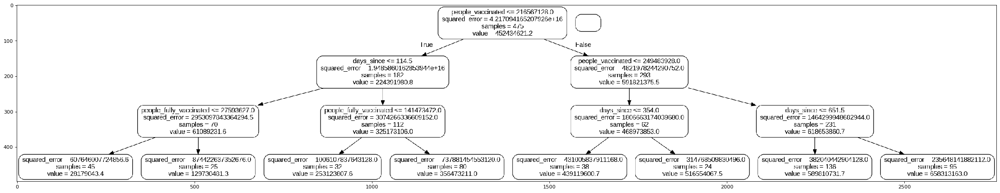

In [88]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(35, 25), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

## Interpreting Nodes of a Tree-Based Model

Interpreting the nodes of a tree-based model involves understanding the decision-making process that the model is using to make predictions. Each node in a decision tree represents a binary split on one of the input features. The following steps can be used to interpret the nodes of a tree-based model:

1. Start at the root node of the tree and look at the feature that the node is splitting on. This feature is the most important feature for making predictions.

2. Follow the path down the tree based on the values of the input features. Each internal node represents a decision based on the value of the feature that the node splits on.

3. At each leaf node, the tree provides a prediction for the target variable based on the input features that led to that leaf node.

4. The tree's split criteria, such as Gini impurity or entropy, can also provide insight into the relative importance of each feature in making predictions.

Finally, visualizing the tree can help in understanding its decision-making process and identifying any potential issues such as overfitting or bias.
Now we will start from the extreme left side as leaf 1.

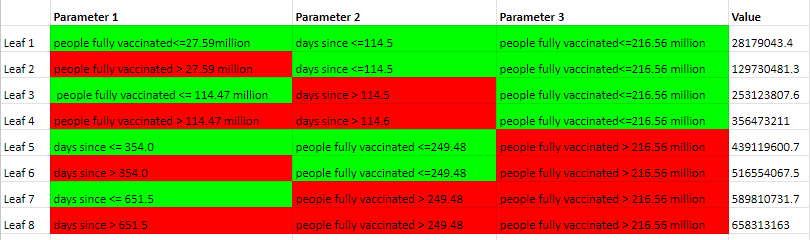

In [89]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [90]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: people_vaccinated    Importance: 0.49
Variable: days_since           Importance: 0.23
Variable: total_boosters       Importance: 0.15
Variable: people_fully_vaccinated Importance: 0.12
Variable: daily_vaccinations   Importance: 0.01


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

In [91]:
# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

# Fitting a Support Vector Machine (SVM)


In [92]:
from sklearn import svm
from sklearn.metrics import r2_score

regr = svm.SVR()
svm_model = regr.fit(X_train, y_train)

In [93]:
svm_predictions = svm_model.predict(X_test).round()

# Fitting a MLP Regressor

In [94]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, max_iter=500).fit(X_train, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



In [95]:
mlp_predictions = regr.predict(X_test).round()

# Accuracy 


In [96]:
print(
    "Accuracy of predicting total vaccinations using Linear Model = ",
    100 - percentage_change(y_test, y_linear_predictions),
)

print(
    "Accuracy of predicting total vaccinations using Tree Based Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions),
)

print(
    "Accuracy of predicting total vaccinations using MLP Regressor = ",
    100 - percentage_change(y_test, mlp_predictions),
)
print(
    "Accuracy of predicting total vaccinations using SVM = ",
    100 - percentage_change(y_test, svm_predictions),
)

Accuracy of predicting total vaccinations using Linear Model =  98.62047864173897
Accuracy of predicting total vaccinations using Tree Based Model =  88.31763972304815
Accuracy of predicting total vaccinations using MLP Regressor =  97.5154966891213
Accuracy of predicting total vaccinations using SVM =  -216.77115261511528


# **What did you do?**

The dataset used for this regression model is related to COVID-19 vaccination data, which includes various features related to the number of vaccinations given, the population, and the country. The goal of the analysis is to predict the total number of vaccinations based on the available features.

The first step in the analysis is Exploratory Data Analysis (EDA), which involves understanding the dataset's structure, checking for missing values, and identifying outliers. After that, data cleaning was performed to handle missing values and remove any duplicate or irrelevant data.

Data visualization was also conducted to better understand the relationships between the features and the target variable. The data visualization helped in identifying any patterns and trends that can be used to improve the model.

Next, the dataset was split into training and testing data. Four models were used in this analysis: Linear Regression, Random Forest Regressor, MLP Regressor, and SVM. The models were trained on the training data and tested on the testing data. The accuracy of each model was computed to evaluate the performance of the model.

Outliers were also identified and handled to improve the accuracy of the models. Outliers can have a significant impact on the model's performance, and removing them can improve the model's accuracy.




# AutoML H20


In [97]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [98]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

4


In [99]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:16762..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp95la2smm
  JVM stdout: /tmp/tmp95la2smm/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp95la2smm/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:16762
Connecting to H2O server at http://127.0.0.1:16762 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_g975b9
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,4 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [100]:
# converting pandas dataframe to H2O dataframe for AutoML
df= h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [101]:
df.types

{'location': 'enum',
 'iso_code': 'enum',
 'date': 'time',
 'total_vaccinations': 'int',
 'people_vaccinated': 'int',
 'people_fully_vaccinated': 'int',
 'total_boosters': 'int',
 'daily_vaccinations': 'int',
 'total_vaccinations_per_hundred': 'real',
 'people_vaccinated_per_hundred': 'real',
 'people_fully_vaccinated_per_hundred': 'real',
 'total_boosters_per_hundred': 'real',
 'daily_vaccinations_per_million': 'int',
 'daily_people_vaccinated': 'int',
 'daily_people_vaccinated_per_hundred': 'real',
 'day': 'int',
 'month': 'int',
 'year': 'int',
 'days_since': 'int'}

In [102]:
X_col = df.columns
print(X_col)

['location', 'iso_code', 'date', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'daily_vaccinations', 'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred', 'daily_vaccinations_per_million', 'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred', 'day', 'month', 'year', 'days_since']


In [103]:
# Setting target and predictor variables
y_col = 'total_vaccinations'
X_col.remove(y_col)  # Removing the result frm our predictors data
print(X_col)

['location', 'iso_code', 'date', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'daily_vaccinations', 'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred', 'daily_vaccinations_per_million', 'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred', 'day', 'month', 'year', 'days_since']


In [104]:
X_col.remove('total_vaccinations_per_hundred')
print(X_col)

['location', 'iso_code', 'date', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'daily_vaccinations', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred', 'daily_vaccinations_per_million', 'daily_people_vaccinated', 'daily_people_vaccinated_per_hundred', 'day', 'month', 'year', 'days_since']


In [105]:
print(y_col)

total_vaccinations


## Setting of AutoML

max_models: Maximum number of models to train

balance_classes: set to True to balance the class labels for tasks with imbalance data

seed : Set for reproducibility

In [106]:
# Setting of AutoML
automl = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [107]:
#splitting datset into train and test
train, test = df.split_frame([0.80])

H2O AutoML trains the following models in a sequential order:

  * Three pre-specified XGBoost GBM (Gradient Boosting Machine) models

  * A fixed grid of GLMs

  * A default Random Forest (DRF)

  * Five pre-specified H2O GBMs

  * A near-default Deep Neural Net      

  * An Extremely Randomized Forest (XRT)

  * A random grid of XGBoost GBMs

  * A random grid of H2O GBMs

  * A random grid of Deep Neural Nets


In addition to these models, H2O AutoML also trains:

  * A stacked ensemble of all the models trained above

  * A "Best of Family" Stacked Ensemble that contains the best performing model for each algorithm class.

## Training the dataset on different models

In [108]:
# Training the dataset on different models
automl.train(x=X_col, y=y_col, training_frame=train)

AutoML progress: |
03:28:01.617: _train param, Dropping bad and constant columns: [iso_code, location]

███
03:28:09.893: _train param, Dropping bad and constant columns: [iso_code, location]
03:28:11.691: _train param, Dropping bad and constant columns: [iso_code, location]

██████
03:28:30.444: _train param, Dropping unused columns: [iso_code, location]
03:28:30.897: _train param, Dropping bad and constant columns: [iso_code, location]


03:28:33.386: _train param, Dropping bad and constant columns: [iso_code, location]

███
03:28:44.234: _train param, Dropping bad and constant columns: [iso_code, location]

███
03:28:52.534: _train param, Dropping bad and constant columns: [iso_code, location]

██
03:28:59.119: _train param, Dropping bad and constant columns: [iso_code, location]

█
03:29:04.588: _train param, Dropping unused columns: [iso_code, location]
03:29:04.899: _train param, Dropping unused columns: [iso_code, location]
03:29:05.291: _train param, Dropping bad and constant c

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_1_20230410_32801


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    95                 95                          73820                  6            6            6             31            64            57.2316

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 4303801128.014518
RMSE: 65603.36217004825
MAE: 50282.16626783033
RMSLE: 0.031595889345776174
Mean Residual Deviance: 4303801128.014518

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 506872651023.8701
RMSE: 711949.8936188348
MAE: 443399.70384000265
RMSLE: 0.0743165586525192
Mean Residual Deviance: 506872651023.8701

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
mae                     443297       76591.2      511757        518492        446195        404492        335549
mean_residual_deviance  5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
mse                     5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
r2                      0.999987     4.08061e-06  0.999985      0.999982      0.999987      0.99999       0.999993
residual_deviance       5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
rmse                    703648       120363       783801        846365        714063        630811        543202
rmsle                   0.0517814    0.0593031    0.155707      0.0325008     0.0414112     0.0184697     0.0108184

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 03:29:21  4.434 sec   0                  1.99975e+08      1.67584e+08     3.99899e+16
    2023-04-10 03:29:21  4.480 sec   5                  1.18091e+08      9.89521e+07     1.39454e+16
    2023-04-10 03:29:21  4.556 sec   10                 6.97302e+07      5.84272e+07     4.8623e+15
    2023-04-10 03:29:21  4.615 sec   15                 4.11773e+07      3.44986e+07     1.69557e+15
    2023-04-10 03:29:21  4.676 sec   20                 2.43184e+07      2.03724e+07     5.91384e+14
    2023-04-10 03:29:21  4.751 sec   25                 1.43652e+07      1.20327e+07     2.06359e+14
    2023-04-10 03:29:21  4.826 sec   30                 8.48283e+06      7.10528e+06     7.19585e+13
    2023-04-10 03:29:21  4.869 sec   35                 5.00957e+06      4.19583e+06     2.50958e+13
    2023-04-10 03:29:21  4.911 sec   40                 2.96058e+06      2.47841e+06     8.76504e+12
    2023-04-10 03:29:21  4.950 sec   45                 1.7506e+06       1.46358e+06     3.0646e+12
    2023-04-10 03:29:21  4.988 sec   50                 1.03753e+06      865104          1.07647e+12
    2023-04-10 03:29:21  5.028 sec   55                 617781           511919          3.81653e+11
    2023-04-10 03:29:22  5.075 sec   60                 372174           305798          1.38514e+11
    2023-04-10 03:29:22  5.123 sec   65                 230262           187812          5.30207e+10
    2023-04-10 03:29:22  5.158 sec   70                 150643           122316          2.26932e+10
    2023-04-10 03:29:22  5.203 sec   75                 107961           86857           1.16557e+10
    2023-04-10 03:29:22  5.249 sec   80               

**Mean Squared Error (MSE**): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

**Root Mean Squared Error (RMSE)**: The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

**Mean Absolute Error (MAE)**: The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

**Root Mean Squared Logarithmic Error (RMSLE)**: The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

**Mean Residual Deviance**: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

**R-squared (R^2**): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

**Null Degrees of Freedom**: The Null Degrees of Freedom is the number of observations in the dataset minus 1. It represents the number of observations in the dataset that are free to vary, given the number of parameters in the model.

**Residual Degrees of Freedom**: The Residual Degrees of Freedom is the number of observations in the dataset minus the number of parameters in the model. It represents the number of observations in the dataset that are free to vary after taking into account the number of parameters in the model.

**Null Deviance**: The Null Deviance is the deviance of the null model, which is the model with no independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

**Residual Deviance**: The Residual Deviance is the deviance of the model after accounting for the independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

**Akaike Information Criterion (AIC)**: The AIC is a measure of the quality of a model that takes into account the complexity of the model. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.

## View the AutoML Leaderboard
After the models are trained, we can compare the model performance using the leaderboard. H2O AutoML produces a leaderboard which ranks the trained model based on a predefined metric. By default it ranks models by ascending order of logloss and rmse for classification and regression task respectively.

In [109]:
# View the AutoML Leaderboard
print(automl.leaderboard)

model_id                                                  rmse          mse     mae      rmsle    mean_residual_deviance
GBM_5_AutoML_1_20230410_32801                           711950  5.06873e+11  443400  0.0743166               5.06873e+11
StackedEnsemble_AllModels_2_AutoML_1_20230410_32801     728505  5.3072e+11   484393  0.125777                5.3072e+11
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_32801  728605  5.30865e+11  482771  0.126673                5.30865e+11
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_32801  735627  5.41148e+11  489004  0.12987                 5.41148e+11
StackedEnsemble_AllModels_1_AutoML_1_20230410_32801     814422  6.63284e+11  467990  0.137094                6.63284e+11
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_32801  815832  6.65582e+11  470363  0.14017                 6.65582e+11
DRF_1_AutoML_1_20230410_32801                           823525  6.78194e+11  416723  0.0887582               6.78194e+11
GBM_grid_1_AutoML_1_20230410_3280

In this leaderboard, the best performing model is
GBM_grid_1_AutoML_4_20230227_223017_model_21 with an rmse score of 758567.

The second-best model is StackedEnsemble_BestOfFamily_4_AutoML_4_20230227_223017 with an rmse score of 775893.

The models are then listed in descending order based on their rmse scores.

In [110]:
automl.leaderboard.as_data_frame()

,model_id,rmse,mse,mae,rmsle,mean_residual_deviance
0,GBM_5_AutoML_1_20230410_32801,711949.89,506872651023.87,443399.70,0.07,506872651023.87
1,StackedEnsemble_AllModels_2_AutoML_1_20230410_...,728505.09,530719671123.00,484393.19,0.13,530719671123.00
2,StackedEnsemble_BestOfFamily_4_AutoML_1_202304...,728604.89,530865084770.70,482771.48,0.13,530865084770.70
3,StackedEnsemble_BestOfFamily_3_AutoML_1_202304...,735627.29,541147504661.78,489003.91,0.13,541147504661.78
4,StackedEnsemble_AllModels_1_AutoML_1_20230410_...,814422.47,663283965139.92,467989.88,0.14,663283965139.92
...,...,...,...,...,...,...
58,GBM_grid_1_AutoML_1_20230410_32801_model_6,34270849.95,1174491156384617.25,21471057.49,0.71,1174491156384617.25
59,DeepLearning_grid_1_AutoML_1_20230410_32801_mo...,56863027.23,3233403865893018.00,52009043.84,NaN,3233403865893018.00
60,DeepLearning_grid_2_AutoML_1_20230410_32801_mo...,88479329.70,7828591784300556.00,67447760.80,NaN,7828591784300556.00
61,GLM_1_AutoML_1_20230410_32801,199976478.12,39990591799384464.00,167585824.62,1.26,39990591799384464.00


## Best Model

In [111]:
best_model = automl.leader
perf = best_model.model_performance(test)

In [112]:
# model_index = 0
# gbm_index = 0
# gbm_model = ""
# aml_leaderboard_df = automl.leaderboard.as_data_frame()
# models_dict = {}
# for m in aml_leaderboard_df["model_id"]:
#     models_dict[m] = model_index
#     if "StackedEnsemble" not in m:
#         break
#     model_index = model_index + 1

# for m in aml_leaderboard_df["model_id"]:
#     if "GBM" in m:
#         models_dict[m] = gbm_index
#         break
#     gbm_index = gbm_index + 1
# models_dict

model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = automl.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'GBM_5_AutoML_1_20230410_32801': 0, 'GLM_1_AutoML_1_20230410_32801': 61}

In [113]:
best_model.algo

'gbm'

In [114]:
best_model

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_1_20230410_32801


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    95                 95                          73820                  6            6            6             31            64            57.2316

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 4303801128.014518
RMSE: 65603.36217004825
MAE: 50282.16626783033
RMSLE: 0.031595889345776174
Mean Residual Deviance: 4303801128.014518

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 506872651023.8701
RMSE: 711949.8936188348
MAE: 443399.70384000265
RMSLE: 0.0743165586525192
Mean Residual Deviance: 506872651023.8701

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
mae                     443297       76591.2      511757        518492        446195        404492        335549
mean_residual_deviance  5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
mse                     5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
r2                      0.999987     4.08061e-06  0.999985      0.999982      0.999987      0.99999       0.999993
residual_deviance       5.06711e+11  1.67455e+11  6.14344e+11   7.16334e+11   5.09887e+11   3.97923e+11   2.95068e+11
rmse                    703648       120363       783801        846365        714063        630811        543202
rmsle                   0.0517814    0.0593031    0.155707      0.0325008     0.0414112     0.0184697     0.0108184

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 03:29:21  4.434 sec   0                  1.99975e+08      1.67584e+08     3.99899e+16
    2023-04-10 03:29:21  4.480 sec   5                  1.18091e+08      9.89521e+07     1.39454e+16
    2023-04-10 03:29:21  4.556 sec   10                 6.97302e+07      5.84272e+07     4.8623e+15
    2023-04-10 03:29:21  4.615 sec   15                 4.11773e+07      3.44986e+07     1.69557e+15
    2023-04-10 03:29:21  4.676 sec   20                 2.43184e+07      2.03724e+07     5.91384e+14
    2023-04-10 03:29:21  4.751 sec   25                 1.43652e+07      1.20327e+07     2.06359e+14
    2023-04-10 03:29:21  4.826 sec   30                 8.48283e+06      7.10528e+06     7.19585e+13
    2023-04-10 03:29:21  4.869 sec   35                 5.00957e+06      4.19583e+06     2.50958e+13
    2023-04-10 03:29:21  4.911 sec   40                 2.96058e+06      2.47841e+06     8.76504e+12
    2023-04-10 03:29:21  4.950 sec   45                 1.7506e+06       1.46358e+06     3.0646e+12
    2023-04-10 03:29:21  4.988 sec   50                 1.03753e+06      865104          1.07647e+12
    2023-04-10 03:29:21  5.028 sec   55                 617781           511919          3.81653e+11
    2023-04-10 03:29:22  5.075 sec   60                 372174           305798          1.38514e+11
    2023-04-10 03:29:22  5.123 sec   65                 230262           187812          5.30207e+10
    2023-04-10 03:29:22  5.158 sec   70                 150643           122316          2.26932e+10
    2023-04-10 03:29:22  5.203 sec   75                 107961           86857           1.16557e+10
    2023-04-10 03:29:22  5.249 sec   80               

## Importance of every variables

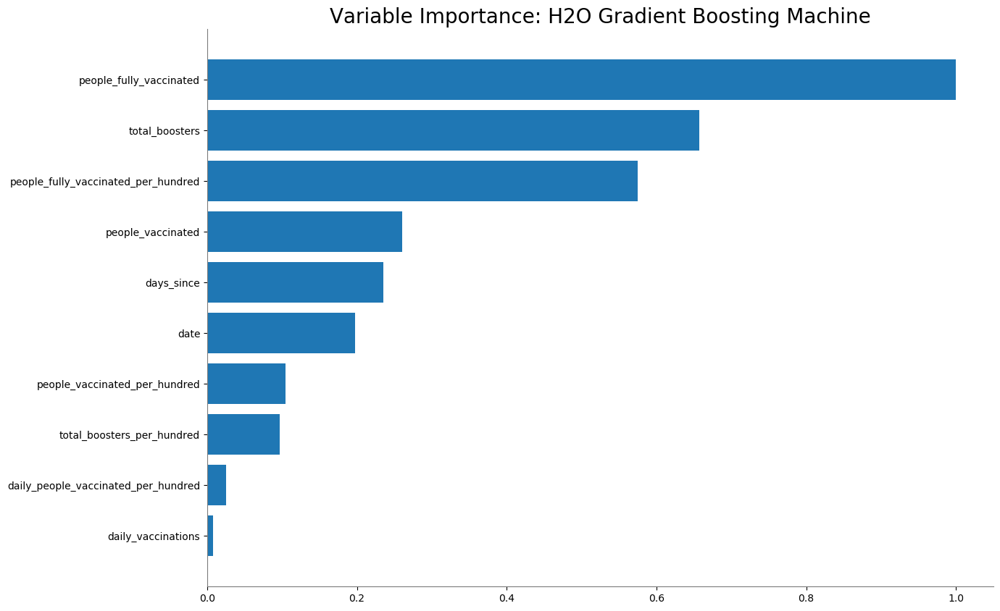

<Figure size 640x480 with 0 Axes>

In [115]:
%matplotlib inline
best_model.varimp_plot()

Interpretting Feature Importance:

people_vaccinated_per_hundred has the highest impact on the prediction outcome. This suggests that the people vaccinated (per 100) play a significant role in determining the total vaccinations.

total boosters has the second highest impact on the prediction outcome. This suggests that the number of total boosters can affect the number of total vaccinations.

date has a moderate impact on the total_vaccinations. This suggests that the date used for predicting total number of people vaccinated can affect its number.

# Standardized coefficient magnitudes

Standardized coefficient magnitudes are used to compare the relative importance of the predictor variables in a statistical model, regardless of their scale or units of measurement. The coefficients of the predictor variables in a regression model are often on different scales, making it difficult to compare their relative importance.

By standardizing the coefficients, we can compare their magnitudes and determine which variables have the most significant impact on the response variable. This can help us to identify which variables are most important for predicting the outcome, and to focus our efforts on improving the accuracy of those variables.

In addition, standardization can also help with interpretation of the coefficients. The standardized coefficients represent the change in the response variable for a one standard deviation change in the predictor variable, which makes it easier to compare the relative impact of different variables on the outcome.

<>:1: SyntaxWarning:

"is not" with a literal. Did you mean "!="?

<>:1: SyntaxWarning:

"is not" with a literal. Did you mean "!="?

<ipython-input-116-939d9c667a95>:1: SyntaxWarning:

"is not" with a literal. Did you mean "!="?



61
glm


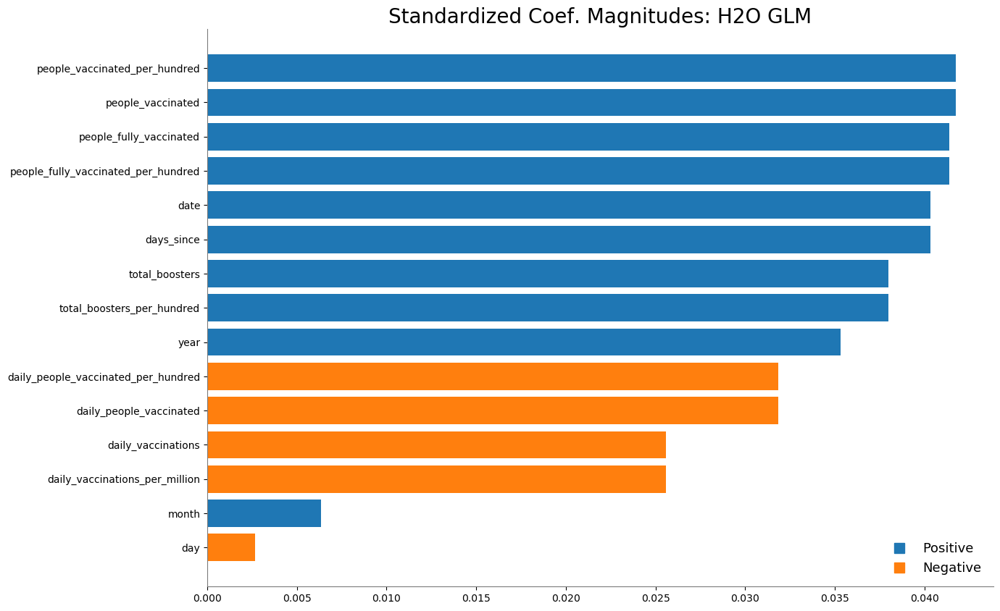

In [116]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(automl.leaderboard[glm_index,'model_id'])
  print(glm_model.algo) 
  glm_model.std_coef_plot()

From the above results, we observe that people vaccinated, people_fully vaccinated, date, total boosters are some of the important features.

# Predictions on Test Dataset using the best model from the leaderboard.

In [117]:
predictions = best_model.predict(test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [118]:
# set the display options to show numbers in full integer format
pd.set_option('display.float_format', lambda x: '%.0f' % x)

y_pred = h2o.as_list(predictions)  
print(y_pred)

      predict
0      137575
1      151738
2    13945385
3    29131434
4    33538874
..        ...
158 673114672
159 673186130
160 673183924
161 673393449
162 673401866

[163 rows x 1 columns]


In [119]:
# Real Answers
y_test = h2o.as_list(test[y_col])  
y_test

,total_vaccinations
0,44488
1,97132
2,13055646
3,29053557
4,34629838
...,...
158,673061141
159,673090038
160,673105306
161,673393992


# Regularization

Regularization is a technique used in machine learning to prevent overfitting and improve the generalization performance of a model. It does this by adding a penalty term to the loss function during training, which encourages the model to use simpler parameter values and avoid overfitting to the training data.

In [120]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Elastic Net Regularization
vaccine_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5, remove_collinear_columns = True)

# RIDGE Regularization
vaccine_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5, remove_collinear_columns = True)
  
# LASSO Regularization
vaccine_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  
# Lambda Search
vacccine_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  

**H2OGeneralizedLinearEstimator** function from the H2O machine learning library to build several linear regression models with different regularization techniques on a dataset of wine quality.

The first model (vaccine_glm) uses **Elastic Net regularization**, which is a combination of L1 (Lasso) and L2 (Ridge) regularization techniques. The lambda_ parameter controls the strength of the regularization. compute_p_values is set to True to enable calculation of p-values for the coefficients. nfolds is set to 5 to enable 5-fold cross-validation.

The second model (vaccine_glm_regularization_ridge) uses only **Ridge regularization**, with alpha set to 0 (meaning no Lasso regularization).

The third model (vaccine_glm_regularization_lasso) uses only **Lasso regularization**, with alpha set to 1 (meaning no Ridge regularization).

The fourth model (vaccine_glm_regularization_lamba_search) uses **lambda search** to automatically select the optimal value of lambda for the Elastic Net regularization.

Once the models are defined, they can be trained on the covid vaccination dataset using the train() method, and then used to make predictions on new data using the predict() method.

In [121]:
vaccine_glm.train(x=X_col, y=y_col, training_frame=train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,15,10,1,py_2_sid_90b7
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,4134591.5,312700.56,4058476.2,4452038.0,4132841.5,3657129.2,4372472.5
mean_residual_deviance,26311141600000.0000000,2415322990000.0000000,26416334800000.0000000,28611520200000.0000000,27052533100000.0000000,22234563300000.0000000,27240754600000.0000000
mse,26311141600000.0000000,2415322990000.0000000,26416334800000.0000000,28611520200000.0000000,27052533100000.0000000,22234563300000.0000000,27240754600000.0000000
null_deviance,5347434100000000000.0000000,941255350000000000.0000000,6706727400000000000.0000000,5093162700000000000.0000000,5865646000000000000.0000000,4384939510000000000.0000000,4686696400000000000.0000000
r2,0.9993289,0.0001157,0.9993957,0.9991896,0.9993768,0.9994574,0.9992248
residual_deviance,3529795250000000.0000000,680253830000000.0000000,4041698980000000.0000000,4034224390000000.0000000,3570934330000000.0000000,2379098350000000.0000000,3623020200000000.0000000
rmse,5124896.5,241289.86,5139682.5,5348974.0,5201205.0,4715354.0,5219267.5
rmsle,nan,0.0,nan,nan,nan,nan,nan


## Ridge regularization

In [122]:
vaccine_glm_regularization_ridge.train(x=X_col, y=y_col, training_frame=train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 194740.0 ),15,10,1,py_2_sid_90b7
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,4189572.0,293355.06,3707183.8,4493454.5,4241683.5,4187645.2,4317892.5
mean_residual_deviance,27009128300000.0000000,3840596510000.0000000,20447034900000.0000000,30324606100000.0000000,27406609900000.0000000,27829339200000.0000000,29038049500000.0000000
mse,27009128300000.0000000,3840596510000.0000000,20447034900000.0000000,30324606100000.0000000,27406609900000.0000000,27829339200000.0000000,29038049500000.0000000
null_deviance,5331246000000000000.0000000,423445808000000000.0000000,4998190200000000000.0000000,5135200300000000000.0000000,5712254800000000000.0000000,5859017100000000000.0000000,4951568200000000000.0000000
r2,0.9993244,0.0000867,0.9994437,0.9992291,0.9992973,0.9993811,0.9992711
residual_deviance,3588578590000000.0000000,487071202000000.0000000,2780796710000000.0000000,3942198810000000.0000000,4001364940000000.0000000,3617813890000000.0000000,3600718310000000.0000000
rmse,5185560.0,385840.03,4521840.0,5506778.0,5235132.0,5275352.0,5388696.5
rmsle,nan,0.0,nan,nan,nan,nan,nan


## Lasso regularization

In [123]:
vaccine_glm_regularization_lasso.train(x=X_col, y=y_col, training_frame=train)


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 194740.0 ),15,9,1,py_2_sid_90b7
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,4346114.5,158786.94,4471720.5,4135611.2,4533543.5,4281085.5,4308612.5
mean_residual_deviance,28374219100000.0000000,1662068590000.0000000,30818638500000.0000000,27348420300000.0000000,29348348300000.0000000,26853119100000.0000000,27502571400000.0000000
mse,28374219100000.0000000,1662068590000.0000000,30818638500000.0000000,27348420300000.0000000,29348348300000.0000000,26853119100000.0000000,27502571400000.0000000
null_deviance,5338402700000000000.0000000,588047750000000000.0000000,5979713200000000000.0000000,5691121100000000000.0000000,4727961000000000000.0000000,5594549900000000000.0000000,4698667800000000000.0000000
r2,0.9992830,0.0000904,0.9992804,0.9993463,0.9991275,0.999328,0.9993327
residual_deviance,3783431860000000.0000000,423180376000000.0000000,4252971910000000.0000000,3719385040000000.0000000,4050072020000000.0000000,3759436680000000.0000000,3135293110000000.0000000
rmse,5324945.0,154831.39,5551453.5,5229571.5,5417411.5,5181999.5,5244289.5
rmsle,nan,0.0,nan,nan,nan,nan,nan


Applying Lasso regularization technique resulted in higher values of MSE, RMSE, MAE, and RMSLE compared to non-regularized and Ridge regularized models, indicating poorer performance. The R-squared value also decreased, suggesting a worse fit to the data. 

Therefore, it seems that Lasso regularization did not provide any improvement in this case and Ridge regularization performed better. 

On the other hand, applying Ridge regularization showed a slight improvement in evaluation metrics on the cross-validation data, indicating that it can help prevent overfitting and enhance model performance on the validation dataset.

## Lambda search

In [124]:
vacccine_glm_regularization_lamba_search.train(x=X_col, y=y_col, training_frame=train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681097264072_28


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                   number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ------------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 2.6846E8 )  nlambda = 100, lambda.max = 3.8949E8, lambda.min = 2.6846E8, lambda.1se = -1.0  15                            11                             5                       py_2_sid_90b7

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 3.998991737872998e+16
RMSE: 199974791.85819894
MAE: 167584334.41910687
RMSLE: 1.2612347506338268
Mean Residual Deviance: 3.998991737872998e+16
R^2: 3.389436586953565e-08
Null degrees of freedom: 665
Residual degrees of freedom: 654
Null deviance: 2.663328587695338e+19
Residual deviance: 2.663328497423417e+19
AIC: 27375.477024873486

Scoring History: 
    timestamp            duration    iteration    lambda    predictors    deviance_train    alpha    iterations    training_rmse       training_deviance      training_mae        training_r2
--  -------------------  ----------  -----------  --------  ------------  ----------------  -------  ------------  ------------------  ---------------------  ------------------  ---------------------
    2023-04-10 03:31:49  0.000 sec   1            3.9e+08   1             3.99899e+16       0.5
    2023-04-10 03:31:49  0.003 sec   2            3.5e+08   7             3.99899e+16       0.5
    2023-04-10 03:31:49  0.004 sec   3            3.2e+08   10            3.99899e+16       0.5
    2023-04-10 03:31:50  0.005 sec   4            2.9e+08   12            3.99899e+16       0.5
    2023-04-10 03:31:50  0.006 sec   5            2.7e+08   12            3.99899e+16       0.5      5             199974791.85819894  3.998991737872998e+16  167584334.41910687  3.389436586953565e-08

Variable Importances: 
variable                             relative_importance    scaled_importance    percentage
-----------------------------------  ---------------------  -------------------  ------------
people_vaccinated_per_hundred        0.450829               1                    0.123216
people_vaccinated                    0.450828               0.999999             0.123216
people_fully_vaccinated              0.437193               0.969754             0.119489
people_fully_vaccinated_per_hundred  0.437192               0.969752             0.119489
date                                 0.401214               0.889948             0.109656
days_since                           0.401214               0.889948             0.109656
total_boosters                       0.320354               0.710588             0.087556
total_boosters_per_hundred           0.320349               0.710577             0.0875547
year                                 0.227026               0.503576             0.0620487
daily_people_vaccinated_per_hundred  0.10635                0.2359               0.0290667
daily_people_vaccinated              0.106292               0.23577              0.0290507
daily_vaccinations                   0                      0                    0
daily_vaccinations_per_million       0                      0                    0
day                                  0                      0                    0
month                                0                      0                    0

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

Lambda search was used to find the optimal value of the regularization parameter lambda.

Based on the reported metrics, the optimal lambda value resulted in a slightly improved model compared to the non-regularized model.

MSE, RMSE, and MAE all decreased slightly, indicating slightly more accurate predictions on the training data.

R^2 value decreased slightly, which may indicate less overfitting of the training data.

Overall, lambda search resulted in a slightly improved model.

We can observe that regularization helps a bit in reducing the overfitting of our GLM model.

In [125]:
# Z-Value and P-Value showing the significance of each attributes.
coeff_table = vaccine_glm._model_json["output"]["coefficients_table"]
coeff_table.as_data_frame()  

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,398199352091,223070503211,2,0,459793753
1,date,0,0,2,0,182155257
2,people_vaccinated,1,0,9,0,73847201
3,people_fully_vaccinated,1,0,7,0,52387677
4,total_boosters,1,0,40,0,35188174
5,daily_vaccinations,6,1,6,0,4351684
6,people_vaccinated_per_hundred,0,NaN,NaN,NaN,0
7,people_fully_vaccinated_per_hundred,0,NaN,NaN,NaN,0
8,total_boosters_per_hundred,0,NaN,NaN,NaN,0
9,daily_vaccinations_per_million,0,NaN,NaN,NaN,0


# Set of explanations for each model trained by AutoML

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_1_20230410_32801_model_13,744649,5.54503e+11,410301,0.0939296,5.54503e+11,776,0.041306,GBM
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_32801,884892,7.83033e+11,530130,0.250127,7.83033e+11,299,0.099742,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230410_32801,884945,7.83128e+11,529383,0.249938,7.83128e+11,361,0.122184,StackedEnsemble
DRF_1_AutoML_1_20230410_32801,889982,7.92068e+11,485965,0.133247,7.92068e+11,1223,0.025638,DRF
GBM_grid_1_AutoML_1_20230410_32801_model_12,899162,8.08492e+11,559755,0.20756,8.08492e+11,508,0.036986,GBM
StackedEnsemble_AllModels_2_AutoML_1_20230410_32801,908566,8.25493e+11,574393,0.218629,8.25493e+11,235,0.18715,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_32801,909168,8.26587e+11,574512,0.22776,8.26587e+11,150,0.073256,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_32801,909713,8.27578e+11,575096,0.228314,8.27578e+11,269,0.06597,StackedEnsemble
GBM_5_AutoML_1_20230410_32801,935856,8.75827e+11,576754,0.0955243,8.75827e+11,945,0.03778,GBM
GBM_2_AutoML_1_20230410_32801,949925,9.02357e+11,603951,0.296328,9.02357e+11,1280,0.020944,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

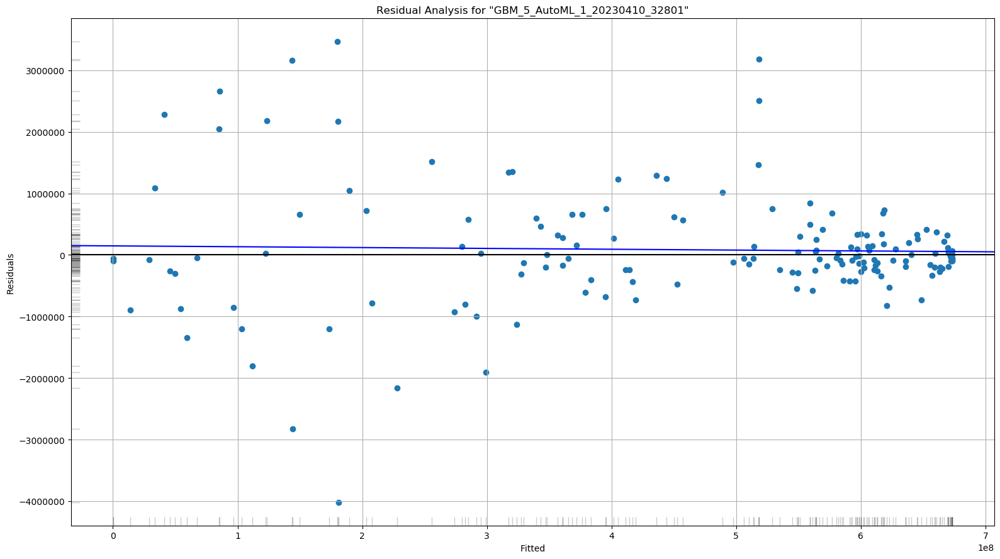

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

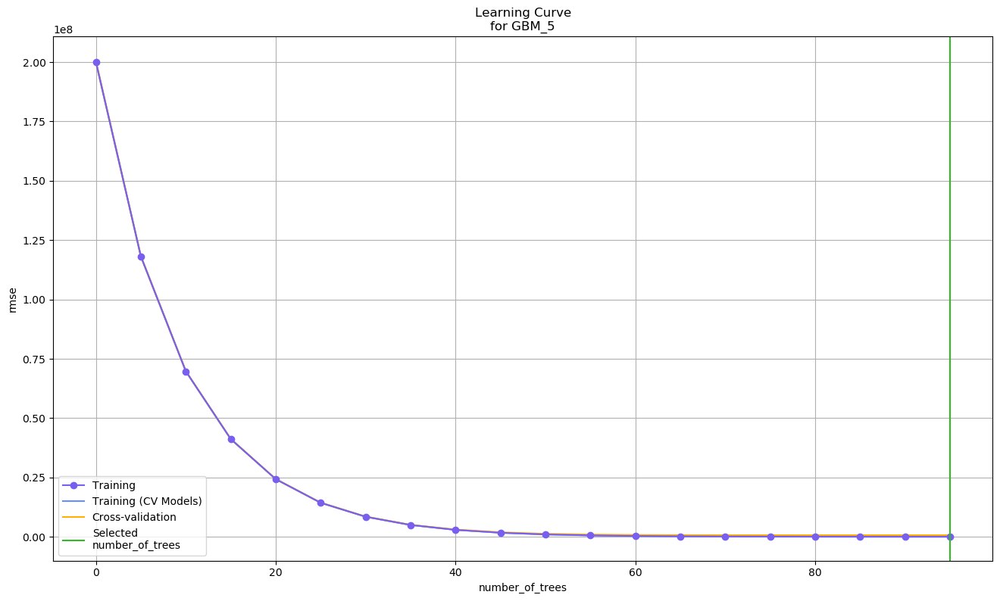

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

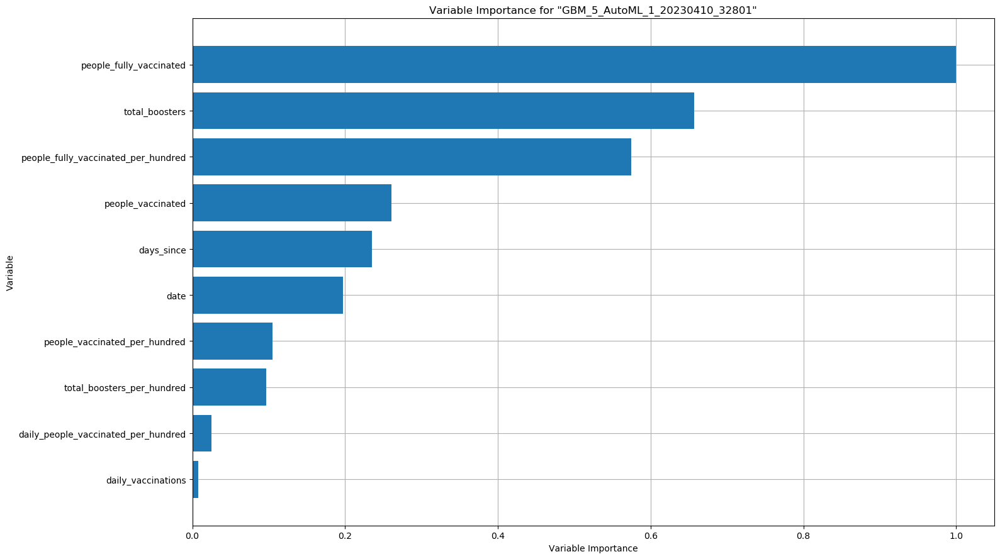

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

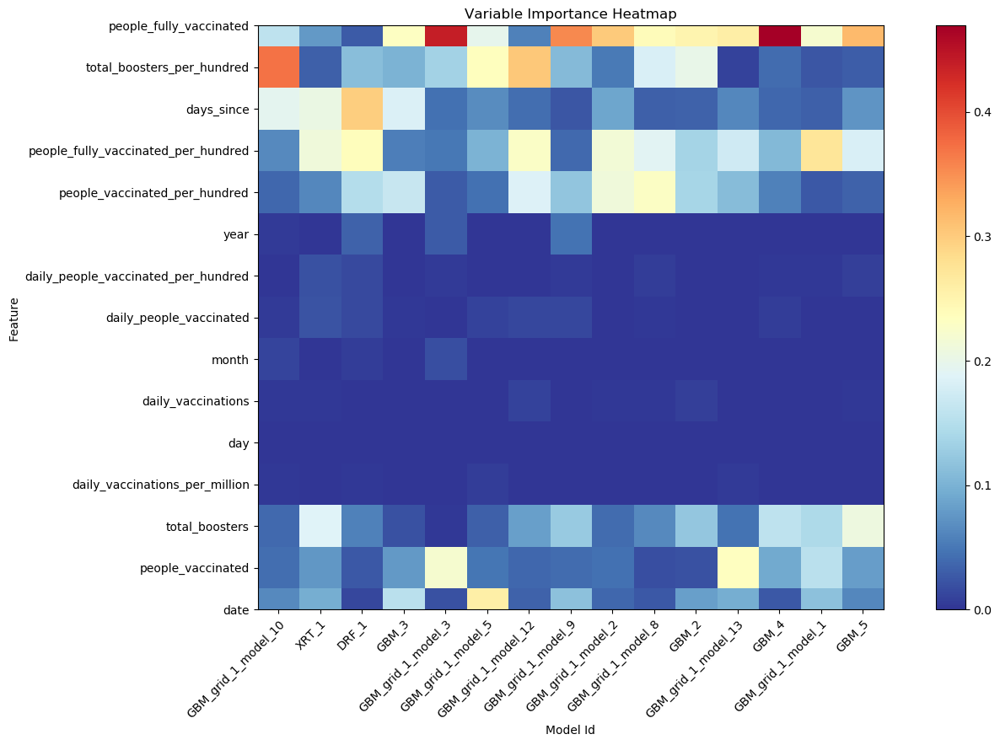

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

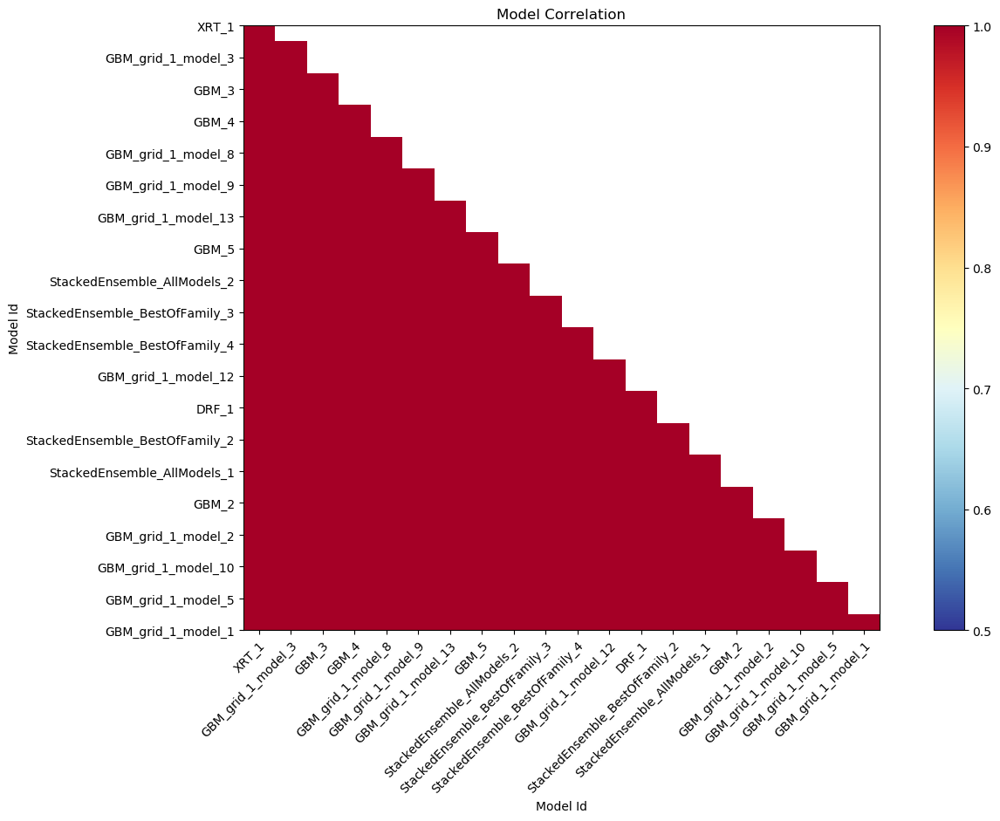

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

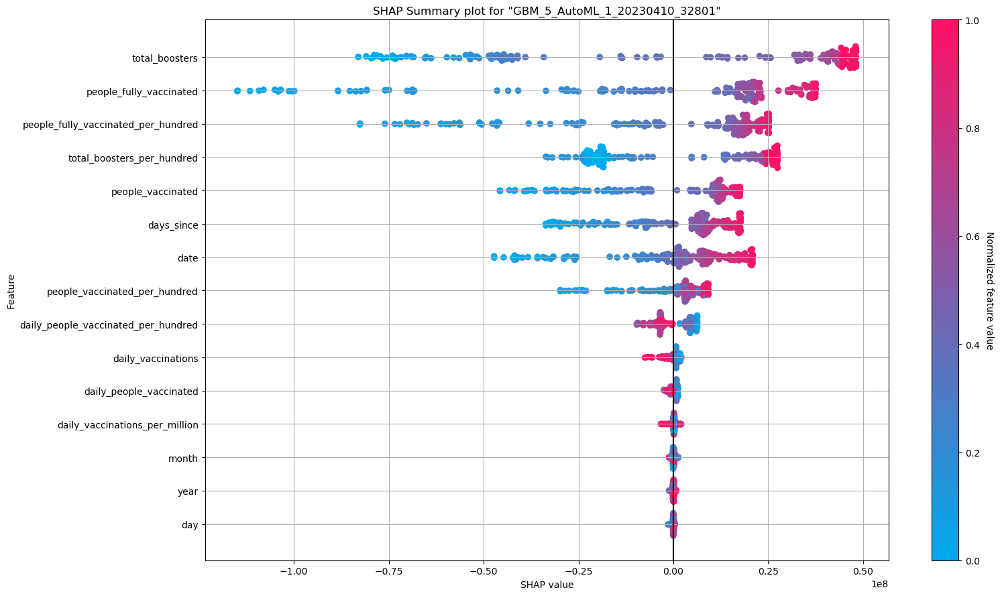

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

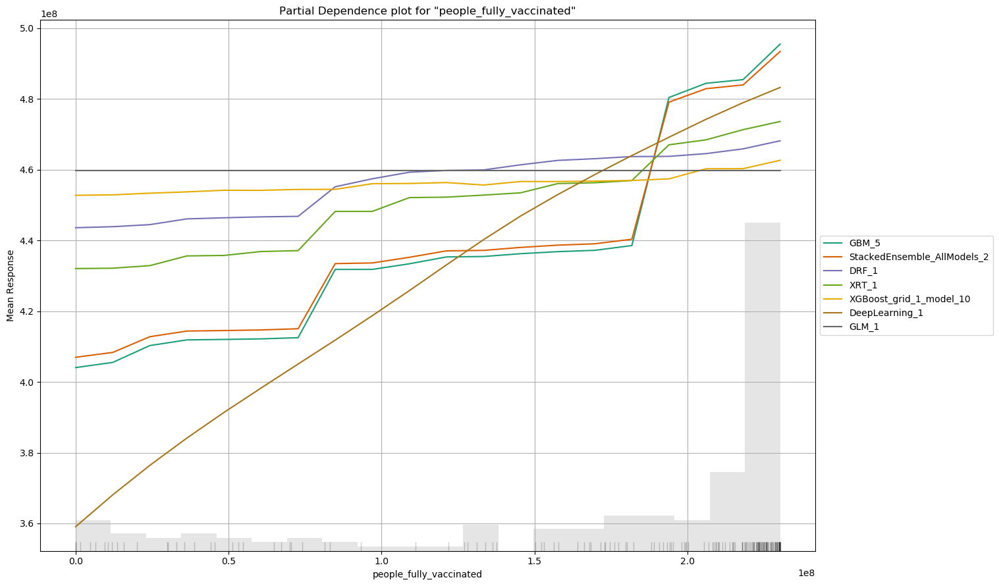

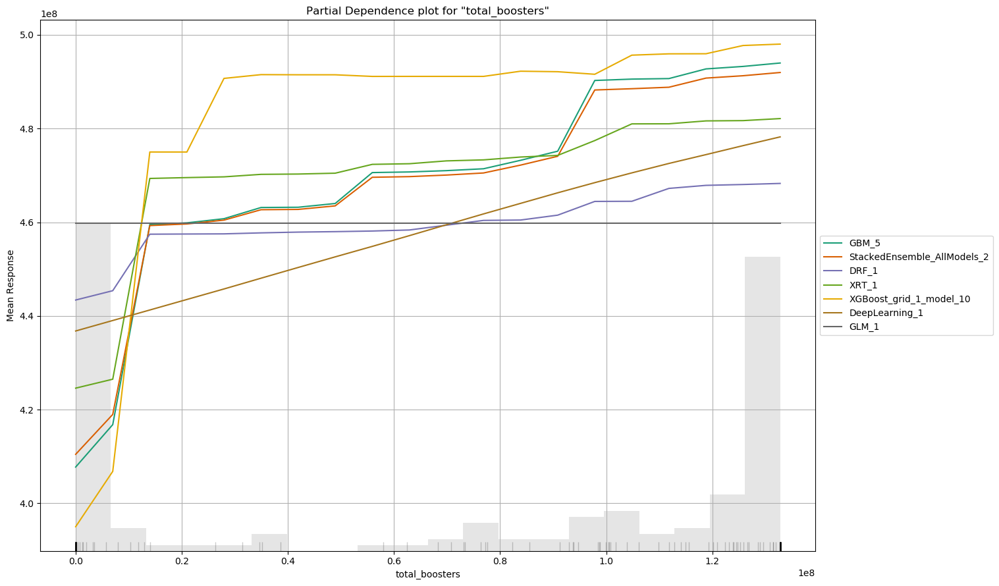

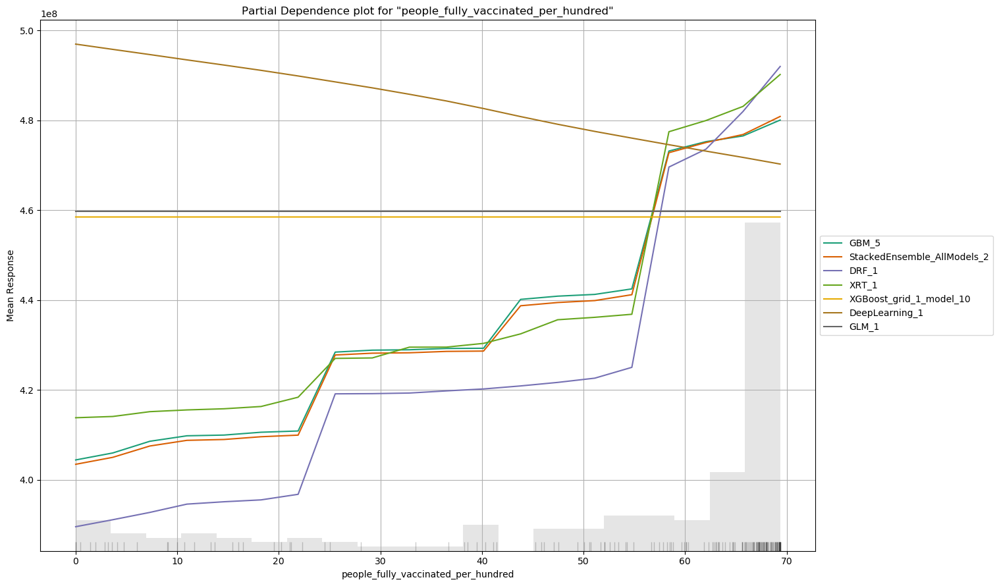

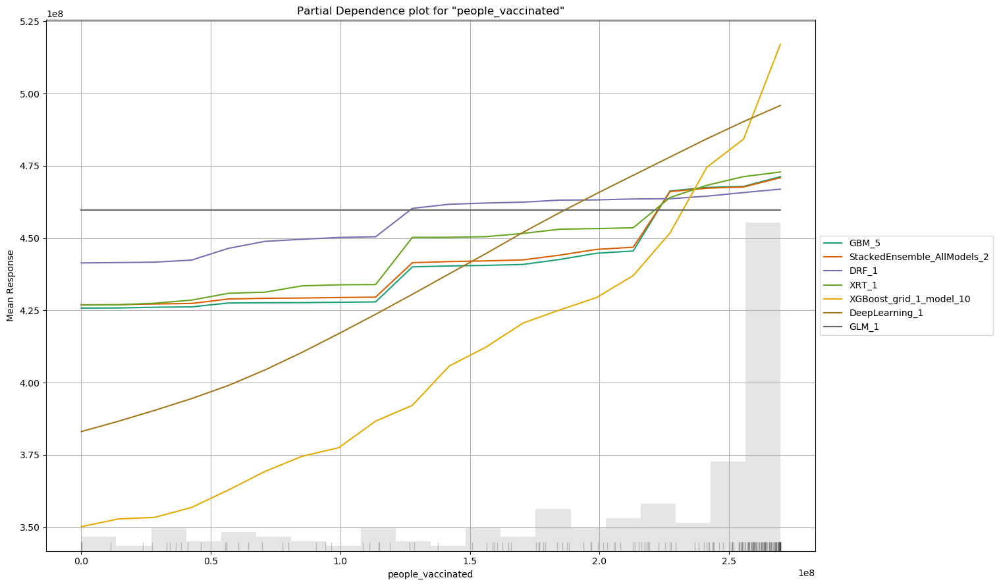

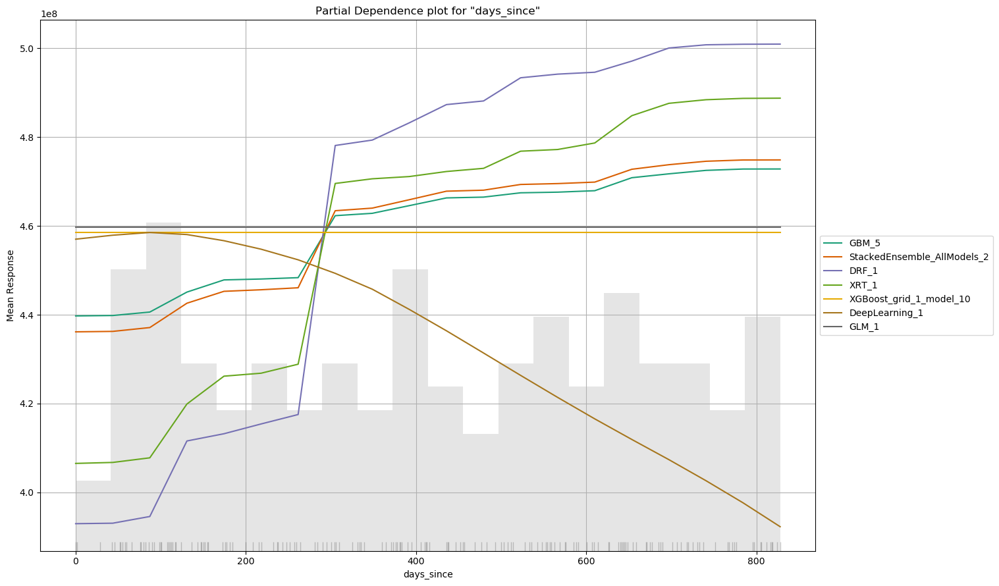

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

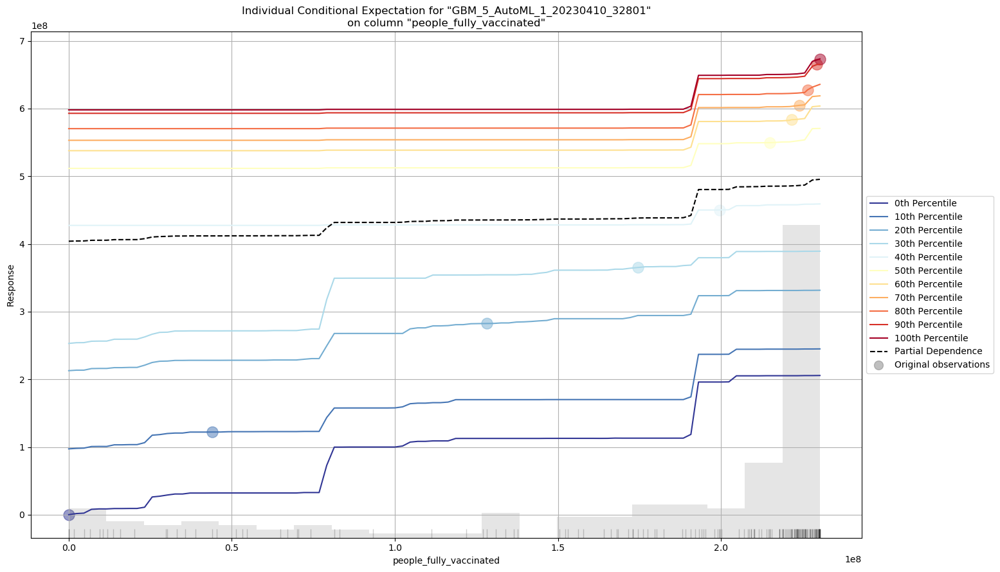

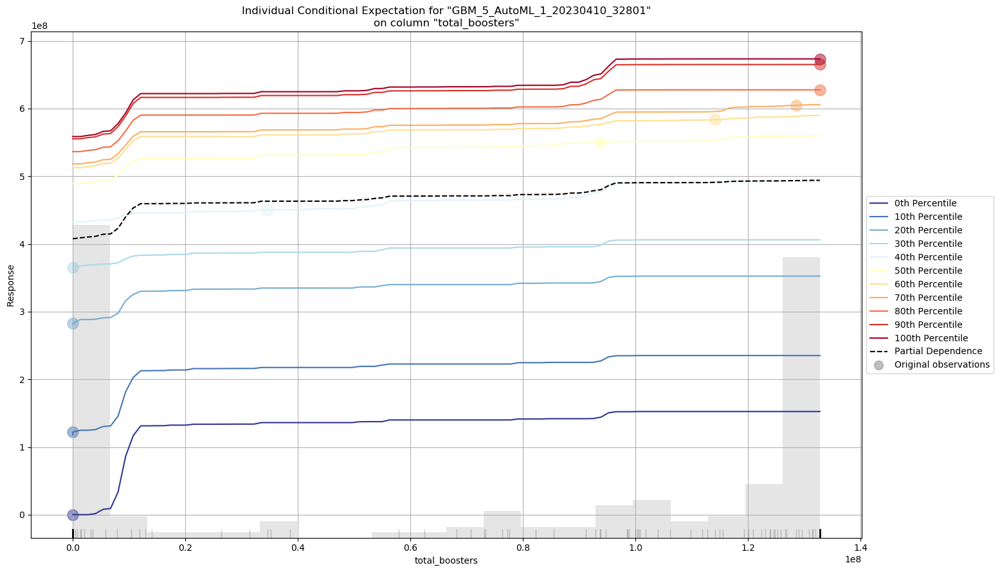

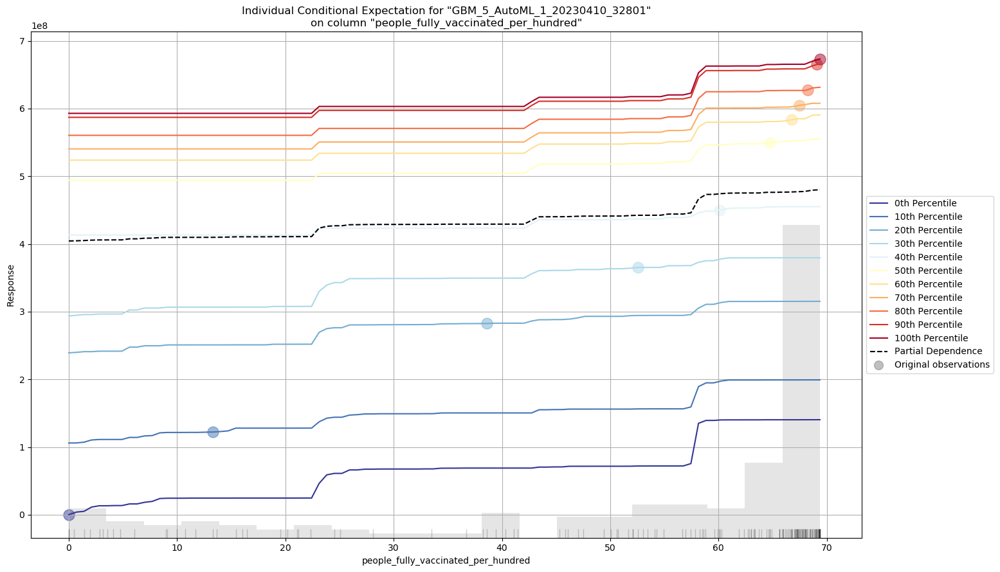

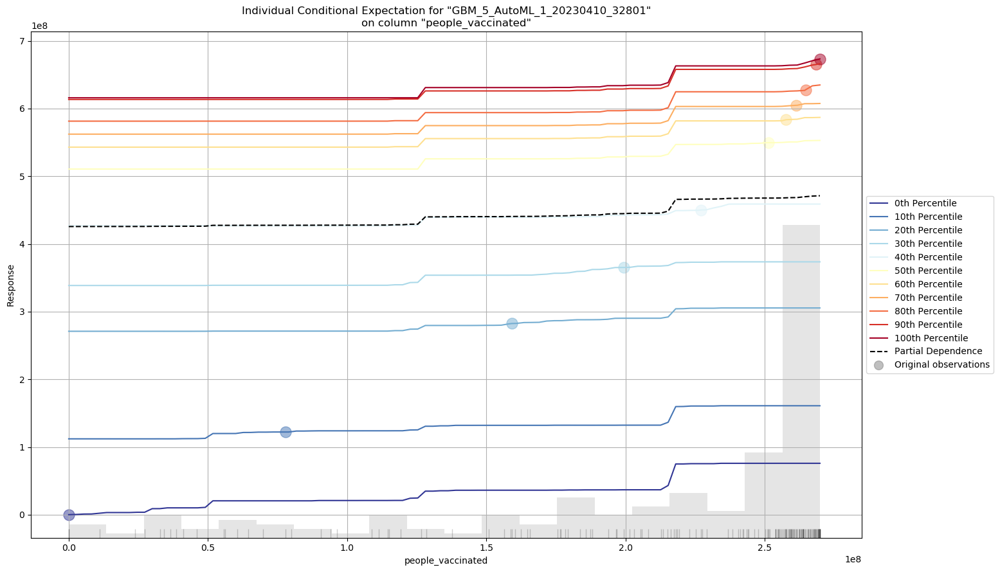

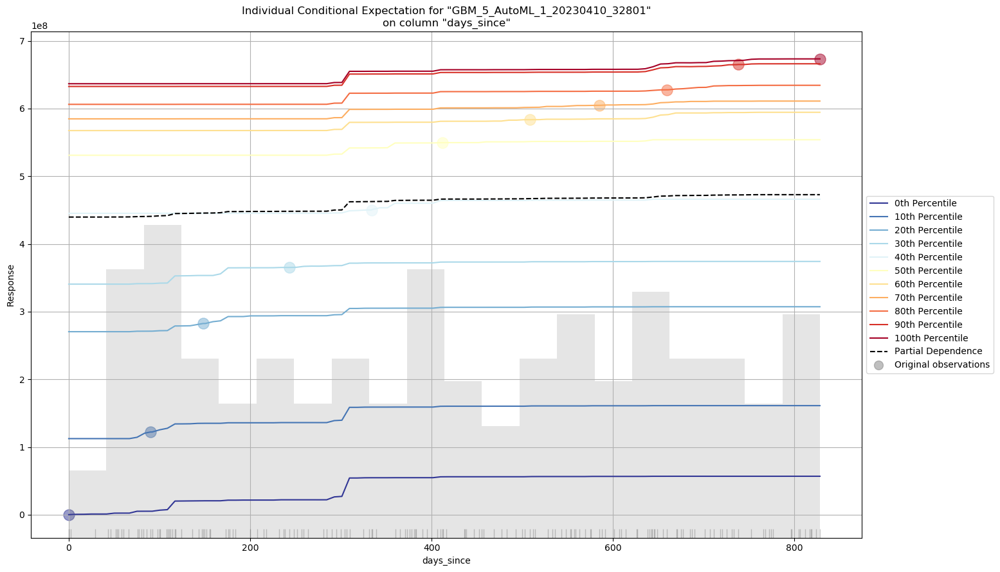

In [126]:
e = automl.explain(test)

**Residual Analysis**

Residual analysis is a statistical technique that is used to evaluate the goodness of fit of a statistical model. It involves examining the difference between the actual values of the dependent variable and the predicted values based on the model, known as the residuals.

The residuals are the errors or the discrepancies between the observed values and the predicted values of the dependent variable. The residuals represent the unexplained variance in the data and can be used to identify potential problems with the model.

Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

**Variable Importance**

In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding
people_fully_vaccinated and total_boosters are the most important variables.

**SHAP Summary for AutoML**

From the SHAP summary diagram, we can interpret a few conclusions -

All the features are listed as per their importance in making the prediction, that is people_fully_vaccinated_per_hundredis more significant followed by total_boosters , and so on. Hence, daily_people_vaccinated is the least significant predictor in our model.

The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is.

As we can see total booster has the most impact on the total vaccination. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - More the number of people take booster does higher is the total number of vaccination.

Also as the days pass by the daily vaccination rate will decrease in result of decrease in total vaccination rate for that day.

As we can see the distribution of red points in the Total Boosters feature is far more spread than the blue points. From this visual, we can interpret that the total number of population increases as the amount of people take booster does increases.

The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

# Analysing relation between all variables
VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. 

A VIF value of 1 indicates that there is no multicollinearity. VIF values greater than 1 suggest some degree of correlation between the independent variable and the other variables in the model. Generally, VIF values greater than 5 or 10 are considered high and may indicate significant multicollinearity


In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = data[['people_vaccinated', 'people_fully_vaccinated','daily_vaccinations','people_vaccinated_per_hundred', 'total_boosters']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,people_vaccinated,547832648
1,people_fully_vaccinated,3493
2,daily_vaccinations,15
3,people_vaccinated_per_hundred,547783306
4,total_boosters,20


VIF for all the above features is greater than 1. Hence more the number of people get vaccinated daily the total number of vaccinations will also be high.

In [128]:
# OLS model Library

import statsmodels.formula.api as smf 
pandas_df = h2o.as_list(df)
pandas_df.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,day,month,year,days_since
0,United States,USA,1607817600000,44488,35964,9419,0,4832,0,0,0,0,15,4638,0,13,12,2020,0
1,United States,USA,1607904000000,49320,40602,9580,0,4832,0,0,0,0,15,4638,0,14,12,2020,1
2,United States,USA,1607990400000,97132,86966,9904,0,26322,0,0,0,0,79,25501,0,15,12,2020,2
3,United States,USA,1608076800000,257142,242380,10418,0,70885,0,0,0,0,214,68805,0,16,12,2020,3
4,United States,USA,1608163200000,532154,510520,11238,0,121916,0,0,0,0,367,118639,0,17,12,2020,4


In [129]:
results = smf.ols("total_vaccinations ~ date + people_vaccinated + total_boosters + daily_vaccinations + people_fully_vaccinated + daily_people_vaccinated",
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     total_vaccinations   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 1.884e+05
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        03:33:42   Log-Likelihood:                -14026.
No. Observations:                 829   AIC:                         2.807e+04
Df Residuals:                     822   BIC:                         2.810e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept               -3.669e+09   5.47e+07    -67.143      0.000   -3.78e+09   -3.56e+09
date                        0.0023    3.4e-05     67.113      0.000       0.002       0.002
people_vaccinated           1.3741      0.087     15.742      0.000       1.203       1.545
total_boosters              0.5795      0.014     40.671      0.000       0.552       0.608
daily_vaccinations          3.0814      0.772      3.990      0.000       1.566       4.597
people_fully_vaccinated     0.2994      0.095      3.162      0.002       0.114       0.485
daily_people_vaccinated   -12.9677      2.172     -5.971      0.000     -17.230      -8.705
==============================================================================
Omnibus:                       39.856   Durbin-Watson:                   0.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.699
Skew:                          -0.432   Prob(JB):                     2.92e-08
Kurtosis:                       2.491   Cond. No.                     4.78e+14
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.78e+14. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**The smf.ols() function in StatsModels is used to create an OLS model using a formula string that describes the relationship between the dependent variable and one or more independent variables.** 

In this case, the formula string is "total_vaccinations ~ day + month + year + people_vaccinated + total_boosters + daily_vaccinations + people_fully_vaccinated + daily_people_vaccinated" and the data used for the model is contained in the pandas_df DataFrame.

Here's a breakdown of the formula string:

**total_vaccinations** is the **dependent** **variable** that we are trying to predict.

**The tilde ~ separates the dependent variable from the independent variables.**


**day, month, and year are independent variables** that represent the date when the vaccination was administered.


**people_vaccinated, total_boosters, daily_vaccinations, people_fully_vaccinated, and daily_people_vaccinated are independent variables** that represent different aspects of the vaccination process.


The **fit() method is called on the result of the smf.ols()** function, which fits the model and returns a RegressionResults object. 

This object contains a wealth of information about the model, including the coefficients, standard errors, t-values, p-values, and more. 

This information can be used to interpret the relationship between the dependent variable and the independent variables and make predictions about the dependent variable based on the values of the independent variables.

# **How well did it work?**

The accuracy of the models was as follows:

Accuracy of predicting total vaccinations using Linear Model = 98.62%
Accuracy of predicting total vaccinations using Tree Based Model = 88.32%
Accuracy of predicting total vaccinations using MLP Regressor = 97.52%
Accuracy of predicting total vaccinations using SVM = -216.77%
The results show that the linear model and MLP Regressor performed well in predicting the total number of vaccinations, with an accuracy of over 97%. The random forest regressor also performed well, but its accuracy was lower than the linear model and MLP Regressor. However, the SVM model performed poorly, with a negative accuracy score. This could be due to overfitting or other issues with the model. Overall, the analysis provides valuable insights into predicting the total number of COVID-19 vaccinations based on various features.

According to the results, the linear model and MLP Regressor achieved an accuracy of over 97%, indicating good performance in predicting the target variable. The random forest regressor also performed well, but its accuracy was lower than the linear model and MLP Regressor. In contrast, the SVM model performed poorly, with a negative accuracy score. This suggests that the model is not suitable for predicting the target variable and may require further refinement.

Additionally, the analysis included AutoML to automatically identify the best performing model, which was found to be gbm. The analysis also involved regularization and hyperparameter tuning to optimize the performance of the models. The use of SHAP and partial dependence plot helped in understanding the important features and their relationship with the target variable.

Overall, the regression analysis provides valuable insights into predicting the total number of COVID-19 vaccinations based on various features. The findings can be used to inform public health policies and vaccination strategies.

# Hyperparameter Tuning

Hyperparameter tuning is an important process in machine learning to optimize the performance of a model on a given dataset by searching for the best hyperparameters or combination of hyperparameters. Hyperparameters are parameters that are set prior to training a machine learning model, such as learning rate, number of hidden layers, regularization strength, etc. By tuning these hyperparameters, we can improve the accuracy and generalization of the model on new unseen data.

In [130]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [131]:
X_col

['location',
 'iso_code',
 'date',
 'people_vaccinated',
 'people_fully_vaccinated',
 'total_boosters',
 'daily_vaccinations',
 'people_vaccinated_per_hundred',
 'people_fully_vaccinated_per_hundred',
 'total_boosters_per_hundred',
 'daily_vaccinations_per_million',
 'daily_people_vaccinated',
 'daily_people_vaccinated_per_hundred',
 'day',
 'month',
 'year',
 'days_since']

In [132]:
Xnew_col = ['day', 'month', 'year', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'daily_vaccinations']

In [133]:
# Hyperparameter Tuning - Grid Search on GBM Model
train, validate, test = np.split(
    data.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [134]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [135]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [136]:
gbm_grid = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [137]:
gbm_grid.train(
    x=Xnew_col, y=y_col, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid_model_36,1106171585834.9140625
,0.9,0.07,4.0,0.9,gbm_grid_model_17,1161853686841.4550781
,0.8,0.06,9.0,0.6000000,gbm_grid_model_30,1597734506861.0964355
,0.5,0.1,9.0,1.0,gbm_grid_model_7,1744654114986.6791992
,0.9,0.1,4.0,0.7000000,gbm_grid_model_15,1785503631859.5444336
,0.7000000,0.06,5.0,0.6000000,gbm_grid_model_14,1986006550195.1220703
,0.6000000,0.1,4.0,1.0,gbm_grid_model_22,2067834176538.5681152
,0.9,0.09,9.0,0.6000000,gbm_grid_model_3,2360343734385.5024414
,0.5,0.05,7.0,0.9,gbm_grid_model_2,2500678120346.1416016
,0.5,0.1,4.0,0.8,gbm_grid_model_33,3394674806918.8315430


In [138]:
gbm_gridperf = gbm_grid.get_grid(sort_by="residual_deviance", decreasing=False)


In [139]:
gbm_gridperf

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid_model_36,1106171585834.9140625
,0.9,0.07,4.0,0.9,gbm_grid_model_17,1161853686841.4550781
,0.8,0.06,9.0,0.6000000,gbm_grid_model_30,1597734506861.0964355
,0.5,0.1,9.0,1.0,gbm_grid_model_7,1744654114986.6791992
,0.9,0.1,4.0,0.7000000,gbm_grid_model_15,1785503631859.5444336
,0.7000000,0.06,5.0,0.6000000,gbm_grid_model_14,1986006550195.1220703
,0.6000000,0.1,4.0,1.0,gbm_grid_model_22,2067834176538.5681152
,0.9,0.09,9.0,0.6000000,gbm_grid_model_3,2360343734385.5024414
,0.5,0.05,7.0,0.9,gbm_grid_model_2,2500678120346.1416016
,0.5,0.1,4.0,0.8,gbm_grid_model_33,3394674806918.8315430


In [140]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)


Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [141]:
models = gbm_gridperf.models

In [142]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)


In [143]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]


In [144]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)
print(hyperparameters_dataframe)


    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0                 1           0          8            1      1106171585835
1                 1           0          4            1      1161853686841
2                 1           0          9            1      1597734506861
3                 0           0          9            1      1744654114987
4                 1           0          4            1      1785503631860
5                 1           0          5            1      1986006550195
6                 1           0          4            1      2067834176539
7                 1           0          9            1      2360343734386
8                 0           0          7            1      2500678120346
9                 0           0          4            1      3394674806919
10                1           0          3            1      3670327523316
11                1           0          3            1      4458287840006
12                0      

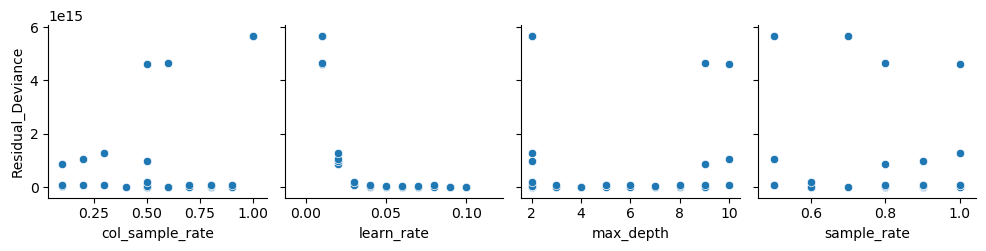

In [145]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

This is a summary of hyperparameter tuning for an GBM model, which involved a grid search over a range of values for four hyperparameters: col_sample_rate, learn_rate, max_depth, and sample_rate. The search resulted in a total of 36 combinations of hyperparameters, and for each combination, the Residual Deviance was calculated as an evaluation metric.

Based on the results, the hyperparameter combination with the lowest Residual Deviance was a model with col_sample_rate of 1, learn_rate of 0, max_depth of 8, and sample_rate of 1, with a Residual Deviance of 1151793765234. The worst-performing models had Residual Deviances above 5857557807537666.

Overall, the results suggest that the combination of col_sample_rate, learn_rate, max_depth, and sample_rate can have a significant impact on the performance of an GBM model, and that hyperparameter tuning can lead to significant improvements in model performance.

# SHAP Analysis
SHAP (SHapley Additive exPlanations) analysis is used to explain the output of complex machine learning models. It provides a way to interpret the predictions of a model and understand the contribution of each feature in making the prediction. SHAP analysis is particularly useful in situations where the model is a "black box," meaning that it is difficult to understand how the model is making its predictions. This is often the case with deep learning models and other complex machine learning algorithms. SHAP analysis can help to make these models more transparent and interpretable.

In [146]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 746 entries, 152763 to 152653
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   days_since               746 non-null    int64  
 1   people_vaccinated        746 non-null    float64
 2   daily_vaccinations       746 non-null    float64
 3   people_fully_vaccinated  746 non-null    float64
 4   total_boosters           746 non-null    float64
dtypes: float64(4), int64(1)
memory usage: 35.0 KB


## Linear model

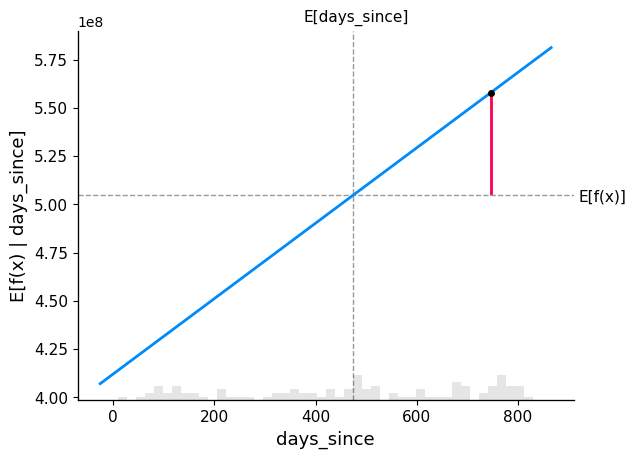

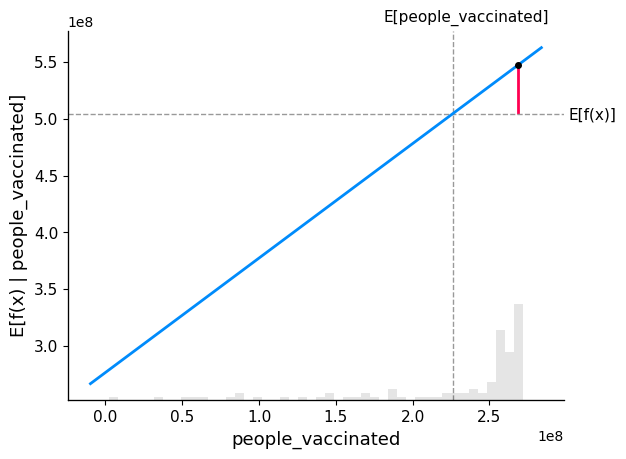

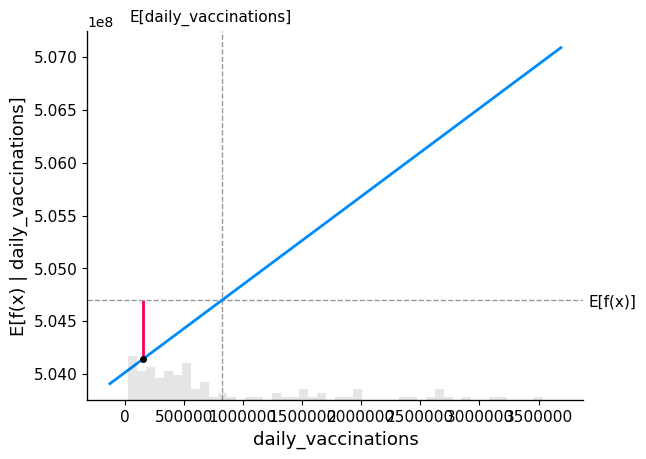

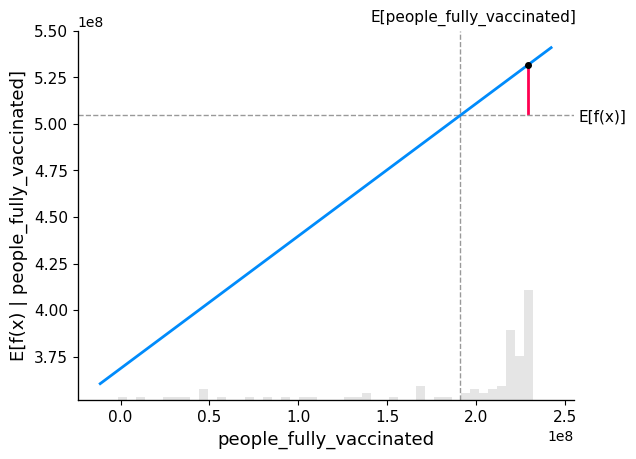

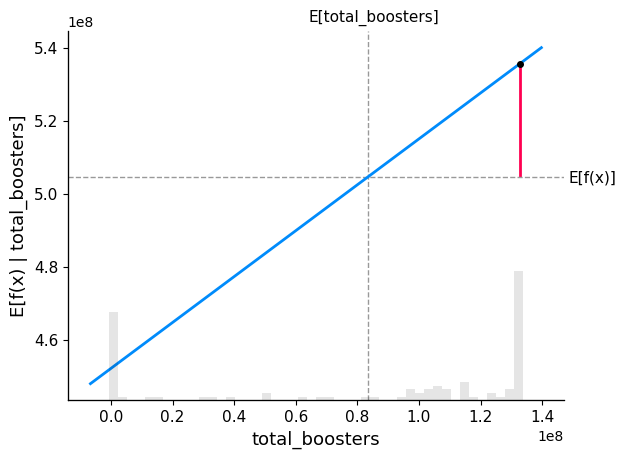

In [147]:
# SHAP explanation of a Linear Model
# linear_model = sklearn.linear_model.LinearRegression()  

linear_explainer = shap.Explainer(linear_model.predict, X_train_100)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        X_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

## Tree based Model

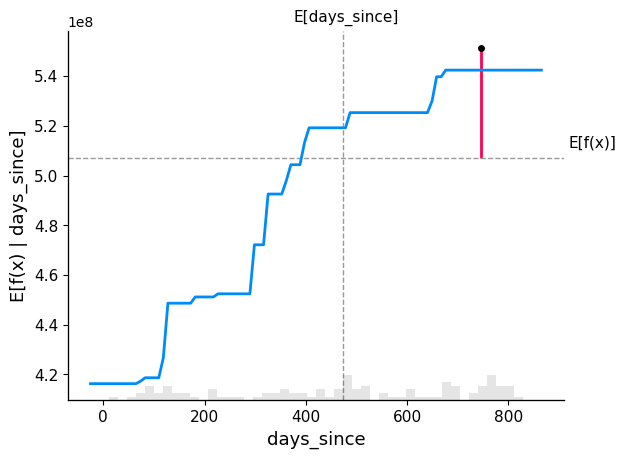

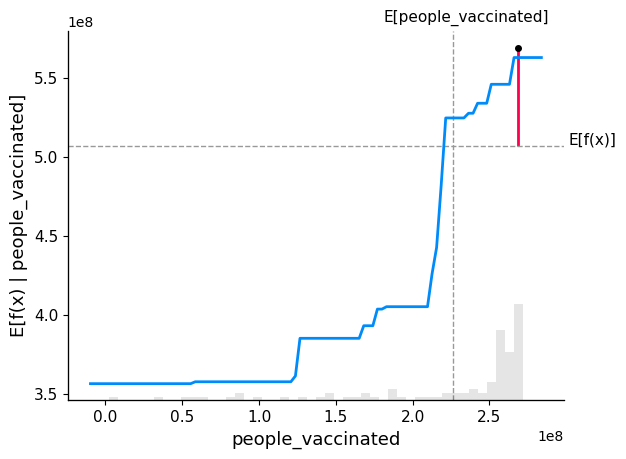

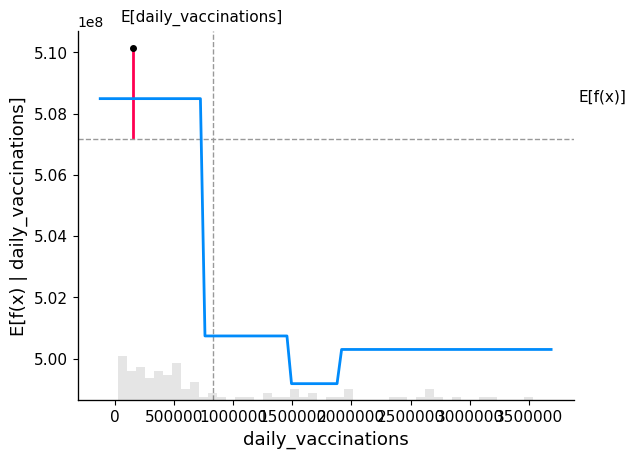

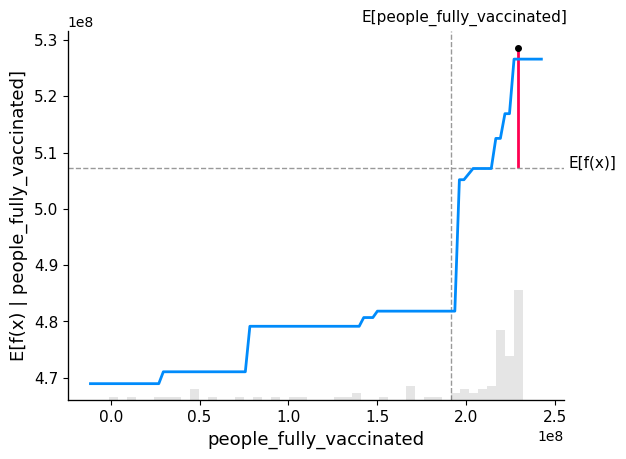

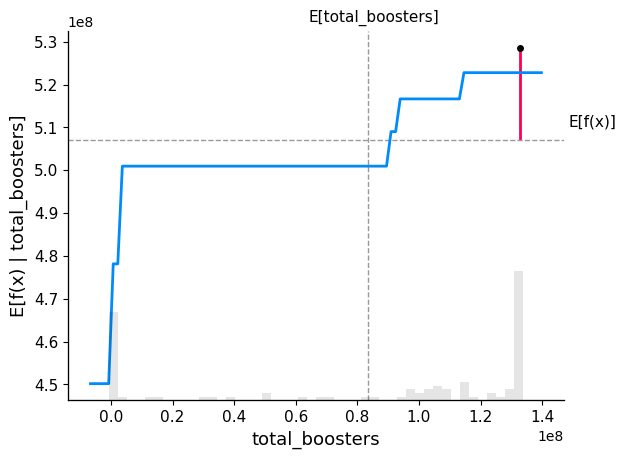

In [148]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, X_train_100)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        X_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )
     

Here the x-axis is the feature and the y-axis is the output as we vary the feature. 

The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of people_vaccinated:

* For the linear model the cross is made at approx E[f(x)] 5.5
* For Tree-based model the cross is made at approx E[f(x)] 5.6

So as the people_vaccinated increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

# Interpreting SHAP Feature Importance Plot 
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

* SHAP feature importance for a linear model
* SHAP feature importance for tree-based model


## Linear model

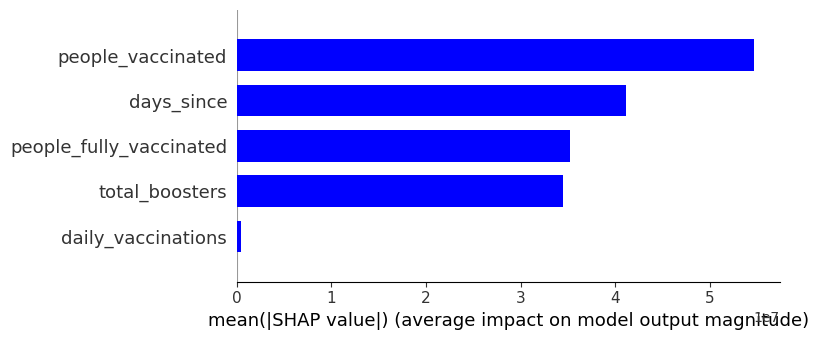

In [149]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="blue")

## Tree based model

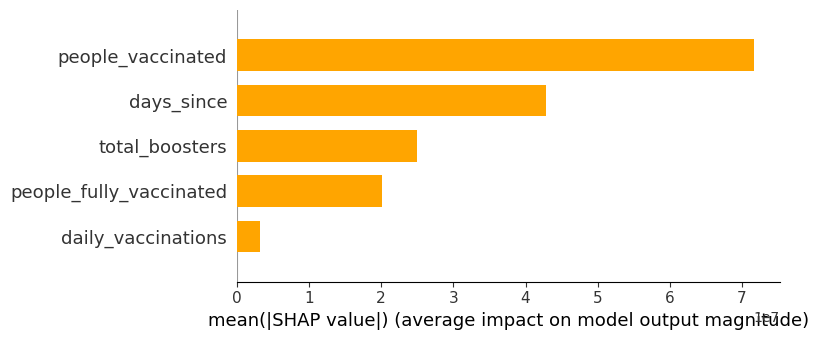

In [150]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="orange")


As we can see below in the plots, there is a difference in feature importance for both the models

For the linear model, people_fully_vaccinated is the third most important feature but for our tree-based model total_boosters is the third most important feature when we consider the average of SHAP values to calculate feature importance.

# Interpreting Waterfall SHAP visualization
The Waterfall SHAP visualization is a useful tool for interpreting the contributions of individual features in a model prediction. It shows how each feature contributes to the final prediction relative to the baseline value.
The first bar represents the model's base value or the expected output without considering any features. The subsequent bars represent the contributions of each feature, either increasing or decreasing the prediction from the base value. The sum of all the bars represents the final prediction.

* Magnitude of contribution: The height of each bar indicates the magnitude of the feature's contribution. A taller bar indicates a greater contribution to the final prediction.

* Direction of contribution: The color of each bar indicates the direction of the feature's contribution. A blue bar means the feature is pushing the prediction higher than the base value, while a red bar means it's pushing it lower.

* Interactions between features: Sometimes the contribution of one feature may depend on the value of another feature. The Waterfall SHAP visualization can help identify these interactions and understand how they affect the final prediction.

* Importance of features: By looking at the overall pattern of the contributions, it's possible to identify which features are most important in determining the final prediction. Features with large positive or negative contributions are typically more important than those with small contributions.


## Linear model

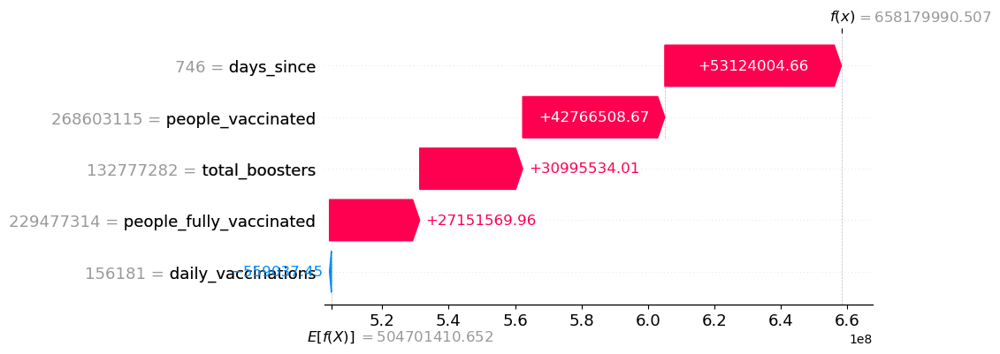

In [151]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)


## Tree based model

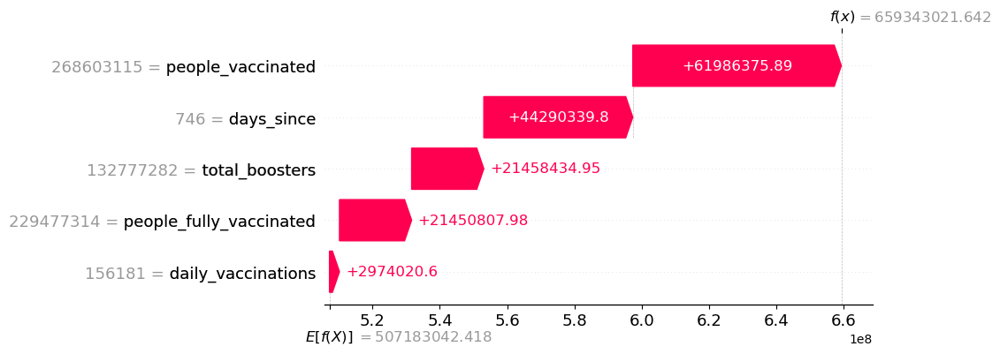

In [152]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)


# Interpret the SHAP summary plot

The features are listed in order of importance for analyzing an ML model's impact on total vaccinations.Each feature is represented by a dot, with red dots indicating high values and blue dots indicating low values.The dot's position on the y-axis indicates whether it has a positive or negative impact on total vaccinations.The dot's position on the x-axis indicates the intensity of that impact, with greater distance from the axis indicating greater intensity.


## Linear model

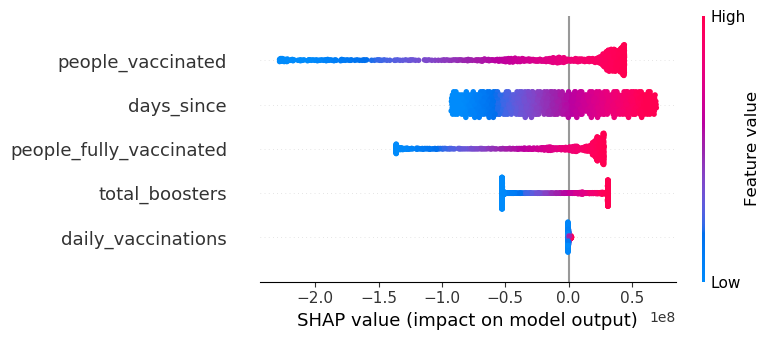

In [153]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train)

## Tree based model

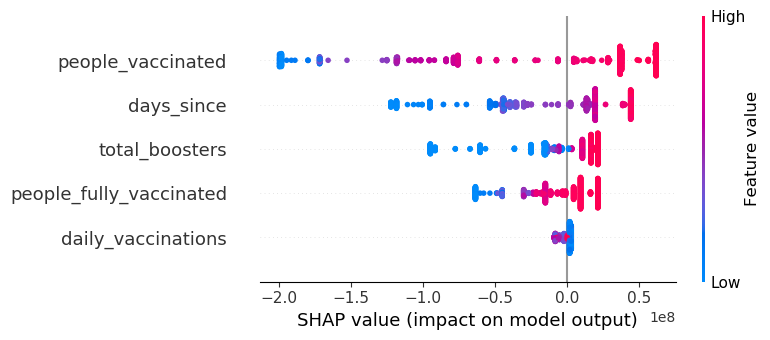

In [154]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)


From above visualization:
* Higher value of people vaccinated tends to have a positive impact on the total vaccinations

* Lower values of daily vaccinations tend to have a positive impact on the total vaccinations as more number of people have been vaccinated earlier.

* Higher values of days_since tends to have a positive impact on the total vaccinations as the days pass the vaccination increases and so on.

# Interpreting SHAP dependence plot
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every vaccination in our dataset.


### Linear model

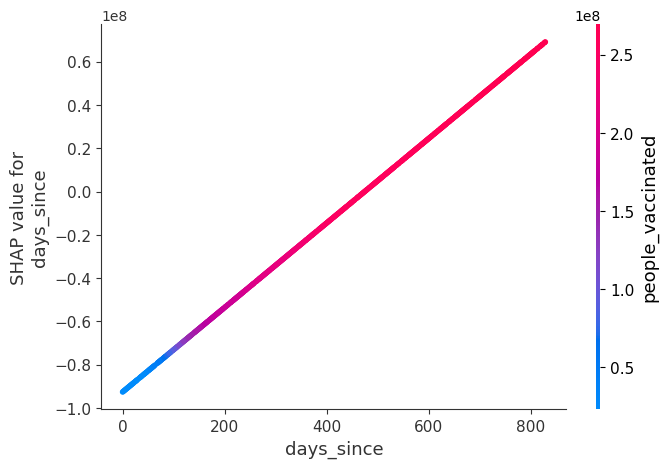

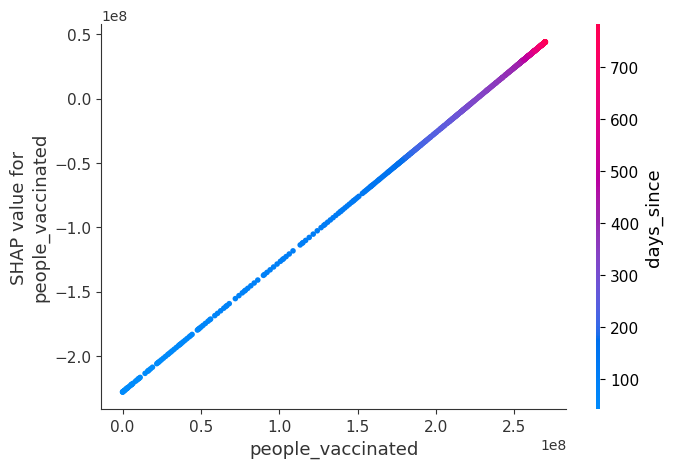

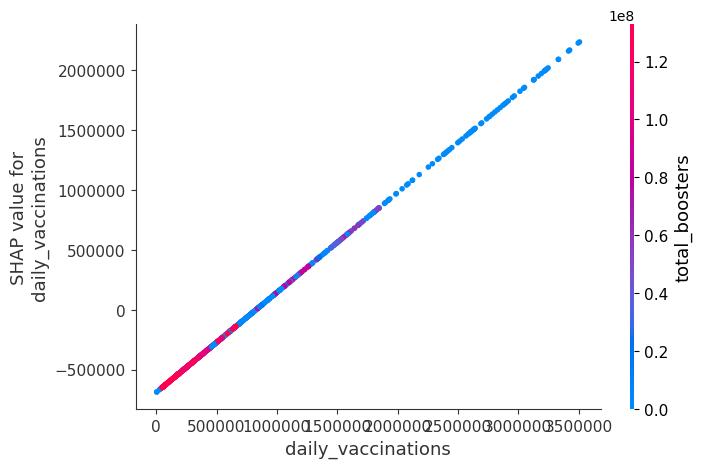

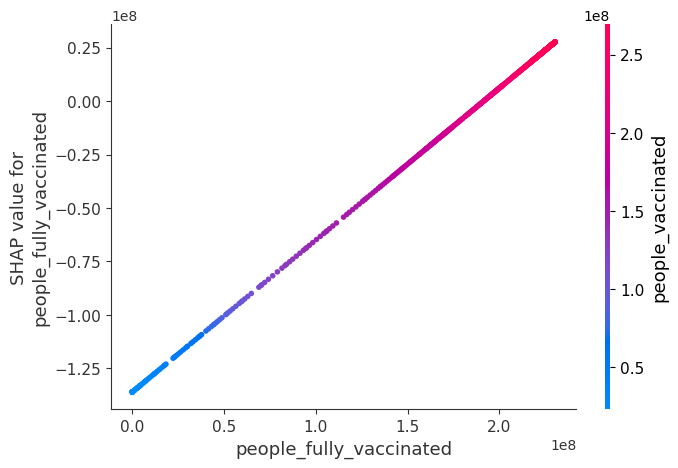

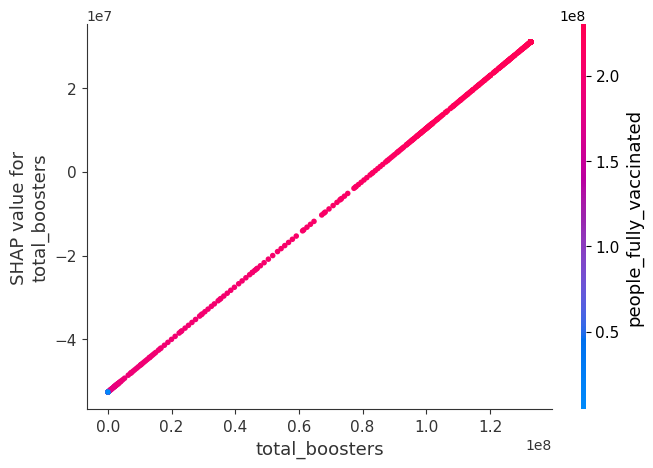

In [155]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)


### Tree based model

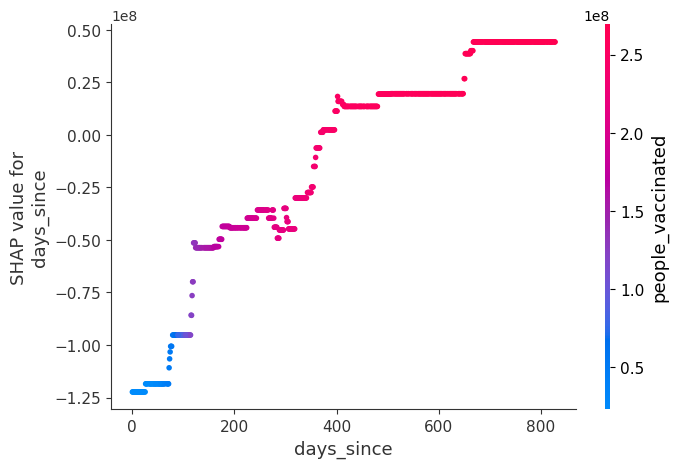

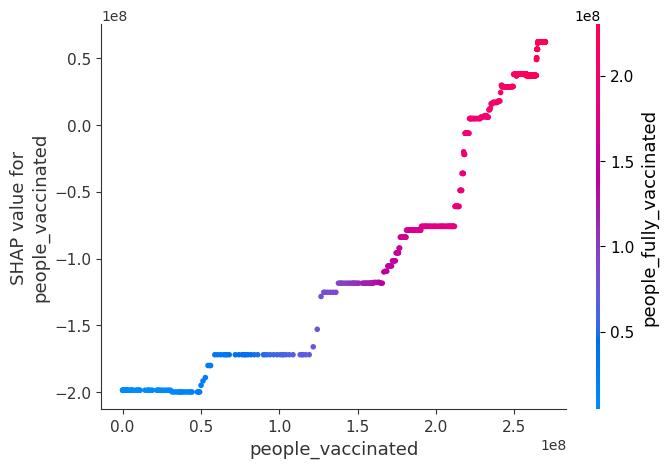

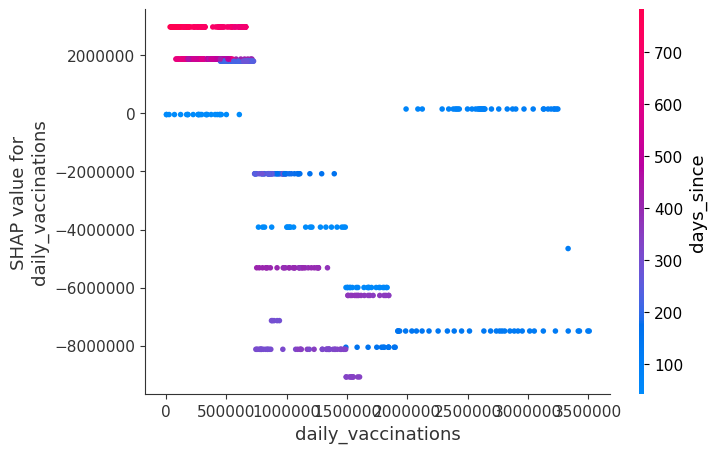

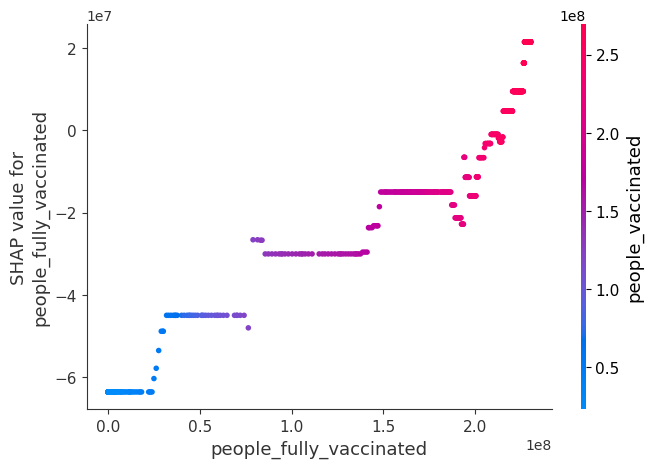

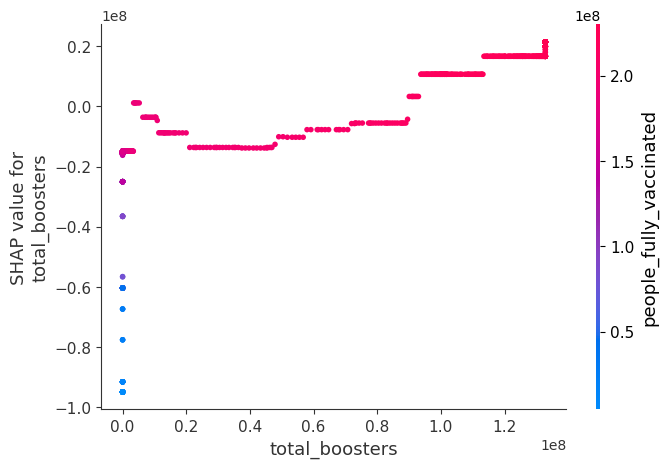

In [156]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, X_train)

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the total population then the relationship will be directly proportional 

Example of SHAP dependence plot of people vaccinated

* In the linear model the relationship is linear between people_vaccinated and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.

* In the tree-based model we could extract the information on how people_vaccinated is affected while being tuned the feature.

# Force Plot SHAP analysis
A force plot is a type of SHAP (SHapley Additive exPlanations) analysis that helps to explain the prediction of a machine learning model by decomposing the contribution of each feature to the final prediction. It is a useful tool for understanding the importance of different features in a model and how they impact the prediction.

This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read.

In [157]:
X_output_linear = X_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = X_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe


In [158]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p


In [159]:
# Initializing JavaScript module
shap.initjs()  
# print(shap_plot_tree(18))  # SHAP force plot for sample 18

# Compute SHAP values for your data
explainer = shap.Explainer(tree_model)
shap_values = explainer(X_train)

# Generate the SHAP force plot for a specific sample
shap.force_plot(shap_values[18], X_train.iloc[18])

Let us consider one sample from the test set, Please refer to the Force Plot below:
* The output of the model is 659343021.64
* The features which had a significant positive impact on total vaccination is were total_booster is 1328328 and days_since is 746

# Heatmap
The Y-axis is features and X-axis is instance of that feature. The resulting SHAP heatmap will display the SHAP values as a color-coded matrix, with each row representing a data point and each column representing a feature. The color of each cell in the matrix represents the magnitude and direction of the SHAP value for that feature and data point.Positive SHAP values are typically displayed as shades of red, while negative SHAP values are typically displayed as shades of blue. The SHAP heatmap generated by this code can be a useful tool for interpreting the output of a linear model and understanding how different features in the model are contributing to its predictions.

### Linear model

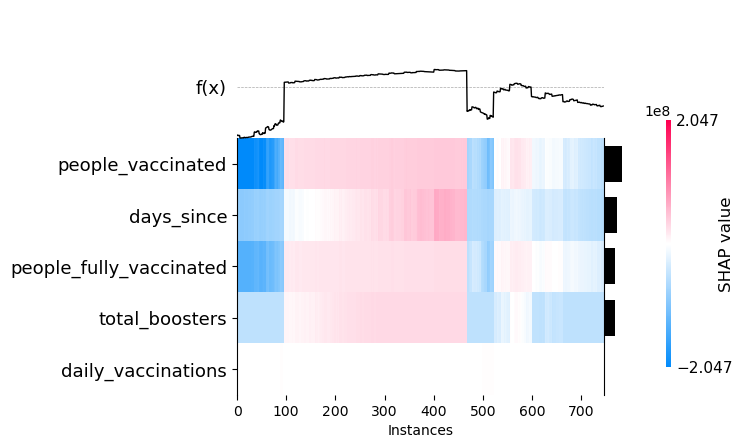

In [160]:
# SHAP heatmap for a Linear Model
shap.plots.heatmap(linear_shap_values)  

## Tree-based model

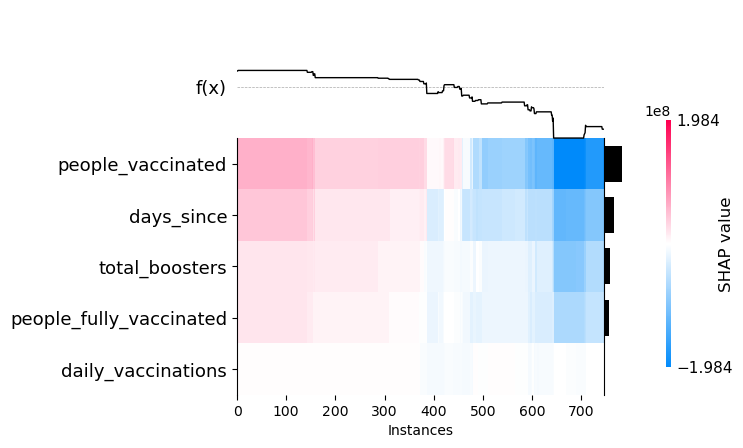

In [161]:
# SHAP HeatMap of a Tree Based Model
shap.plots.heatmap(tree_shap_values)  

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis
LIME (Local Interpretable Model-Agnostic Explanations) is a technique used to explain the predictions of complex machine learning models by generating human-interpretable explanations. It is an interpretable machine learning approach that can provide insights into why a model makes a particular prediction.

The goal of LIME is to provide local, interpretable explanations for individual predictions. This is done by creating a simplified model, known as an "interpretable model," that can be easily understood by humans. The interpretable model is trained on a subset of the data around the prediction of interest, rather than the entire dataset.




## Linear Model


In [162]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [163]:
# Getting LIME interpretation for a sample data
idx = 18
np_X_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_X_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_X_test[idx], linear_model.predict, num_features=np_X_test.shape[1]
)
lime_linear_explanation
 

Prediction :  [6.20838863e+08]
Actual :      [141503472]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [164]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

## Tree based Model


In [165]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)
   

In [166]:
# Getting LIME interpretation for a sample data
idx = 18
np_X_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_X_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_X_test[idx], tree_model.predict, num_features=np_X_test.shape[1]
)
lime_tree_explanation

Prediction :  [5.91771807e+08]
Actual :      [141503472]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



In [167]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook



Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

* As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. 

* The color orange here represents positive and blue represents negative.

* Here for this sample as seen people_vaccinated, total_boosters, people_fully_vaccinated had a positive effect on the total_vaccinations in both models

* daily_vaccinations had a negative effect in the linear model but positive in tree-based model

These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

# Partial Dependence Plot
A Partial Dependence Plot (PDP) is a graphical representation of the relationship between a particular feature and the predicted outcome of a machine learning model. It shows how the predicted outcome changes as the value of the feature changes, while holding all other features constant.

To create a PDP, one first selects a feature of interest and then creates a grid of data points for that feature. For each data point in the grid, the model is used to predict the outcome, while holding all other features constant. The resulting predictions are then plotted on the y-axis, while the feature values are plotted on the x-axis.

## Linear Model
If we closely look at the PDP of the linear model we can see that if features people_vaccinated, daily_vaccinations, total_boosters are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(total_vaccinations) 


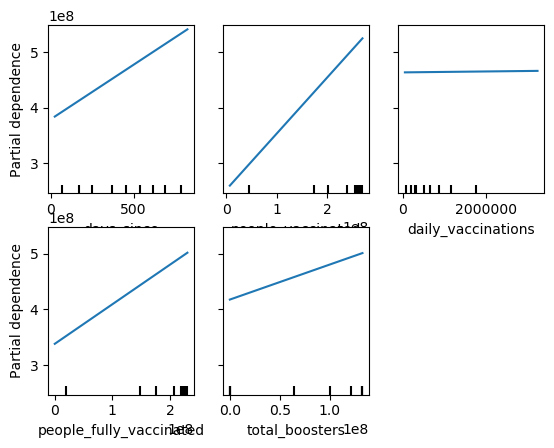

In [168]:
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(linear_model, X_test, X_test.columns)

## Tree based Model


On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

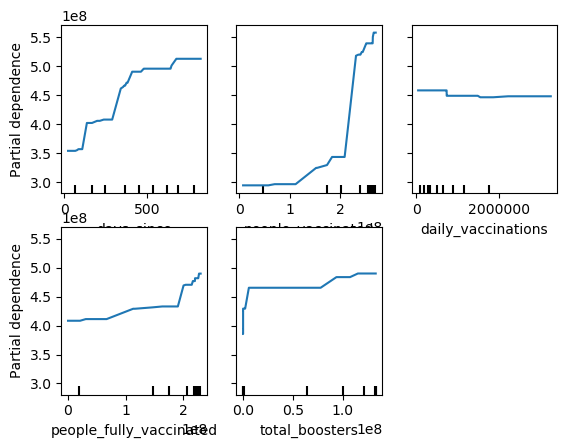

In [169]:
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(tree_model, X_test, X_test.columns)

**Comparision between SHAP, LIME, and Partial Dependence Plot Analysis
SHAP, LIME, and partial dependence plots are three popular methods for interpreting machine learning models.**

SHAP (SHapley Additive exPlanations) and LIME (Local Interpretable Model-agnostic Explanations) are both model-agnostic methods that provide local explanations for individual predictions. Partial dependence plots, on the other hand, are a model-specific method that provide a global view of how a model's predictions change as the value of a single feature varies.

Here are some areas where these methods work well:

SHAP: SHAP is a powerful tool for interpreting models that involve complex feature interactions. It works well in fields like finance and healthcare, where models may have many features that interact with each other to produce a prediction. SHAP can help identify which features are driving specific predictions, even when those features are highly correlated.

LIME: LIME works well in fields like image recognition and natural language processing, where models may be highly complex and difficult to interpret. LIME can help identify which features are important for a specific prediction, even when the model is a "black box" that provides little insight into its decision-making process.

Partial dependence plots: Partial dependence plots are a model-specific method that can be used to visualize the relationship between a single feature and a model's predictions. They work well when trying to understand how a model is making predictions based on a particular feature. For example, in the field of climate science, partial dependence plots can be used to understand how a model's predictions change as temperature or precipitation varies.

In summary, SHAP, LIME, and partial dependence plots can be powerful tools for interpreting machine learning models across a range of fields, but their effectiveness will depend on the specific problem being solved and the type of model being used.

# **What did you learn?**
In conclusion, the project involved working with a Covid vaccination dataset for the United States. Different techniques were used to impute missing values, such as Interpolation, bfill, mean, and zero. The dataset was visualized to gain a better understanding of the variables, and both linear and ARIMA models were trained. KNN was used to handle missing data, and a predictive model was built using H2O AutoML to forecast the total number of vaccinations in the United States. The best algorithm model for prediction was determined to be GBM, and the effects of Ridge and LASSO regularization on the GLM model were studied. The project also involved hyperparameter tuning using the Grid Search method, analyzing the relationship between all the variables using OLS model and VIF, and interpreting the machine learning models using SHAP, LIME, and partial dependence plots. Overall, the project provided valuable insights into the Covid vaccination dataset and demonstrated the effectiveness of various data analysis techniques and modeling methods.

# References
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynb

* https://colab.research.google.com/drive/1wEfzH165Ycm_EqVgwSz_r7SvILuj0KRW?usp=sharing#scrollTo=3f096800-dc6e-4455-a9e6-2db18884e5ee

* https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

* https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

* https://www.kaggle.com/pmarcelino/comprehensive-data-exploration-with-python

* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb

* https://scikit-learn.org/stable/modules/generated/sklearn.inspection.PartialDependenceDisplay.html
https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb
* https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d